### Table of Contents

* [1. Import Libraries](#chapter1)
* [2. Import Dataset](#chapter2)
* [3. Preparation](#chapter3)
    * [3.1. PCA](#section_3_1)
    * [3.2. Variables](#section_3_2)
* [4. KMeans](#chapter4)
    * [4.1. First Clustering](#section_4_1)
    * [4.2. Second Clustering](#section_4_2)
    * [4.3. Third Clustering](#section_4_3)
* [5. Gaussian Mixture](#chapter5)
    * [5.1. First Clustering](#section_5_1)
    * [5.2. Second Clustering](#section_5_2)
    * [5.3. Third Clustering](#section_5_3)
* [6. Clusters Evolution](#chapter6)
    * [6.1. 3 Months](#section_6_1)
    * [6.2. 6 Months](#section_6_2)
    * [6.3. 12 Months](#section_6_3)
* [7. RFM](#chapter7)
    * [7.1. Manual](#section_7_1)
    * [7.2. KMeans](#section_7_2)
    * [7.3. Comparison](#section_7_3)
    * [7.4. Evolution by Time](#section_7_4)
    * [7.5. Mix Clustering](#section_7_5)

# 1. Import Libraries<a class="anchor" id="chapter1"></a>

In [1]:
%load_ext pycodestyle_magic
%flake8_on

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from datetime import timedelta
from sklearn.metrics import silhouette_score
from sklearn import decomposition, preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# 2. Import Dataset<a class="anchor" id="chapter2"></a>

In [3]:
data = pd.read_csv("P05_DataClean.csv", sep=",")

In [4]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [5]:
data.head()

,Unnamed: 0,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,seller_lat,seller_lng,customer_lat,customer_lng,distance_seller_customer,estimate_delivery_time,delivery_time,seller_mean_review_score,purchase_year,purchase_month,purchase_day,purchase_weekday,purchase_hour,nb_orders_customers,total_price,product_volume_cm3,freight_ratio,delivery_time_diff,order_purchase_timestamp_M,CohortMonth,CohortIndex
0,0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,credit_card,1,18.12,a54f0611adc9ed256b57ede6b6eb5114,4,without_comment_title,with_comment_message,2017-10-11 00:00:00,2017-10-12 03:43:48,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,Southeast_Region,home_supply,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,-23.680114,-46.452454,-23.574809,-46.587471,18.06894,15.544063,8.436574,4.431034,2017,month_3,2,week,10,2,38.71,1976.0,0.290764,7.107488,2017-10-01 00:00:00,2017-09-01 00:00:00,2
1,1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,other,1,2.00,a54f0611adc9ed256b57ede6b6eb5114,4,without_comment_title,with_comment_message,2017-10-11 00:00:00,2017-10-12 03:43:48,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,Southeast_Region,home_supply,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,-23.680114,-46.452454,-23.574809,-46.587471,18.06894,15.544063,8.436574,4.431034,2017,month_3,2,week,10,2,38.71,1976.0,0.290764,7.107488,2017-10-01 00:00:00,2017-09-01 00:00:00,2
2,2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,other,1,18.59,a54f0611adc9ed256b57ede6b6eb5114,4,without_comment_title,with_comment_message,2017-10-11 00:00:00,2017-10-12 03:43:48,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,Southeast_Region,home_supply,40.0,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,-23.680114,-46.452454,-23.574809,-46.587471,18.06894,15.544063,8.436574,4.431034,2017,month_3,2,week,10,2,38.71,1976.0,0.290764,7.107488,2017-10-01 00:00:00,2017-09-01 00:00:00,2
3,3,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b080d193f98b0505af,delivered,2018-03-22 17:23:21,2018-03-22 18:05:36,2018-03-23 18:03:03,2018-03-25 17:22:41,2018-04-04 00:00:00,1,6cc44821f36f3156c782da72dd634e47,da8622b14eb17ae2831f4ac5b9dab84a,2018-03-28 18:05:36,99.90,11.79,1,credit_card,2,223.38,3cd186b6013f4145b9bd406847b61f19,5,without_comment_title,with_comment_message,2018-03-26 00:00:00,2018-03-27 02:21:27,8a4002923e801e3120a11070fd31c9e2,3149,sao paulo,Southeast_Region,home_supply,55.0,273.0,1.0,1050.0,38.0,10.0,38.0,13405,piracicaba,SP,-22.716839,-47.657366,-23.574809,-46.587471,145.18746,12.275451,2.999537,4.058860,2018,month_1,22,week,17,1,111.69,14440.0,0.118018,9.275914,2018-03-01 00:00:00,2018-03-01 00:00:00,1
4,4,70b35acffdf851e782ebf6fbc35eb620,8e8ee9b08afb49b

In [6]:
data.drop(columns='Unnamed: 0', inplace=True)

In [7]:
df = data.copy()

In [8]:
sns.set_theme(style='darkgrid')
c = sns.light_palette('blue', as_cmap=True)

# 3. Preparation<a class="anchor" id="chapter3"></a>

## 3.1. PCA<a class="anchor" id="section_3_1"></a>

In [9]:
def display_circles(pcs, n_comp, pca, axis_ranks,
                    labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp:

            # figure initialization
            fig, ax = plt.subplots(figsize=(7, 6))

            # determining the graph of limits
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin = min(pcs[d1, :])
                xmax = max(pcs[d1, :])
                ymin = min(pcs[d2, :])
                ymax = max(pcs[d2, :])

            # arrows display
            # if there are more than 30 arrows,
            # we do not display the triangle at their extremity
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy',
                           scale=1, color="grey")
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(lines,
                                                 axes=ax,
                                                 alpha=.1,
                                                 color='black'))

            # Variable names display
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation,
                                 color="blue", alpha=0.5)

            # circle display
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # definition of graph limits
            plt.xlim(-1, 1)
            plt.ylim(-1, 1)

            # display of horizontal and vertical lines
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # name of the axes, with the percentage of inertia explained
            plt.xlabel('F{} ({}%)'.format(d1+1,
                                          round(100 *
                                                pca
                                                .explained_variance_ratio_[d1],
                                                1)))
            plt.ylabel('F{} ({}%)'.format(d2+1,
                                          round(100 *
                                                pca
                                                .explained_variance_ratio_[d2],
                                                1)))

            plt.title("Correlation circle (F{} and F{})".format(d1+1, d2+1))
            plt.show(block=False)


def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(), c="red", marker='o')
    plt.xlabel("rank of the inertia axis")
    plt.ylabel("percentage of inertia")
    plt.title("Scree of eigenvalues")
    plt.show(block=False)

In [10]:
def clustering_pca_kmeans(df, columns, nb_clusters):
    # choice of the number of components to be calculated
    n_comp = len(columns)

    # selection of columns to be taken into account in the PCA
    data_pca = df[columns]

    # data preparation for PCA
    X = data_pca.values
    features = data_pca.columns

    # standardization
    # X_scaled = preprocessing.StandardScaler().fit_transform(X)

    # Calculation of principal components
    pca = decomposition.PCA(n_components=n_comp, random_state=42)
    pca.fit(X)

    # Scree eigenvalues
    display_scree_plot(pca)

    # Correlation circle
    pcs = pca.components_
    display_circles(pcs, n_comp, pca,
                    [(0, 1), (2, 3), (4, 5)], labels=np.array(features))

    # Projection of individuals
    X_projected = pca.transform(X)

    model = KMeans(nb_clusters, random_state=42)
    model.fit(df)
    df['Cluster'] = model.predict(df)

    axis_ranks = [(0, 1), (2, 3), (4, 5)]
    for d1, d2 in axis_ranks:
        fig, scatter = plt.subplots(figsize=(10, 10))
        sns.scatterplot(X_projected[:, d1], X_projected[:, d2],
                        data=df, hue=df['Cluster'], palette='Paired')

        centers = pca.transform(model.cluster_centers_)
        # Draw white circles at cluster centers
        sns.scatterplot(centers[:, 0], centers[:, 1], marker='o',
                        color="white", alpha=1, edgecolor='k')

        plt.xlabel('F{} ({}%)'.format(d1+1,
                                      round(100 *
                                            pca
                                            .explained_variance_ratio_[d1],
                                            1)))
        plt.ylabel('F{} ({}%)'.format(d2+1,
                                      round(100 *
                                            pca
                                            .explained_variance_ratio_[d2],
                                            1)))
        plt.title("Projection of individuals (on F{} and F{})"
                  .format(d1+1, d2+1))

        plt.show()

In [11]:
def clustering_pca_GM(df, columns, nb_clusters):
    # choice of the number of components to be calculated
    n_comp = len(columns)

    # selection of columns to be taken into account in the PCA
    data_pca = df[columns]

    # data preparation for PCA
    X = data_pca.values
    features = data_pca.columns

    # standardization
    # X_scaled = preprocessing.StandardScaler().fit_transform(X)

    # Calculation of principal components
    pca = decomposition.PCA(n_components=n_comp, random_state=42)
    pca.fit(X)

    # Scree eigenvalues
    display_scree_plot(pca)

    # Correlation circle
    pcs = pca.components_
    display_circles(pcs, n_comp, pca,
                    [(0, 1), (2, 3), (4, 5)], labels=np.array(features))

    # Projection of individuals
    X_projected = pca.transform(X)

    model = GaussianMixture(nb_clusters, random_state=42)
    df['Cluster'] = model.fit_predict(df)

    axis_ranks = [(0, 1), (2, 3), (4, 5)]
    for d1, d2 in axis_ranks:
        fig, scatter = plt.subplots(figsize=(10, 10))
        sns.scatterplot(X_projected[:, d1], X_projected[:, d2],
                        data=df, hue=df['Cluster'], palette='Paired')

        plt.xlabel('F{} ({}%)'.format(d1+1,
                                      round(100 *
                                            pca
                                            .explained_variance_ratio_[d1],
                                            1)))
        plt.ylabel('F{} ({}%)'.format(d2+1,
                                      round(100 *
                                            pca
                                            .explained_variance_ratio_[d2],
                                            1)))
        plt.title("Projection of individuals (on F{} and F{})"
                  .format(d1+1, d2+1))

        plt.show()

In [12]:
def pca(df, columns, hue):
    # choice of the number of components to be calculated
    n_comp = len(columns)

    # selection of columns to be taken into account in the PCA
    data_pca = df[columns]

    # data preparation for PCA
    X = data_pca.values
    features = data_pca.columns

    # standardization
    X_scaled = preprocessing.StandardScaler().fit_transform(X)

    # Calculation of principal components
    pca = decomposition.PCA(n_components=n_comp, random_state=42)
    pca.fit(X_scaled)

    # Scree eigenvalues
    display_scree_plot(pca)

    # Correlation circle
    pcs = pca.components_
    display_circles(pcs, n_comp, pca,
                    [(0, 1)], labels=np.array(features))

    # Projection of individuals
    X_projected = pca.transform(X_scaled)

    axis_ranks = [(0, 1)]
    for d1, d2 in axis_ranks:
        fig, scatter = plt.subplots(figsize=(10, 10))
        sns.scatterplot(X_projected[:, d1], X_projected[:, d2],
                        data=df, hue=hue, palette='Paired')
        plt.xlabel('F{} ({}%)'.format(d1+1,
                                      round(100 * pca
                                            .explained_variance_ratio_[d1],
                                            1)))
        plt.ylabel('F{} ({}%)'.format(d2+1,
                                      round(100 * pca
                                            .explained_variance_ratio_[d2],
                                            1)))
        plt.title("Projection of individuals (on F{} and F{})"
                  .format(d1+1, d2+1))

        plt.show()

## 3.2. Variables<a class="anchor" id="section_3_2"></a>

In [13]:
def data_transform(df):
    categorical_features =\
        df.select_dtypes('object').columns.tolist()
    numerical_features =\
        df.select_dtypes(['float64', 'int64']).columns.tolist()

    ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
    enc = ohe.fit_transform(df[categorical_features])

    ohe_columns = ohe.get_feature_names(categorical_features).tolist()
    df_ohe = pd.DataFrame(enc, columns=ohe_columns)
    df_prepared = pd.concat([df, df_ohe], axis=1)
    df_prepared.drop(columns=categorical_features, inplace=True)

    scaler = StandardScaler().fit(df_prepared[numerical_features])
    df_prepared[numerical_features] =\
        scaler.transform(df_prepared[numerical_features])
    return df_prepared

# 4. KMeans<a class="anchor" id="chapter4"></a>

- In this first section, we will create clusters with the KMeans algorithm.

## 4.1. First Clustering<a class="anchor" id="section_4_1"></a>

- First, we will create clusters with a maximum of features.

In [14]:
df1 = df[['total_price',
          'payment_type',
          'payment_installments',
          'review_score',
          'review_comment_title',
          'review_comment_message',
          'customer_state',
          'product_category_name',
          'product_name_lenght',
          'product_description_lenght',
          'product_photos_qty',
          'product_weight_g',
          'purchase_year',
          'purchase_month',
          'purchase_day',
          'purchase_weekday',
          'purchase_hour',
          'nb_orders_customers']]

In [15]:
df1_prepared = data_transform(df1)

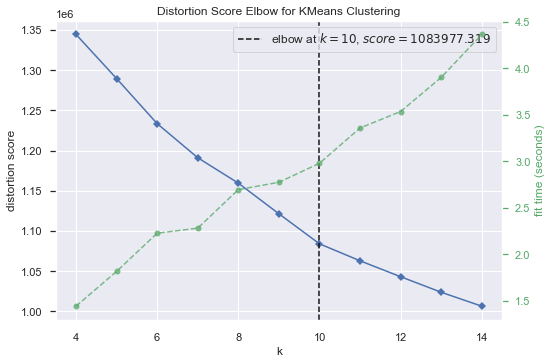

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [16]:
model1 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model1, k=(4, 15), random_state=42)

visualizer.fit(df1_prepared.copy())
visualizer.poof()

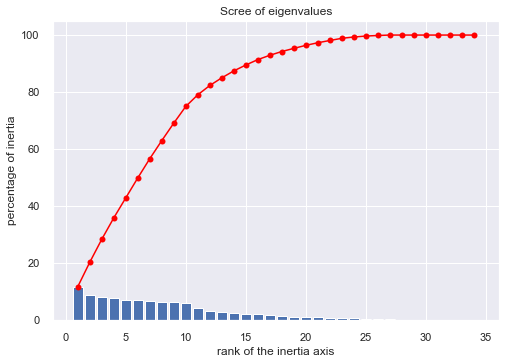

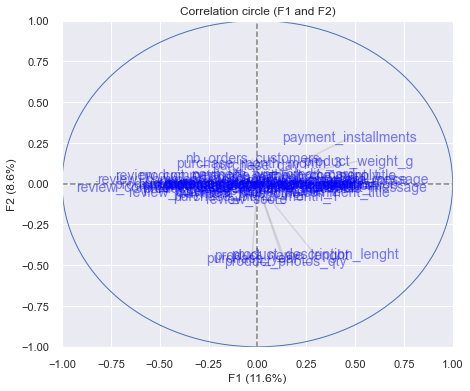

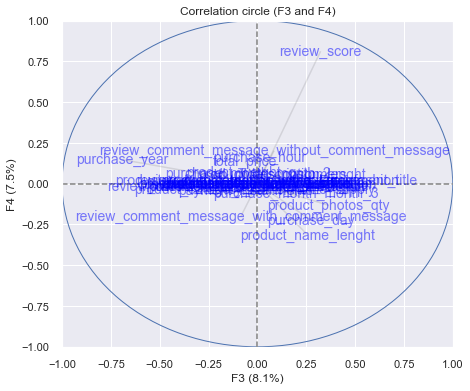

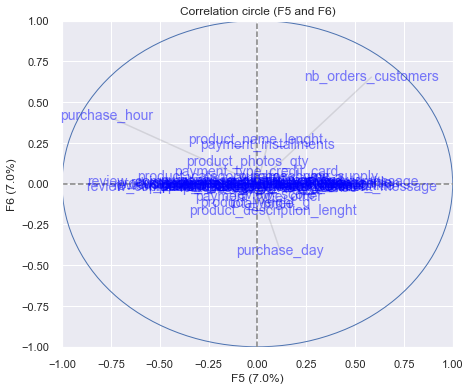

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


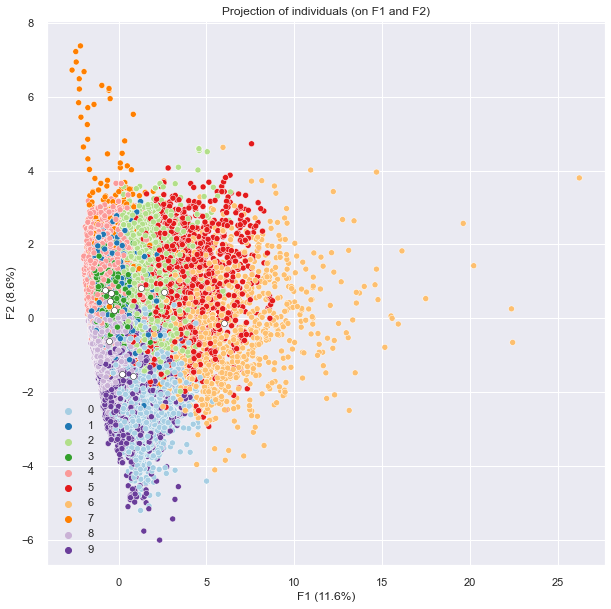

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


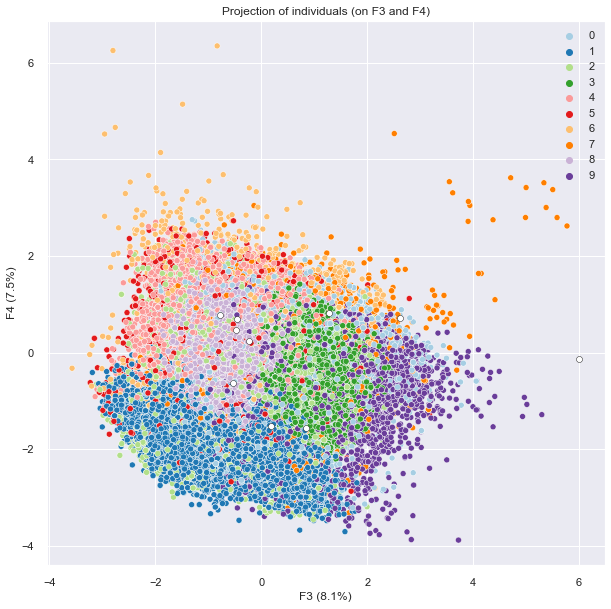

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


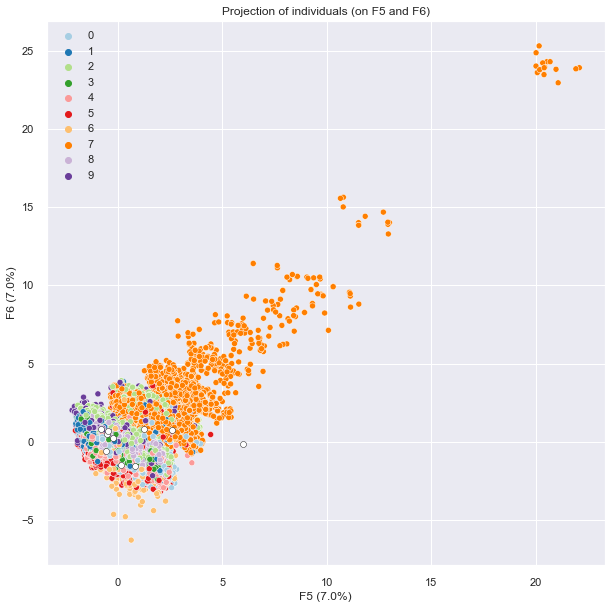

In [17]:
clustering_pca_kmeans(df1_prepared.copy(), df1_prepared.columns.tolist(), 10)

In [18]:
model1 = KMeans(10, random_state=42)

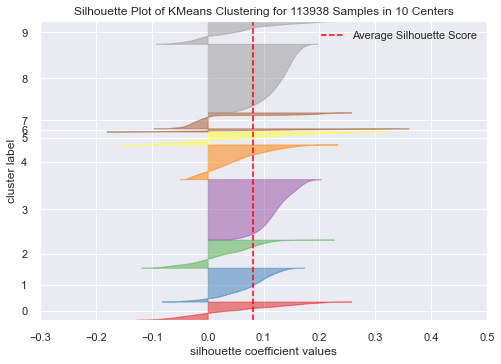

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 113938 Samples in 10 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [19]:
visualizer = SilhouetteVisualizer(model1)

visualizer.fit(df1_prepared.copy())
visualizer.poof()

In [20]:
cluster_labels = model1.fit_predict(df1_prepared.copy())

silhouette_avg = silhouette_score(df1_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.08193671100170959


In [21]:
model1.fit(df1_prepared)
df1_prepared['Cluster_1'] = model1.predict(df1_prepared)

In [22]:
cluster_gp_1 = df1_prepared.groupby('Cluster_1').mean()

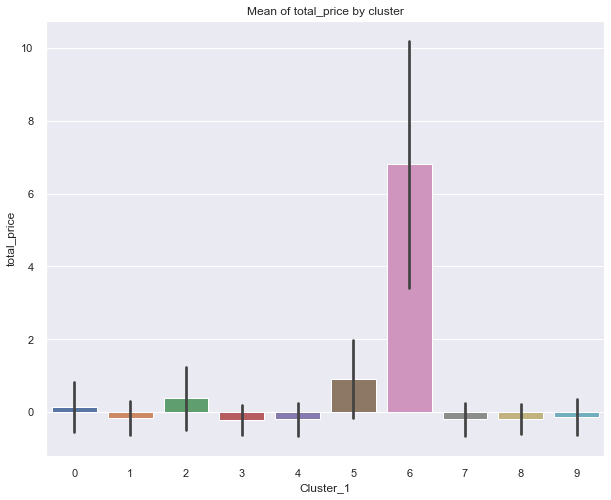

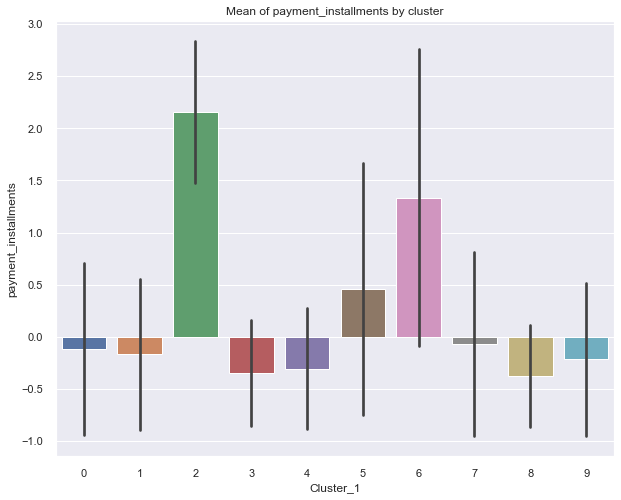

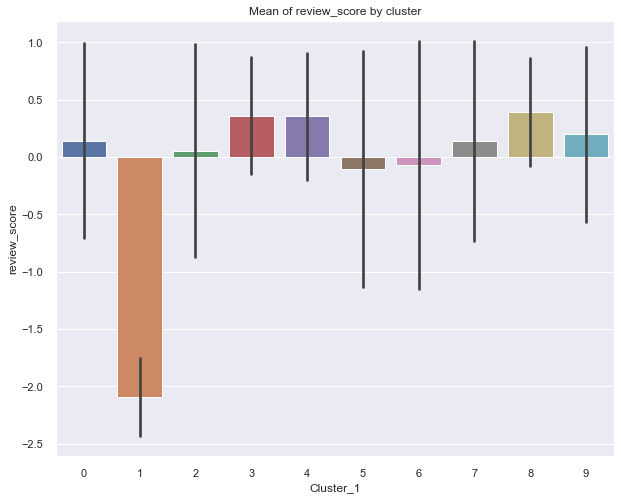

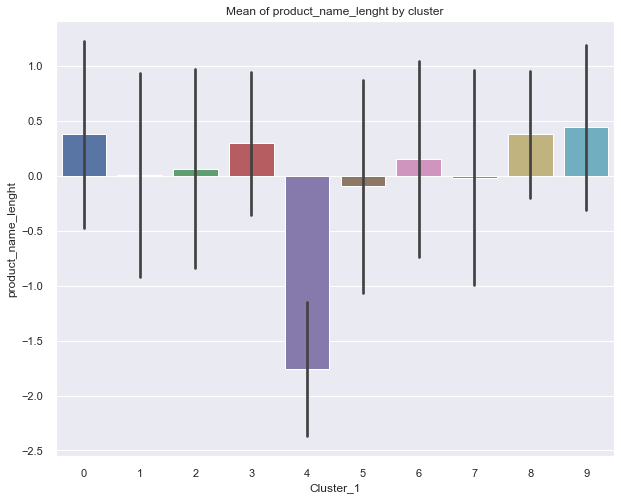

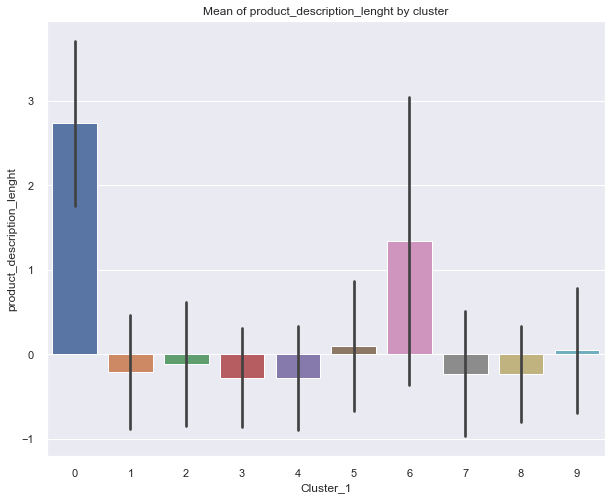

...

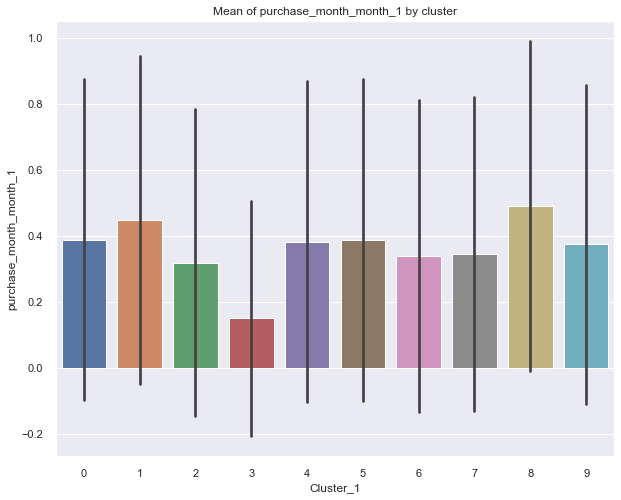

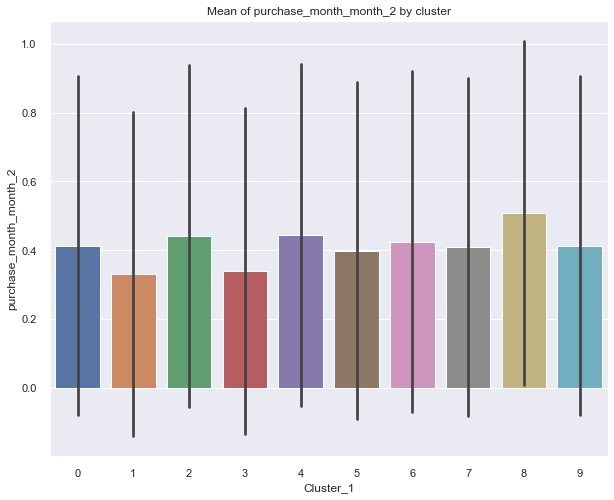

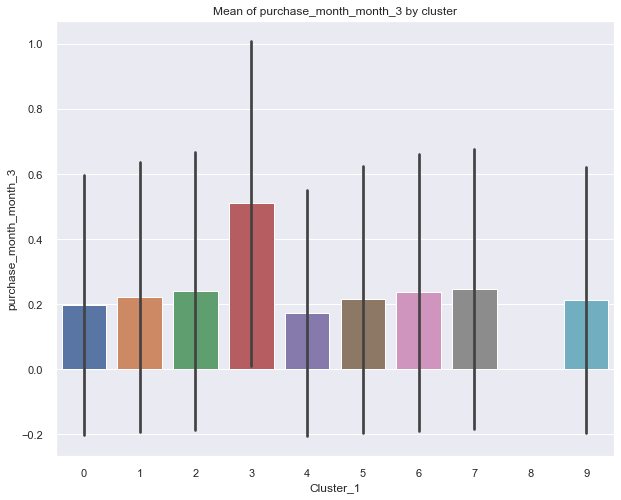

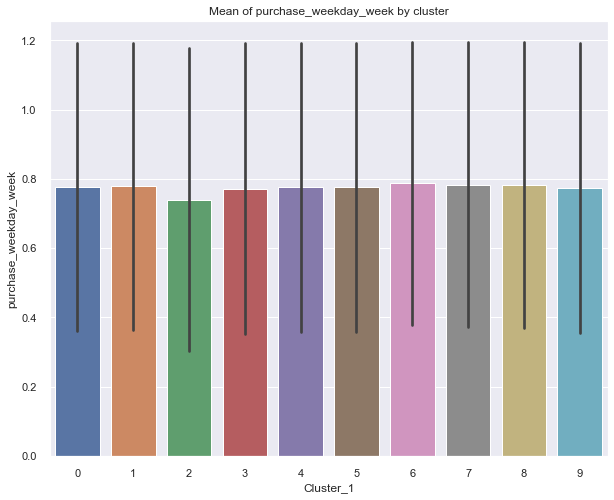

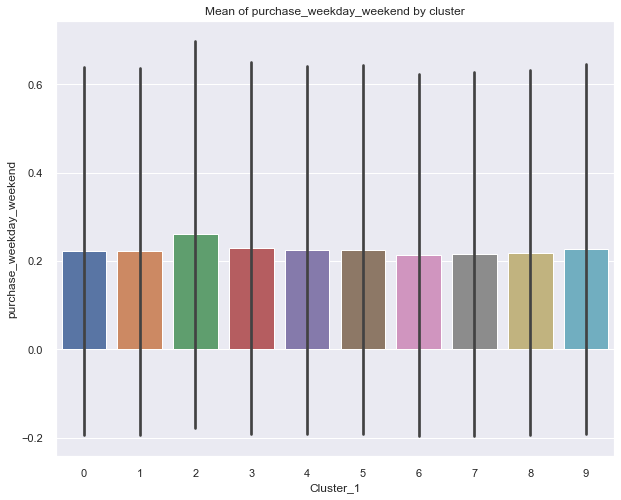

In [23]:
for i in cluster_gp_1.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_1',
                y=i,
                data=df1_prepared,
                ci="sd")
    plt.show()

In [24]:
cluster_gp_1.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,payment_installments,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,purchase_year,purchase_day,purchase_hour,nb_orders_customers,payment_type_credit_card,payment_type_other,review_comment_title_with_comment_title,review_comment_title_without_comment_title,review_comment_message_with_comment_message,review_comment_message_without_comment_message,customer_state_Central_West_Region,customer_state_North_Region,customer_state_Northeast_Region,customer_state_South_Region,customer_state_Southeast_Region,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other,purchase_month_month_1,purchase_month_month_2,purchase_month_month_3,purchase_weekday_week,purchase_weekday_weekend
Cluster_1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.139212,-0.117781,0.143759,0.376023,2.737306,0.142022,-0.064349,0.144644,0.011632,-0.055147,-0.131531,0.733036,0.266964,0.126351,0.873649,0.390146,0.609854,0.060222,0.021611,0.109782,0.143927,0.664458,0.030111,0.209480,0.249100,0.159919,0.197954,0.018441,0.134995,0.388129,0.413773,0.198098,0.777698,0.222302
1,-0.174828,-0.168152,-2.091099,0.005010,-0.205826,-0.193618,-0.186734,0.116027,-0.000365,-0.033396,-0.160369,0.715372,0.284628,0.184294,0.815706,0.808179,0.191821,0.061224,0.019011,0.112516,0.137037,0.670210,0.021883,0.217351,0.185924,0.295414,0.107550,0.036859,0.135020,0.448204,0.330566,0.221231,0.778459,0.221541
2,0.371480,2.156050,0.057317,0.061106,-0.116253,-0.171579,0.047680,-0.150934,-0.002068,0.039189,-0.096282,1.000000,0.000000,0.112364,0.887636,0.454859,0.545141,0.060002,0.020311,0.126898,0.157645,0.635144,0.032330,0.107519,0.248859,0.336719,0.094568,0.041088,0.138917,0.318178,0.441349,0.240473,0.740054,0.259946
3,-0.218616,-0.344715,0.359185,0.292645,-0.277936,-0.237352,-0.224361,-1.097736,0.083135,0.019657,-0.213414,0.676044,0.323956,0.000304,0.999696,0.362291,0.637709,0.053920,0.019189,0.087393,0.148346,0.691152,0.008553,0.191456,0.184423,0.275810,0.129938,0.038595,0.171225,0.149518,0.339889,0.510593,0.770904,0.229096
4,-0.204493,-0.304677,0.357285,-1.759499,-0.279835,-0.269605,-0.271169,0.055686,-0.036567,0.006276,-0.201346,0.723317,0.276683,0.102047,0.897953,0.322683,0.677317,0.053554,0.015333,0.075308,0.135358,0.720447,0.014956,0.195332,0.268147,0.170783,0.192160,0.034293,0.124330,0.381524,0.444898,0.173578,0.775285,0.224715
5,0.908015,0.462019,-0.103801,-0.099014,0.096905,-0.106197,3.530824,-0.032676,-0.006712,-0.002958,-0.084848,0.750913,0.249087,0.119270,0.880730,0.468763,0.531237,0.046045,0.022312,0.094929,0.120081,0.716633,0.047465,0.064300,0.089452,0.368763,0.053550,0.223529,0.152941,0.387018,0.398174,0.214807,0.775051,0.224949
6,6.803208,1.334585,-0.069912,0.149648,1.339089,0.496516,1.443752,0.025551,-0.017066,0.029840,-0.148797,0.827303,0.172697,0.185033,0.814967,0.493421,0.506579,0.076480,0.051809,0.152961,0.145559,0.573191,0.030428,0.292763,0.194901,0.165296,0.111020,0.030428,0.175164,0.337993,0.425164,0.236842,0.787007,0.212993
7,-0.205323,-0.067965,0.140760,-0.019590,-0.230235,-0.174189,-0.199918,-0.156468,0.002594,-0.067641,3.161575,0.705124,0.294876,0.093223,0.906777,0.383636,0.616364,0.050413,0.017355,0.069917,0.142149,0.720165,0.021157,0.152397,0.192231,0.364959,0.128595,0.021983,0.118678,0.345124,0.408595,0.246281,0.783306,0.216694
8,-0.199801,-0.374049,0.394989,0.374605,-0.233508,-0.289734,-0.240683,0.910966,-0.056832,0.002599,-0.213414,0.709764,0.290236,0.205864,0.794136,0.340087,0.659913,0.057879,0.014030,0.078102,0.141372,0.708617,0.030507,0.219245,0.194472,0.266228,0.107921,0.039070,0.142557,0.490901,0.509099,0.000000,0.781291,0.218709


Text(0, 0.5, 'Count')

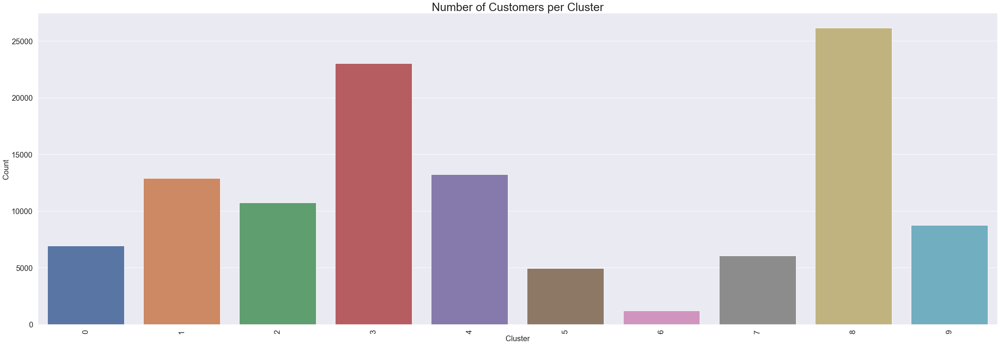

In [25]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df1_prepared['Cluster_1'].value_counts().index,
            y=df1_prepared['Cluster_1'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- It is difficult to interpret these clusters because of the large number of features.

## 4.2. Second Clustering<a class="anchor" id="section_4_2"></a>

- In this part, we will create clusters by product informations.

In [26]:
df2 = df[['total_price',
          'product_category_name',
          'product_name_lenght',
          'product_description_lenght',
          'product_photos_qty',
          'product_weight_g']]

In [27]:
df2_prepared = data_transform(df2)

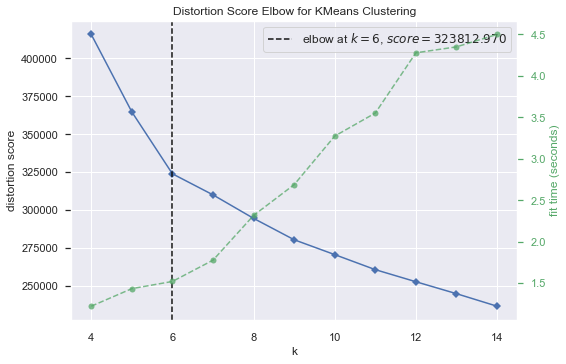

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [28]:
model2 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model2, k=(4, 15), random_state=42)

visualizer.fit(df2_prepared.copy())
visualizer.poof()

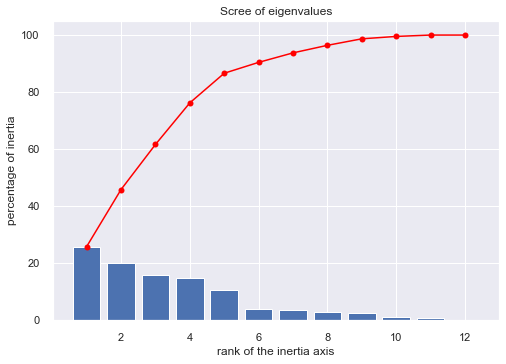

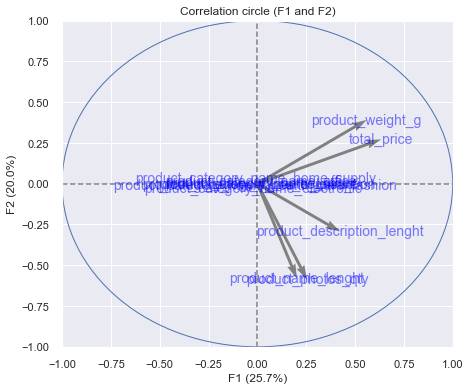

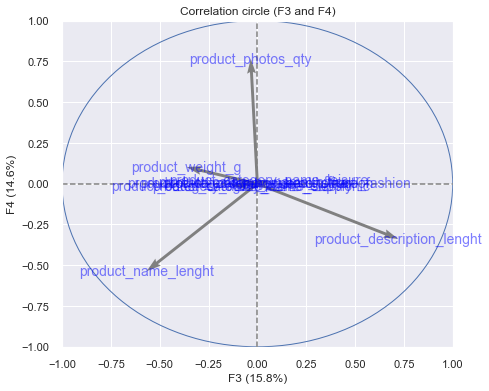

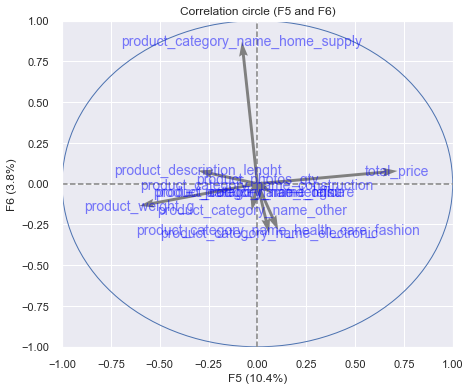

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


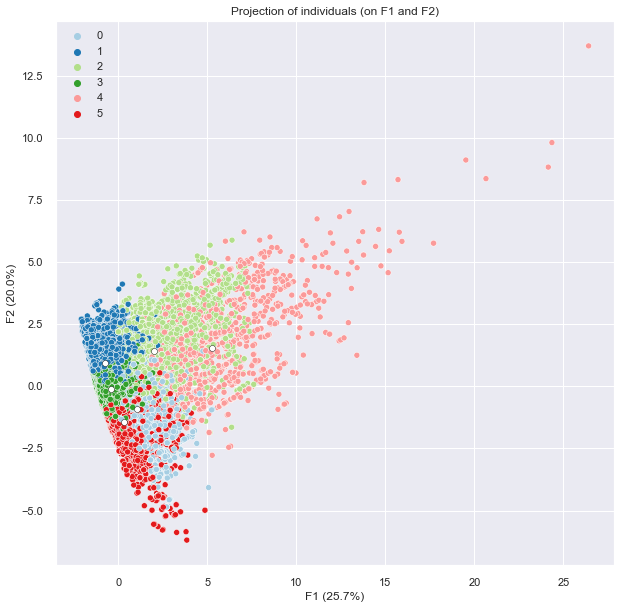

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


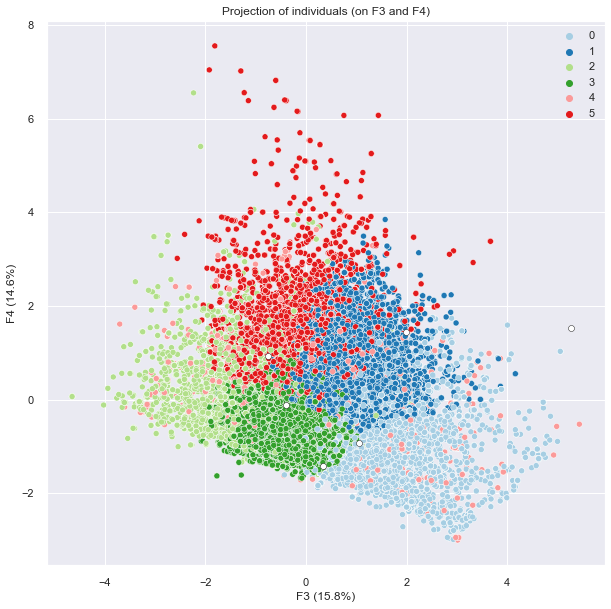

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


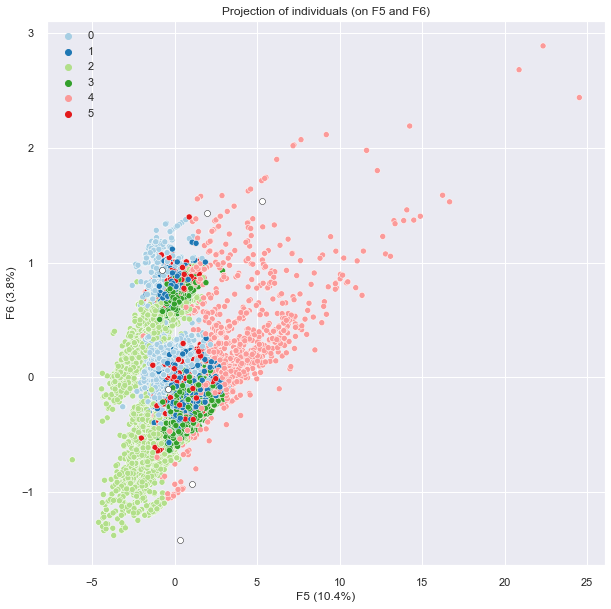

In [29]:
clustering_pca_kmeans(df2_prepared.copy(), df2_prepared.columns.tolist(), 6)

In [30]:
model2 = KMeans(6, random_state=42)

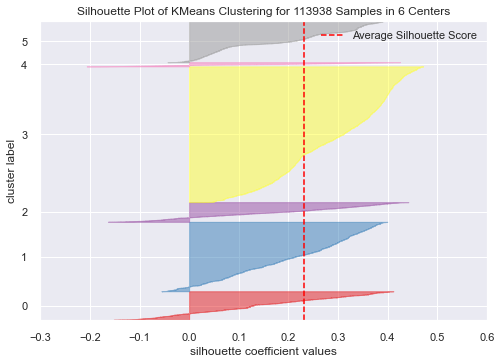

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 113938 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [31]:
visualizer = SilhouetteVisualizer(model2)

visualizer.fit(df2_prepared.copy())
visualizer.poof()

In [32]:
cluster_labels = model2.fit_predict(df2_prepared.copy())

silhouette_avg = silhouette_score(df2_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.2312962243883703


In [33]:
model2.fit(df2_prepared)
df2_prepared['Cluster_2'] = model2.predict(df2_prepared)

In [34]:
cluster_gp_2 = df2_prepared.groupby('Cluster_2').mean()

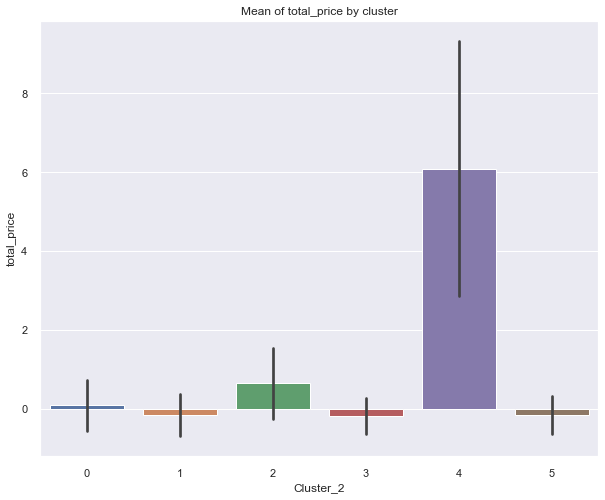

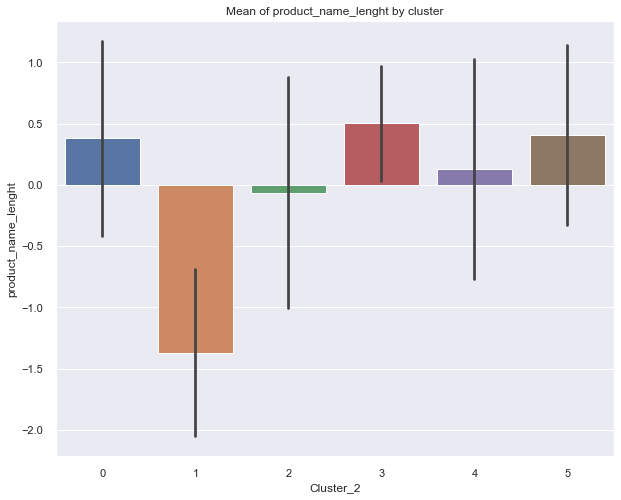

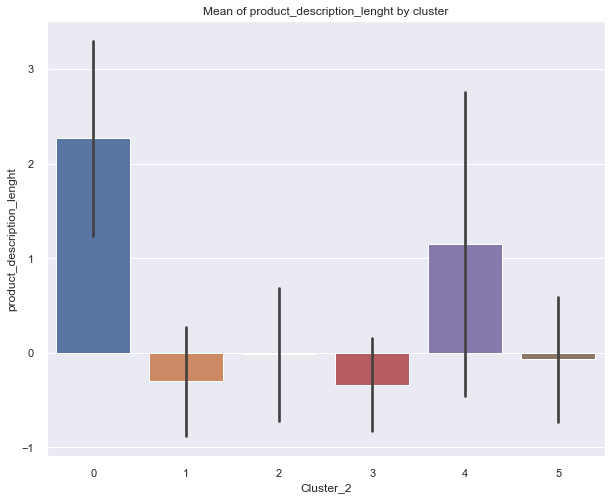

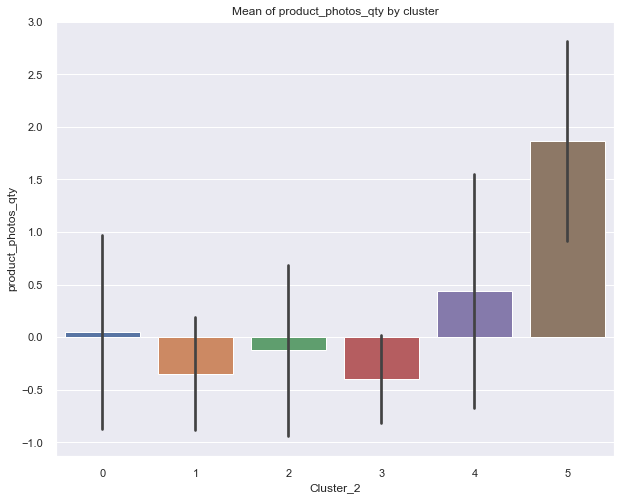

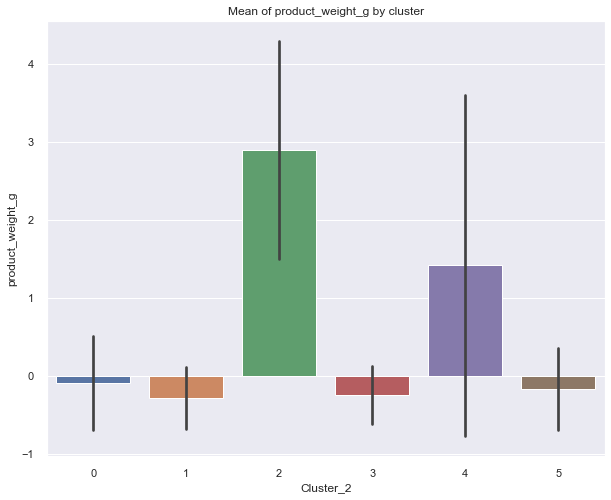

...

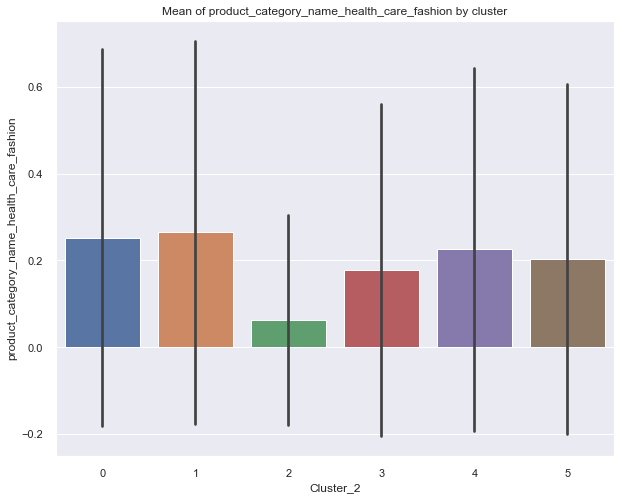

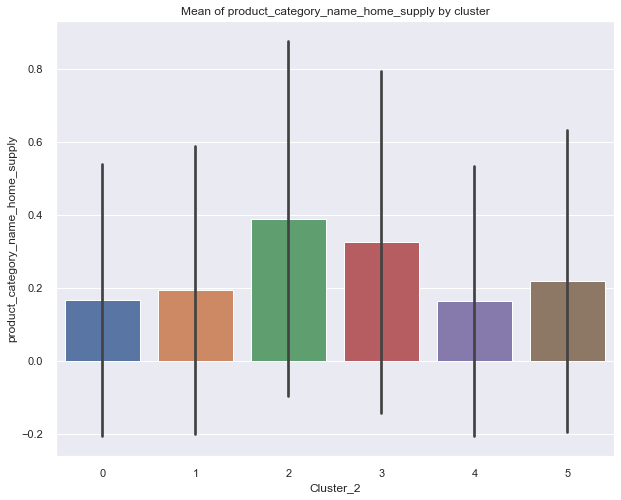

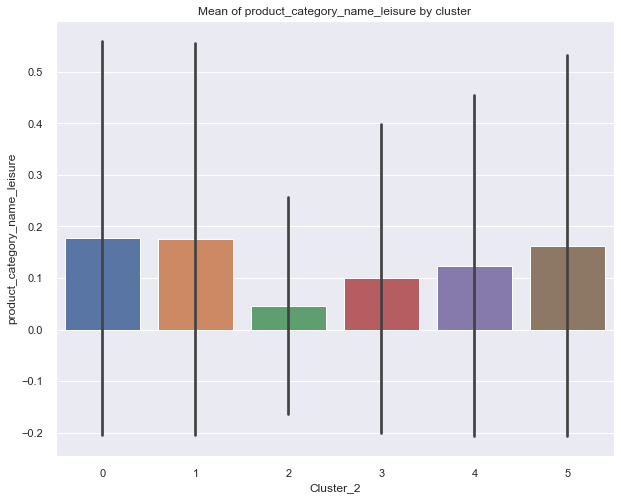

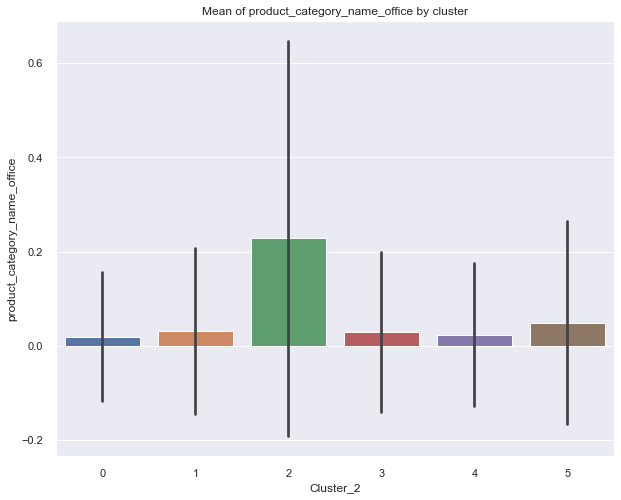

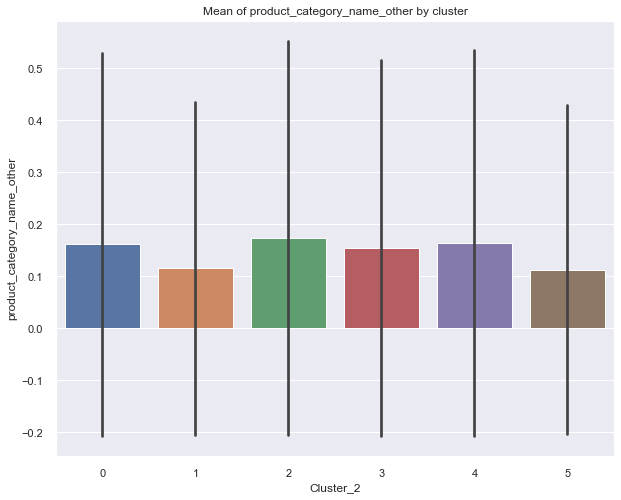

In [35]:
for i in cluster_gp_2.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_2',
                y=i,
                data=df2_prepared,
                ci="sd")
    plt.show()

In [36]:
cluster_gp_2.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other
Cluster_2,,,,,,,,,,,,
0,0.093267,0.378740,2.265974,0.048032,-0.096324,0.029233,0.192131,0.252620,0.167402,0.177790,0.019213,0.161611
1,-0.149736,-1.370390,-0.301302,-0.346303,-0.282810,0.018520,0.199562,0.264721,0.194421,0.174843,0.032126,0.115806
2,0.647763,-0.063230,-0.016141,-0.125398,2.895894,0.040816,0.057890,0.062825,0.390023,0.046285,0.228091,0.174070
3,-0.180116,0.502925,-0.334534,-0.396863,-0.247442,0.020517,0.191032,0.178146,0.326810,0.099592,0.029540,0.154363
4,6.093272,0.130164,1.146892,0.438325,1.414060,0.036386,0.262233,0.225220,0.163739,0.124216,0.023839,0.164366
5,-0.145956,0.404602,-0.067857,1.868154,-0.166750,0.040889,0.211048,0.203810,0.219111,0.162984,0.049016,0.113143


Text(0, 0.5, 'Count')

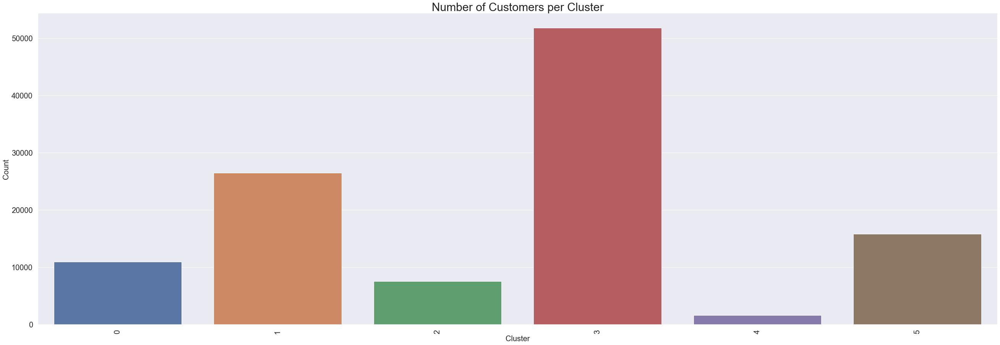

In [37]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df2_prepared['Cluster_2'].value_counts().index,
            y=df2_prepared['Cluster_2'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- Cluster 0 :
    - product_description_lenght +
- Cluster 1 :
    - product_name_lenght -
- Cluster 2 :
    - product_weight_g +
    - product_category_name_electronic -
    - product_category_name_health_care_fashion -
    - product_category_name_home_supply +
    - product_category_name_leisure -
    - product_category_name_office +
- Cluster 3 :
    - product_category_name_home_supply +
- Cluster 4 :
    - total_price +
    - product_description_lenght +
    - product_weight_g +
- Cluster 5 :
    - product_photos_qty +

## 4.3. Third Clustering<a class="anchor" id="section_4_3"></a>

- In this part, we will create clusters by customer habit.

In [38]:
df3 = df[['total_price',
          'payment_type',
          'payment_installments',
          'review_score',
          'review_comment_title',
          'review_comment_message',
          'purchase_year',
          'purchase_month',
          'purchase_day',
          'purchase_weekday',
          'purchase_hour',
          'nb_orders_customers']]

In [39]:
df3_prepared = data_transform(df3)

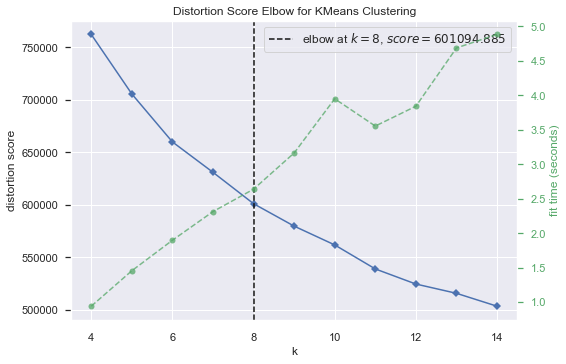

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [40]:
model3 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model3, k=(4, 15), random_state=42)

visualizer.fit(df3_prepared.copy())
visualizer.poof()

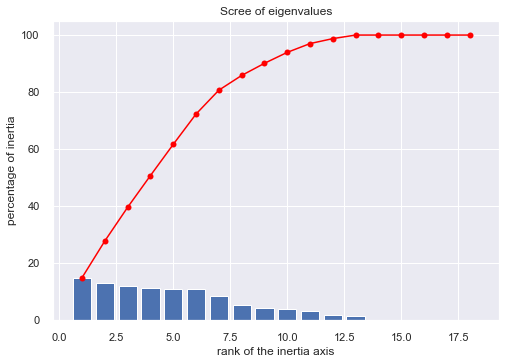

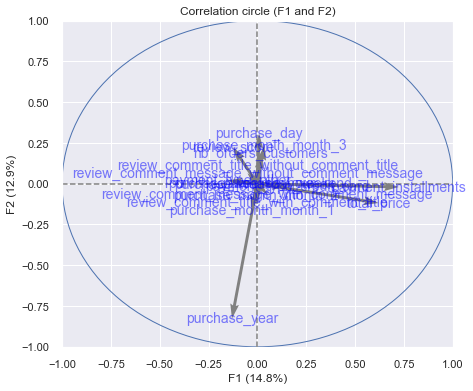

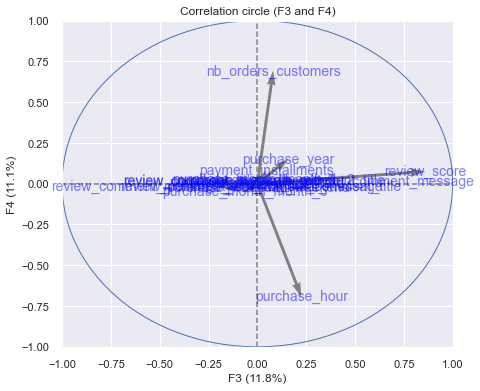

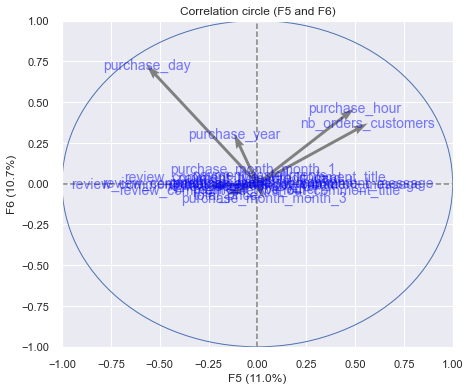

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


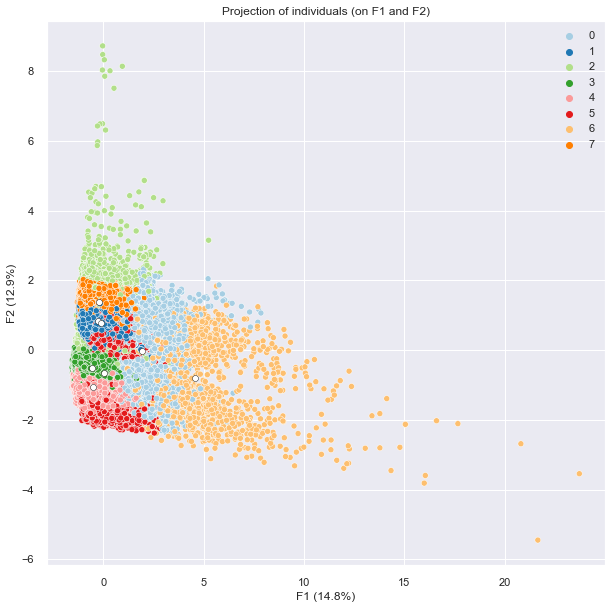

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


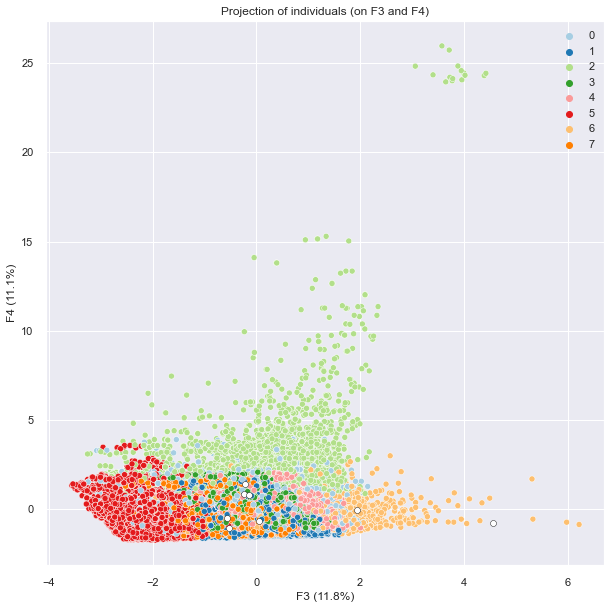

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


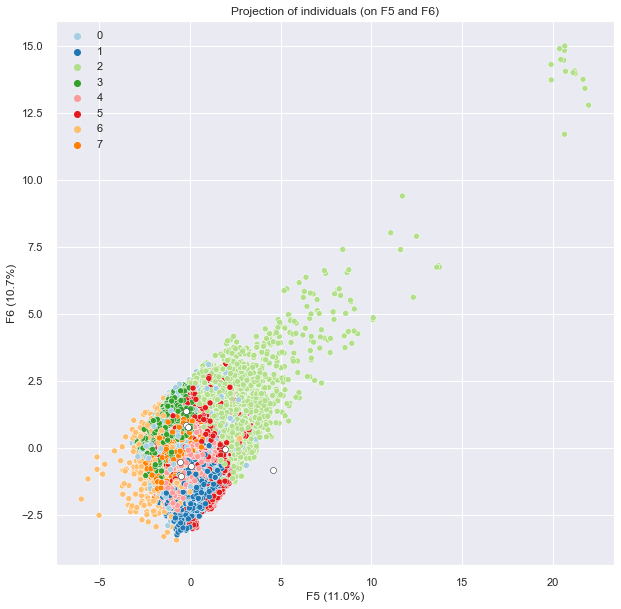

In [41]:
clustering_pca_kmeans(df3_prepared.copy(), df3_prepared.columns.tolist(), 8)

In [42]:
model3 = KMeans(8, random_state=42)

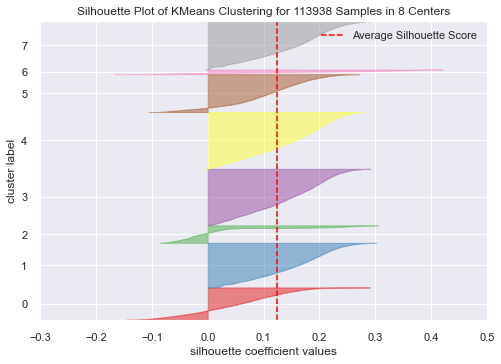

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 113938 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [43]:
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(df3_prepared.copy())
visualizer.poof()

In [44]:
cluster_labels = model3.fit_predict(df3_prepared.copy())

silhouette_avg = silhouette_score(df3_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.12383199129875265


In [45]:
model3.fit(df3_prepared)
df3_prepared['Cluster_3'] = model3.predict(df3_prepared)

In [46]:
cluster_gp_3 = df3_prepared.groupby('Cluster_3').mean()

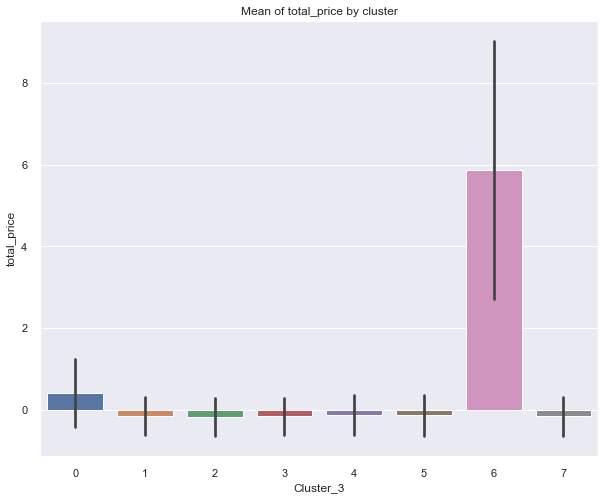

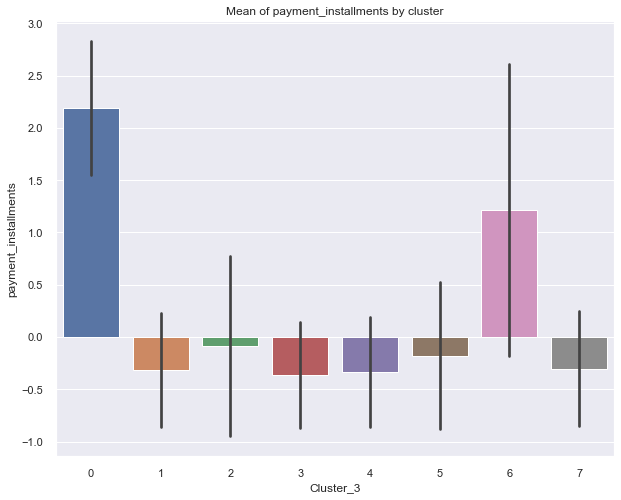

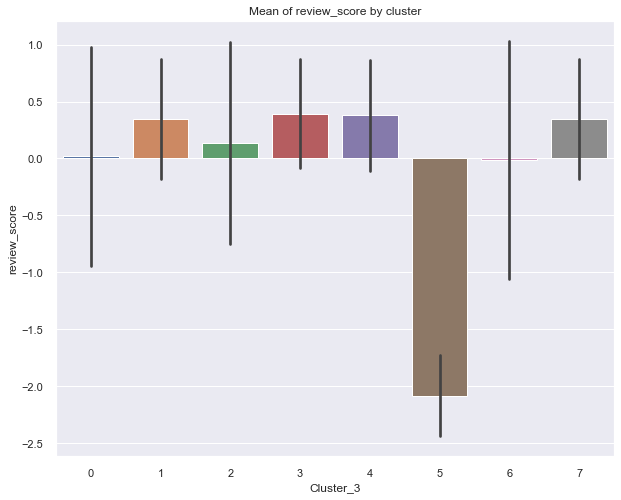

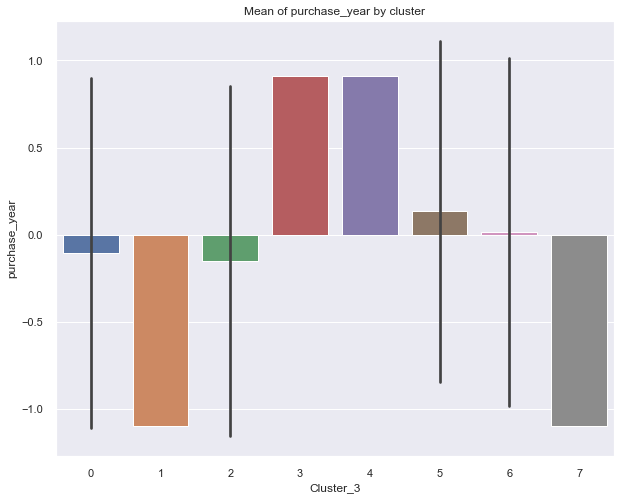

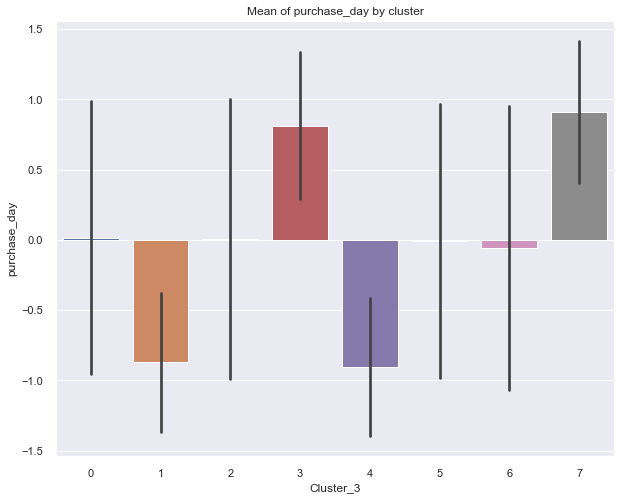

...

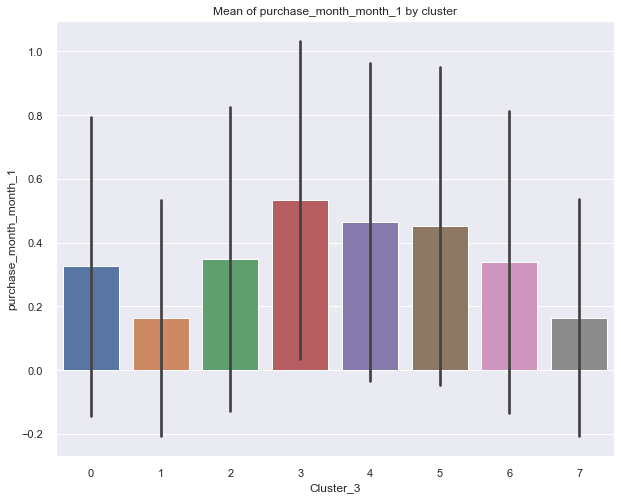

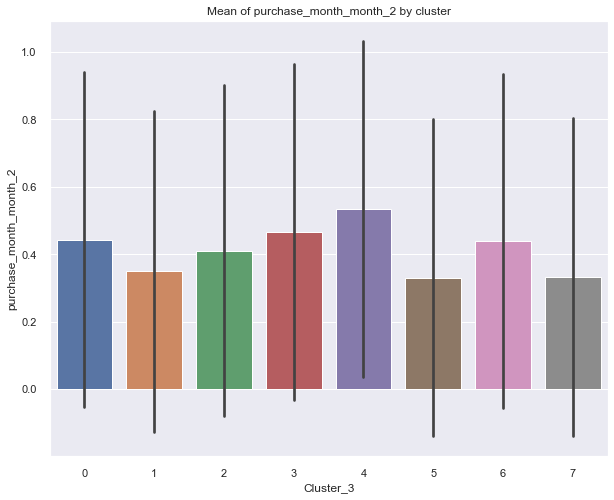

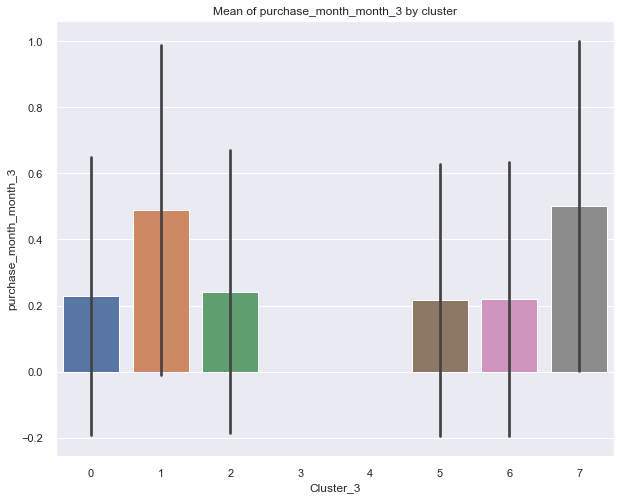

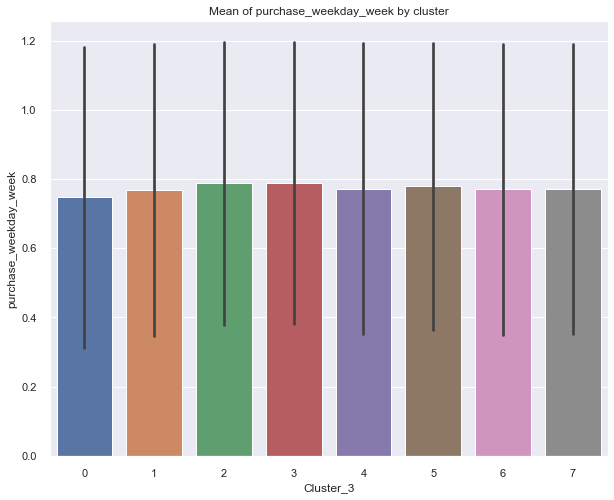

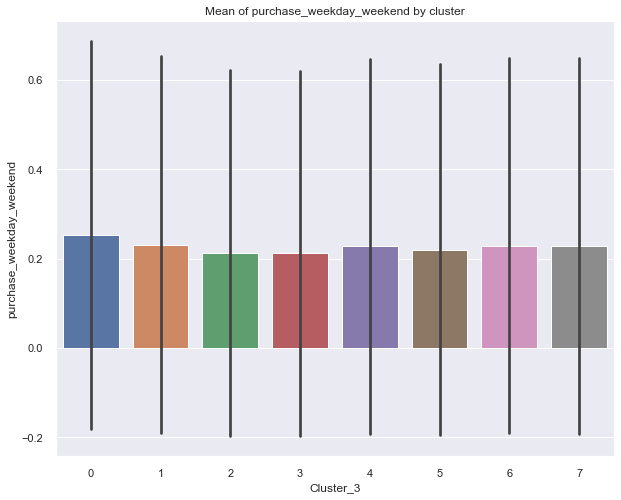

In [47]:
for i in cluster_gp_3.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_3',
                y=i,
                data=df3_prepared,
                ci="sd")
    plt.show()

In [48]:
cluster_gp_3.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,payment_installments,review_score,purchase_year,purchase_day,purchase_hour,nb_orders_customers,payment_type_credit_card,payment_type_other,review_comment_title_with_comment_title,review_comment_title_without_comment_title,review_comment_message_with_comment_message,review_comment_message_without_comment_message,purchase_month_month_1,purchase_month_month_2,purchase_month_month_3,purchase_weekday_week,purchase_weekday_weekend
Cluster_3,,,,,,,,,,,,,,,,,,
0,0.411866,2.191688,0.017623,-0.103564,0.015256,0.028154,-0.094063,1.000000,0.000000,0.120895,0.879105,0.460472,0.539528,0.326766,0.443526,0.229709,0.746696,0.253304
1,-0.154652,-0.313489,0.348836,-1.097736,-0.872466,0.014311,-0.213414,0.681332,0.318668,0.000353,0.999647,0.363487,0.636513,0.163040,0.349018,0.487943,0.768380,0.231620
2,-0.182206,-0.085530,0.135226,-0.152216,0.005200,-0.066913,3.094517,0.698859,0.301141,0.095524,0.904476,0.388405,0.611595,0.347852,0.410484,0.241664,0.787474,0.212526
3,-0.165700,-0.363003,0.393052,0.910966,0.812302,-0.044262,-0.213414,0.708202,0.291798,0.206485,0.793515,0.341251,0.658749,0.534886,0.465114,0.000000,0.788133,0.211867
4,-0.134121,-0.333872,0.377963,0.910966,-0.903716,0.050618,-0.213414,0.722263,0.277737,0.187223,0.812777,0.329697,0.670303,0.464913,0.535087,0.000000,0.771542,0.228458
5,-0.135471,-0.180038,-2.082853,0.134902,-0.009574,-0.038184,-0.165012,0.713178,0.286822,0.188538,0.811462,0.807171,0.192829,0.452381,0.330772,0.216847,0.779347,0.220653
6,5.873067,1.218044,-0.012069,0.017065,-0.058229,0.042493,-0.144764,0.820513,0.179487,0.170940,0.829060,0.492877,0.507123,0.340171,0.439886,0.219943,0.770370,0.229630
7,-0.167825,-0.302897,0.345851,-1.097736,0.910349,0.010306,-0.213414,0.693813,0.306187,0.000162,0.999838,0.359653,0.640347,0.164978,0.333136,0.501886,0.771047,0.228953


Text(0, 0.5, 'Count')

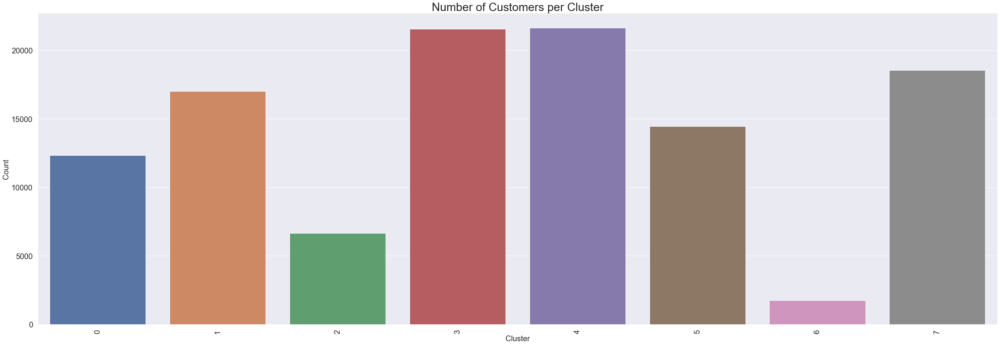

In [49]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df3_prepared['Cluster_3'].value_counts().index,
            y=df3_prepared['Cluster_3'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- Cluster 0 :
    - payment_installments +
    - payment_type_credit_card +
- Cluster 1 :
    - purchase_year -
    - purchase_day -
    - review_comment_title_without_comment_title +
    - purchase_month_month3 +
- Cluster 2 :
    - nb_orders_customers +
- Cluster 3 :
    - purchase_year +
    - purchase_day +
    - purchase_month_month3 -
- Cluster 4 :
    - purchase_year +
    - purchase_day -
    - purchase_month_month3 -
- Cluster 5 :
    - review_score -
    - review_comment_message_with_comment_message +
- Cluster 6 :
    - total_price +
    - payment_installments +
- Cluster 7 :
    - purchase_year -
    - purchase_day +
    - review_comment_title_without_comment_title +
    - purchase_month_month3 +

# 5. Gaussian Mixture<a class="anchor" id="chapter5"></a>

- In this second section, we will create clusters with the same group of features of the last section but with Gaussian Mixture algorithm.

## 5.1. First Clustering<a class="anchor" id="section_5_1"></a>

In [50]:
df1 = df[['total_price',
          'payment_type',
          'payment_installments',
          'review_score',
          'review_comment_title',
          'review_comment_message',
          'customer_state',
          'product_category_name',
          'product_name_lenght',
          'product_description_lenght',
          'product_photos_qty',
          'product_weight_g',
          'purchase_year',
          'purchase_month',
          'purchase_day',
          'purchase_weekday',
          'purchase_hour',
          'nb_orders_customers']]

In [51]:
df1_prepared = data_transform(df1)

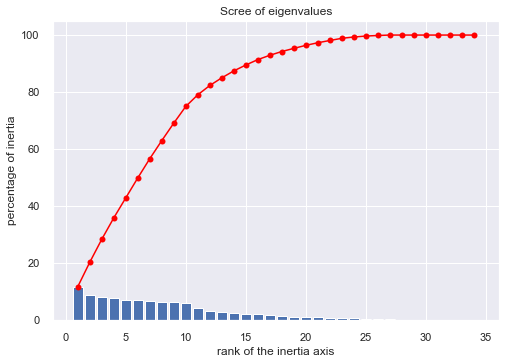

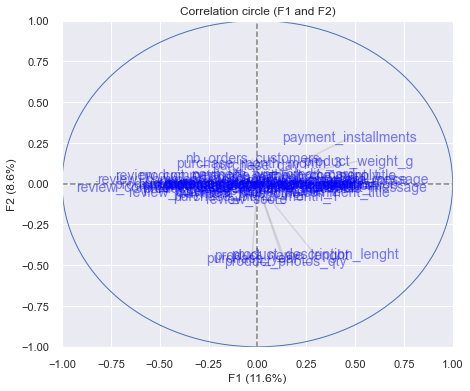

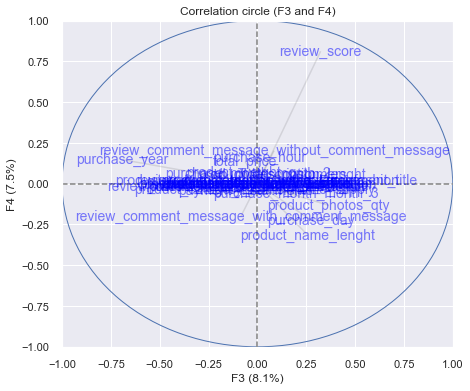

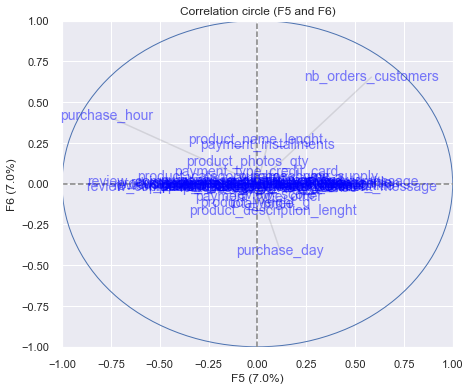

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


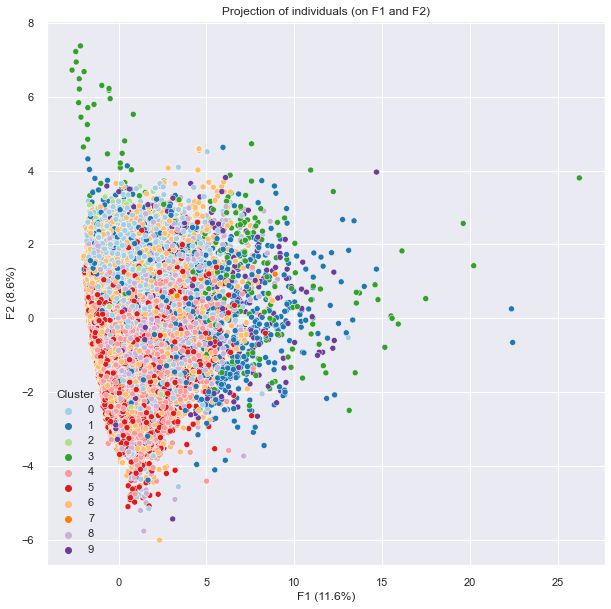

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


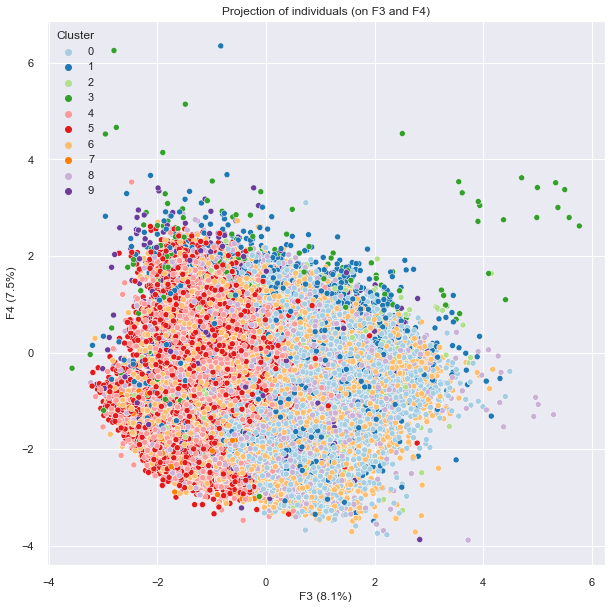

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


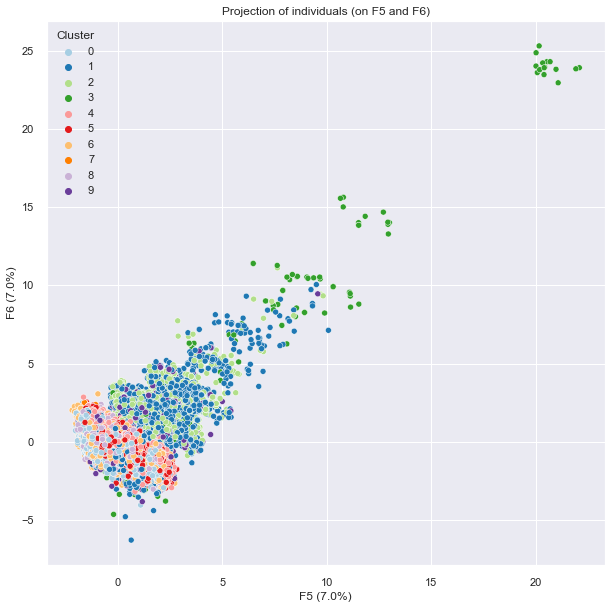

In [52]:
clustering_pca_GM(df1_prepared.copy(), df1_prepared.columns.tolist(), 10)

In [53]:
model1 = GaussianMixture(n_components=10, random_state=42)

In [54]:
cluster_labels = model1.fit_predict(df1_prepared.copy())

silhouette_avg = silhouette_score(df1_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.0051020689494685875


In [55]:
df1_prepared['Cluster_1'] = model1.fit_predict(df1_prepared)

In [56]:
cluster_gp_1 = df1_prepared.groupby('Cluster_1').mean()

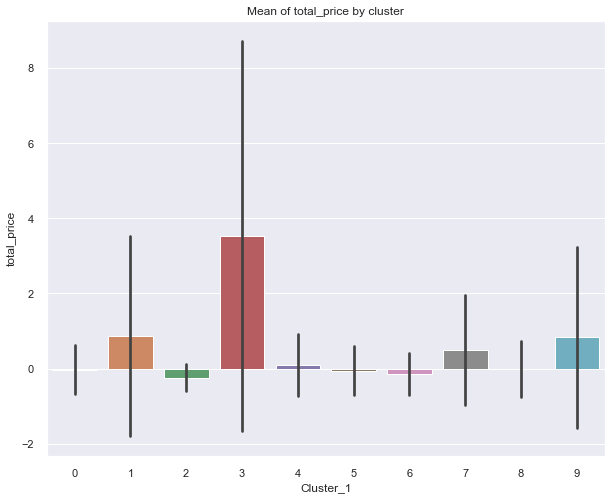

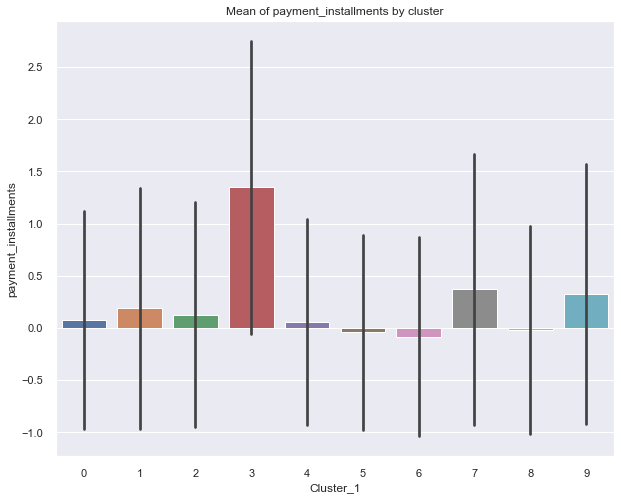

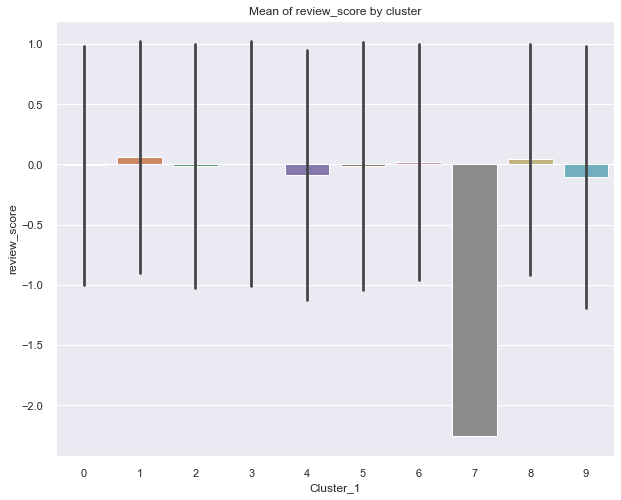

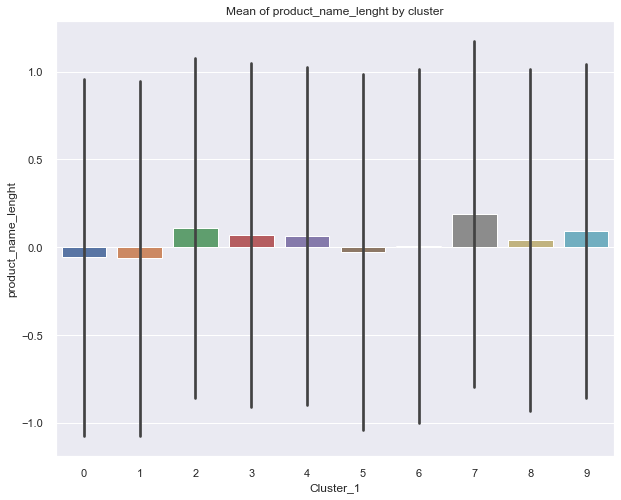

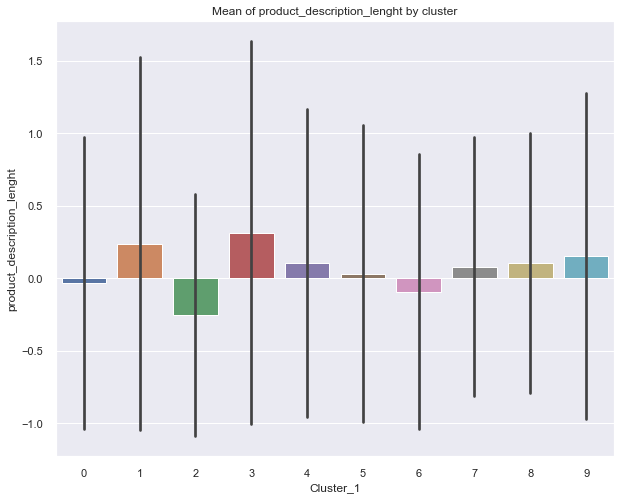

...

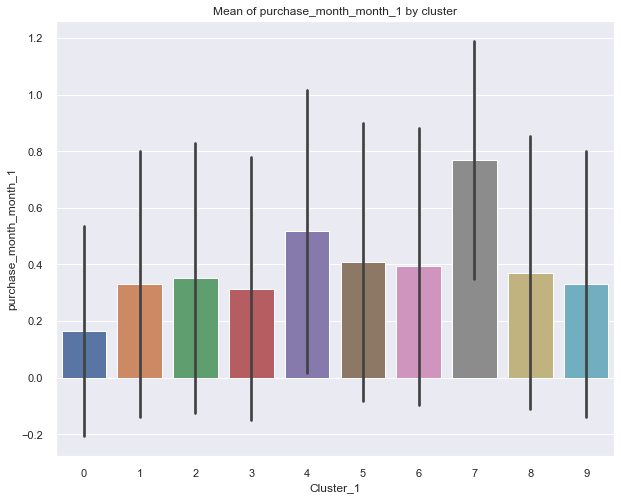

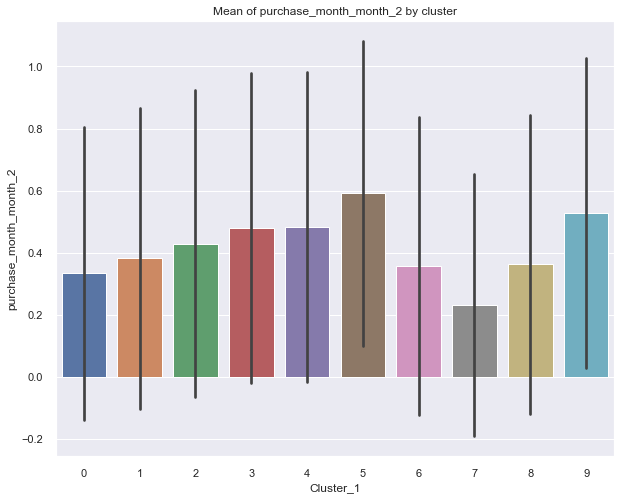

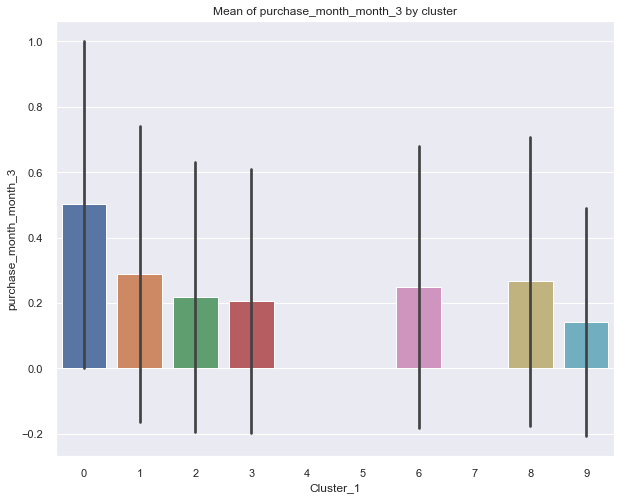

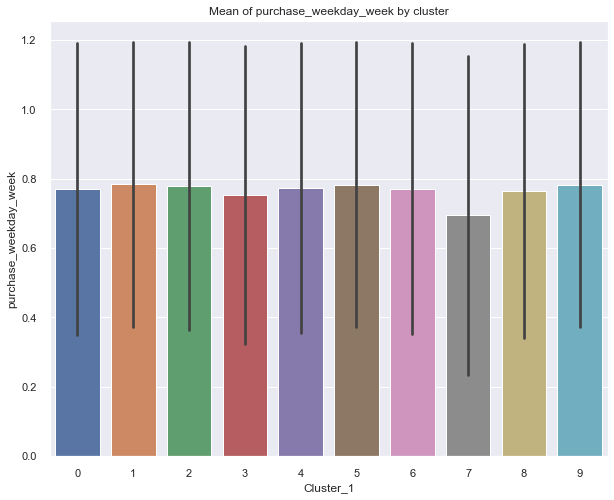

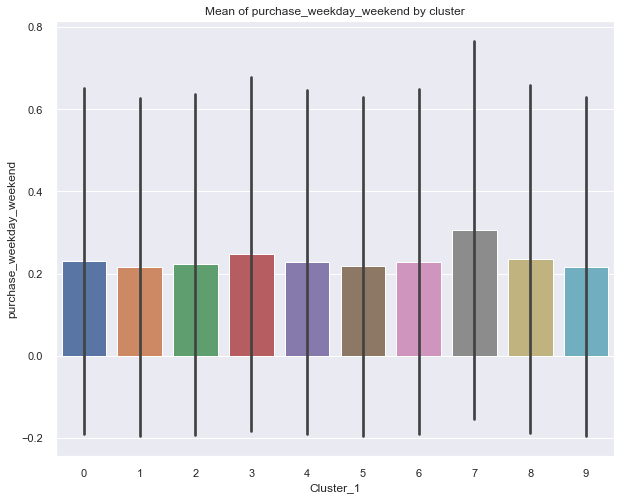

In [57]:
for i in cluster_gp_1.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_1',
                y=i,
                data=df1_prepared,
                ci="sd")
    plt.show()

In [58]:
cluster_gp_1.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,payment_installments,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,purchase_year,purchase_day,purchase_hour,nb_orders_customers,payment_type_credit_card,payment_type_other,review_comment_title_with_comment_title,review_comment_title_without_comment_title,review_comment_message_with_comment_message,review_comment_message_without_comment_message,customer_state_Central_West_Region,customer_state_North_Region,customer_state_Northeast_Region,customer_state_South_Region,customer_state_Southeast_Region,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other,purchase_month_month_1,purchase_month_month_2,purchase_month_month_3,purchase_weekday_week,purchase_weekday_weekend
Cluster_1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.032948,0.075594,-0.008423,-0.057555,-0.030780,0.040351,-0.036213,-1.097736,0.066966,0.021179,-0.213414,0.727745,0.272255,0.000000,1.000000,0.429876,0.570124,0.116103,0.000000,0.204598,0.296189,0.383109,0.000000,0.148961,0.465830,0.172160,0.109910,0.103139,0.000000,0.164077,0.333456,0.502467,0.769158,0.230842
1,0.867235,0.188719,0.059515,-0.061477,0.239412,0.046737,-0.027960,-0.269531,0.023038,-0.074873,1.959747,0.735155,0.264845,0.103618,0.896382,0.442784,0.557216,0.000000,0.194259,0.107550,0.000000,0.698191,0.000000,0.267991,0.330122,0.000000,0.194849,0.000000,0.207039,0.330122,0.381832,0.288046,0.784310,0.215690
2,-0.243578,0.128546,-0.009424,0.109991,-0.254327,-0.183861,-0.225375,-0.155455,-0.013307,-0.010806,2.802624,0.709402,0.290598,0.094017,0.905983,0.406640,0.593360,0.116371,0.000000,0.000000,0.322814,0.560815,0.000000,0.084484,0.070348,0.724852,0.063774,0.000000,0.056542,0.352400,0.428665,0.218935,0.777778,0.222222
3,3.530541,1.348958,0.007953,0.070142,0.315666,0.211369,2.054456,0.048106,-0.128521,0.105954,4.117514,1.000000,0.000000,0.263279,0.736721,0.473441,0.526559,0.210162,0.000000,0.073903,0.480370,0.235566,0.235566,0.087760,0.193995,0.256351,0.069284,0.078522,0.078522,0.314088,0.480370,0.205543,0.752887,0.247113
4,0.097282,0.055766,-0.087026,0.064461,0.106582,0.072736,-0.095926,0.910966,-0.082855,-0.019024,-0.213414,0.750470,0.249530,0.276337,0.723663,0.474258,0.525742,0.361518,0.084304,0.554178,0.000000,0.000000,0.000000,0.263560,0.295378,0.221345,0.136039,0.056495,0.027183,0.517099,0.482901,0.000000,0.772642,0.227358
5,-0.056678,-0.042843,-0.011359,-0.025969,0.031020,-0.030687,-0.079310,0.910966,-0.053079,0.001253,-0.213414,0.745771,0.254229,0.422681,0.577319,0.520981,0.479019,0.000000,0.000000,0.000000,0.299892,0.700108,0.000000,0.136906,0.420314,0.201894,0.085647,0.101958,0.053282,0.408565,0.591435,0.000000,0.782785,0.217215
6,-0.142619,-0.083648,0.017773,0.007651,-0.091449,-0.040169,-0.020955,-0.108367,0.017711,-0.004547,-0.213414,0.736255,0.263745,0.000000,1.000000,0.361278,0.638722,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.307755,0.000000,0.469039,0.223206,0.000000,0.000000,0.393206,0.357754,0.249040,0.771628,0.228372
7,0.497720,0.368964,-2.255661,0.190693,0.080217,0.334504,0.204939,0.910966,-0.218504,0.057879,-0.213414,0.731343,0.268657,0.425373,0.574627,0.798507,0.201493,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.283582,0.276119,0.164179,0.134328,0.000000,0.141791,0.768657,0.231343,0.000000,0.694030,0.305970
8,-0.008993,-0.017906,0.041826,0.042561,0.103821,0.060186,0.134635,-0.136878,-0.004826,0.019115,-0.213414,0.738175,0.261825,0.000000,1.000000,0.361838,0.638162,0.059157,0.000000,0.090927,0.159428,0.690488,0.134682,0.000000,0.000000,0.000000,0.000000,0.000000,0.865318,0.370860,0.362804,0.266336,0.764596,0.235404


Text(0, 0.5, 'Count')

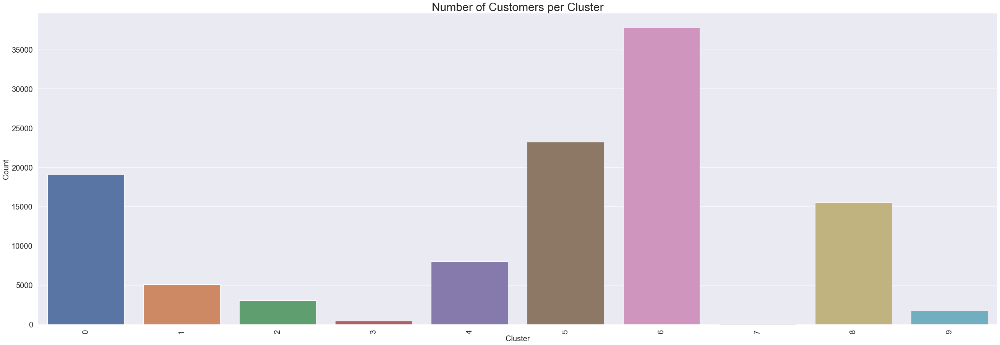

In [59]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df1_prepared['Cluster_1'].value_counts().index,
            y=df1_prepared['Cluster_1'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- It is difficult to interpret these clusters because of the large number of features.

## 5.2. Second Clustering<a class="anchor" id="section_5_2"></a>

In [60]:
df2 = df[['total_price',
          'product_category_name',
          'product_name_lenght',
          'product_description_lenght',
          'product_photos_qty',
          'product_weight_g']]

In [61]:
df2_prepared = data_transform(df2)

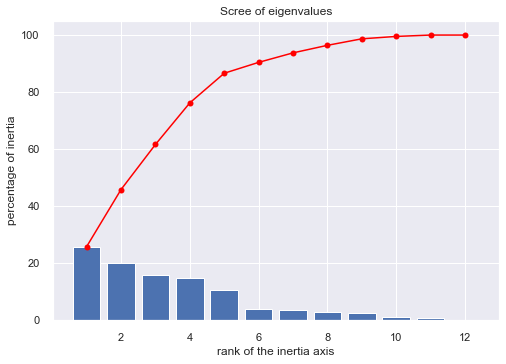

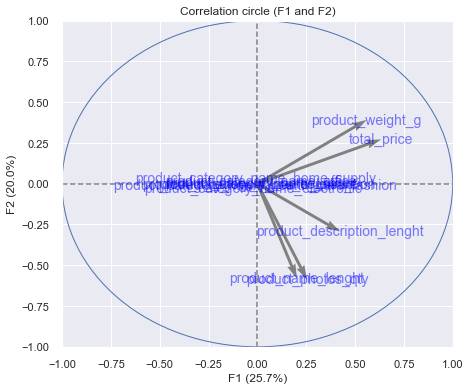

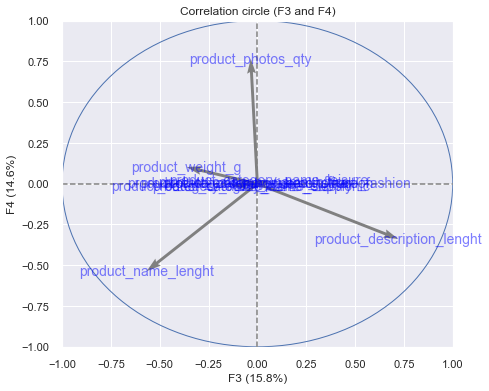

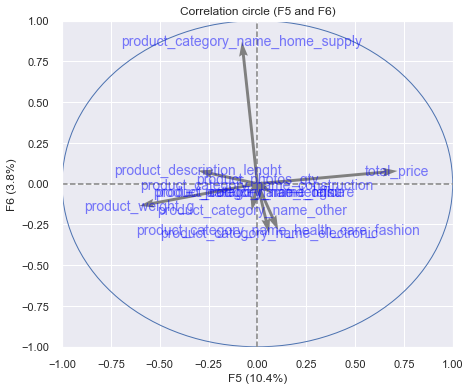

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


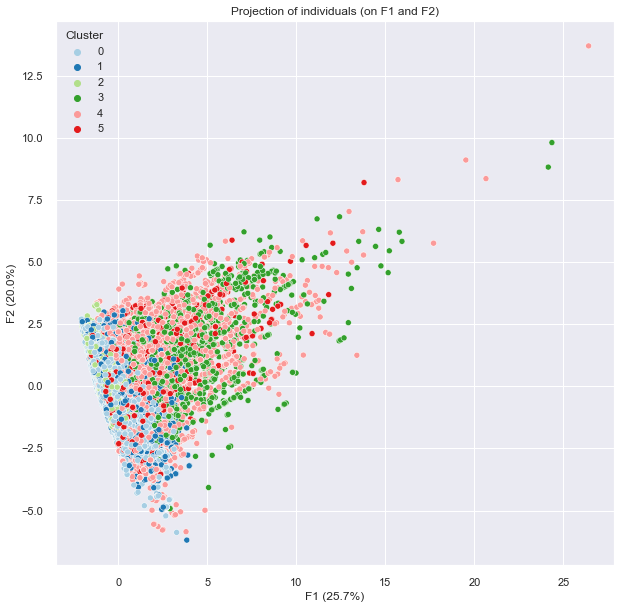

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


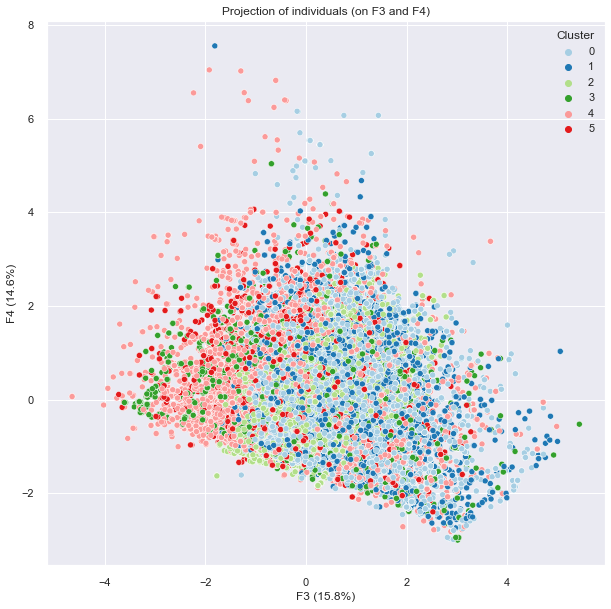

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


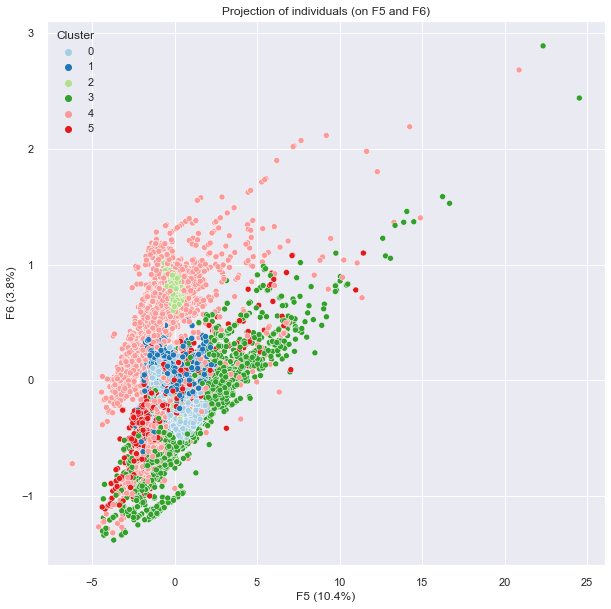

In [62]:
clustering_pca_GM(df2_prepared.copy(), df2_prepared.columns.tolist(), 6)

In [63]:
model2 = GaussianMixture(n_components=6, random_state=42)

In [64]:
cluster_labels = model2.fit_predict(df2_prepared.copy())

silhouette_avg = silhouette_score(df2_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.0444364851715777


In [65]:
df2_prepared['Cluster_2'] = model2.fit_predict(df2_prepared)

In [66]:
cluster_gp_2 = df2_prepared.groupby('Cluster_2').mean()

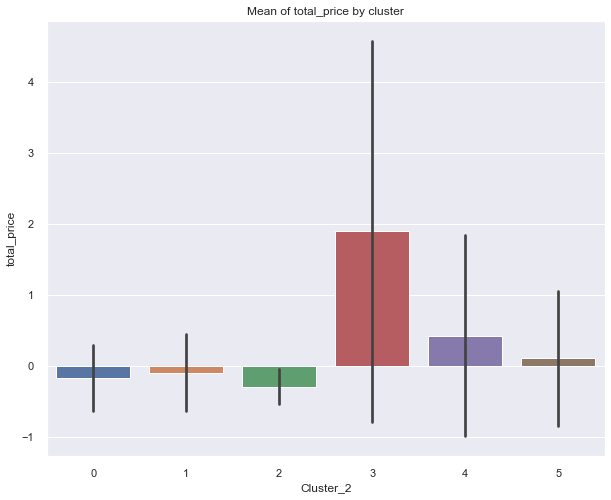

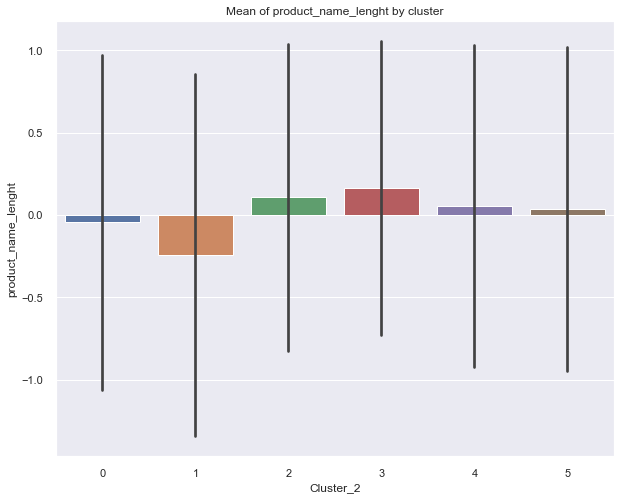

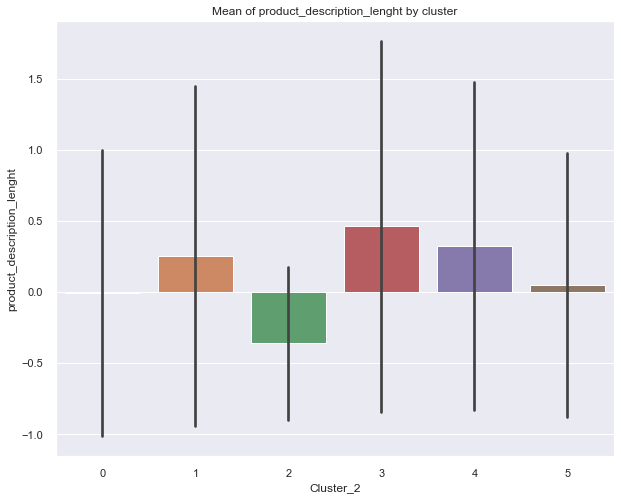

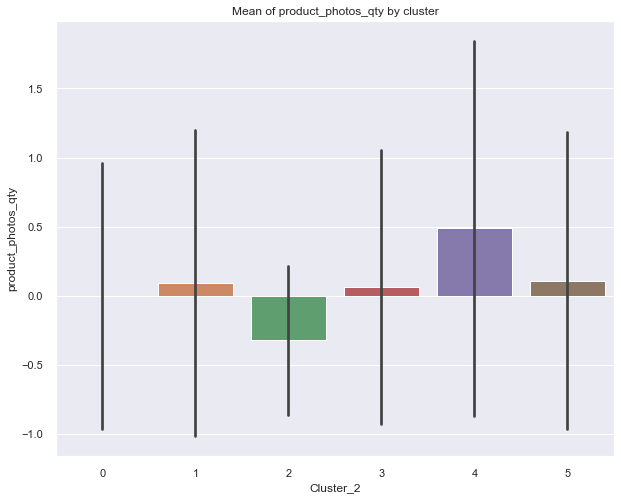

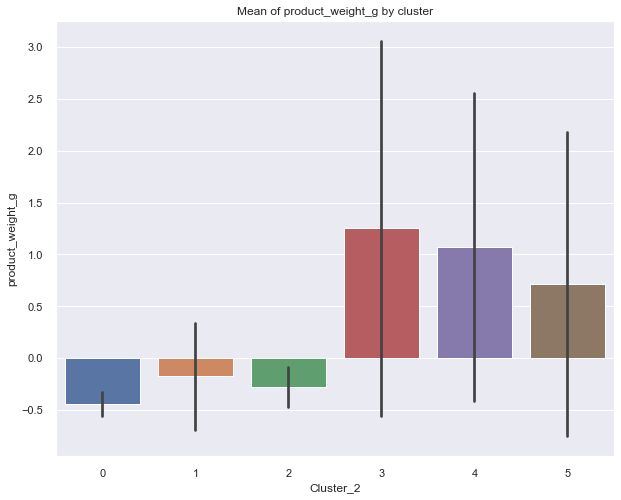

...

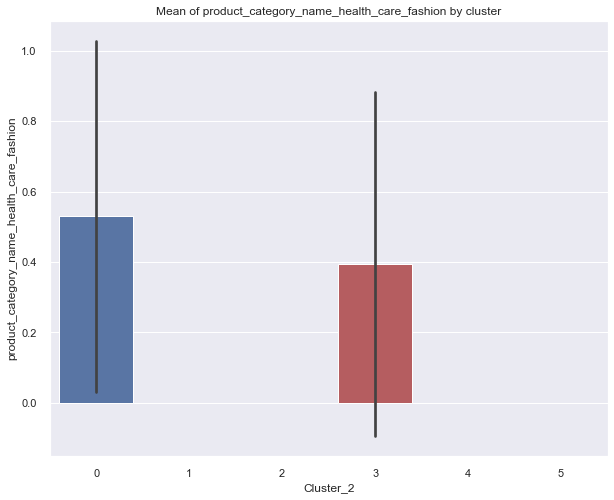

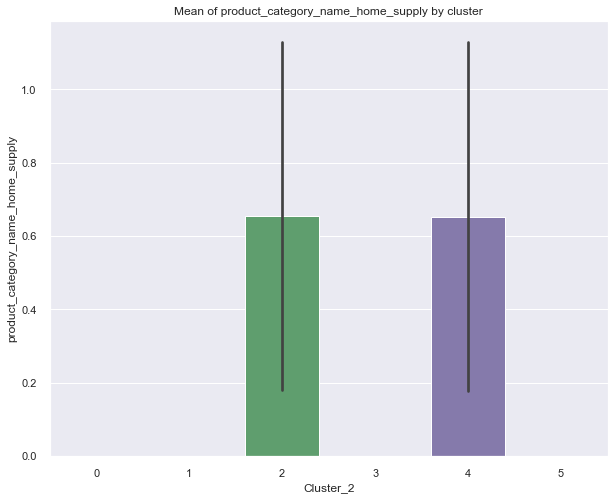

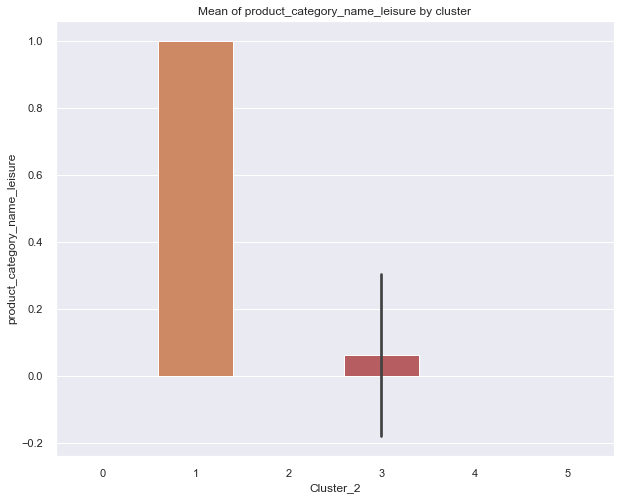

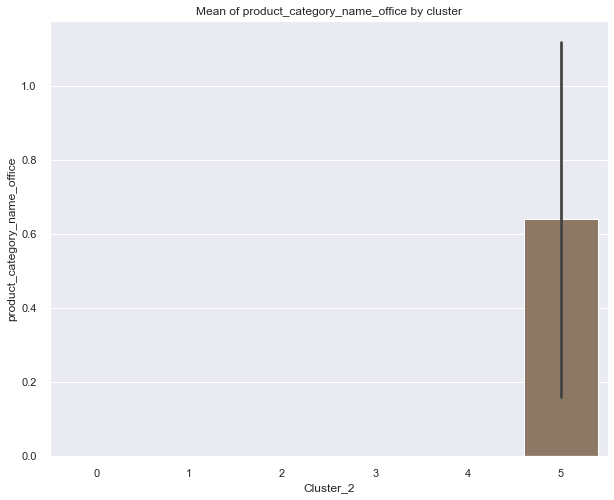

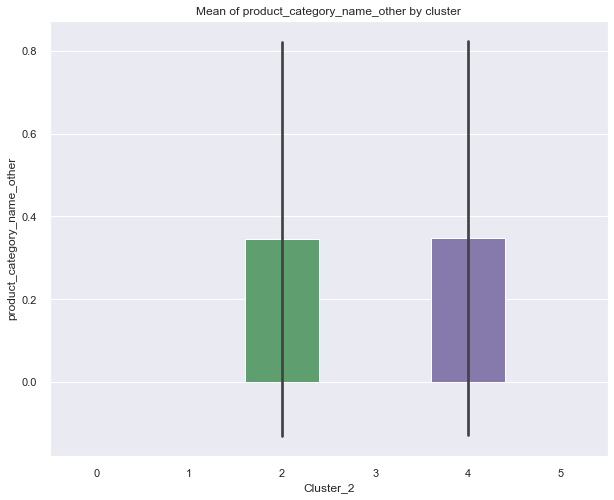

In [67]:
for i in cluster_gp_2.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_2',
                y=i,
                data=df2_prepared,
                ci="sd")
    plt.show()

In [68]:
cluster_gp_2.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other
Cluster_2,,,,,,,,,,,,
0,-0.166455,-0.043449,-0.007246,-0.004911,-0.439275,0.000000,0.470676,0.529324,0.000000,0.000000,0.000000,0.000000
1,-0.094010,-0.242663,0.253845,0.092966,-0.175413,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
2,-0.291823,0.106392,-0.361475,-0.322093,-0.281004,0.000000,0.000000,0.000000,0.654715,0.000000,0.000000,0.345285
3,1.895165,0.163529,0.463285,0.062923,1.252953,0.000000,0.543986,0.393976,0.000000,0.062039,0.000000,0.000000
4,0.425802,0.053523,0.325020,0.489038,1.068809,0.000000,0.000000,0.000000,0.651919,0.000000,0.000000,0.348081
5,0.107873,0.036506,0.050226,0.107712,0.713601,0.360381,0.000000,0.000000,0.000000,0.000000,0.639619,0.000000


Text(0, 0.5, 'Count')

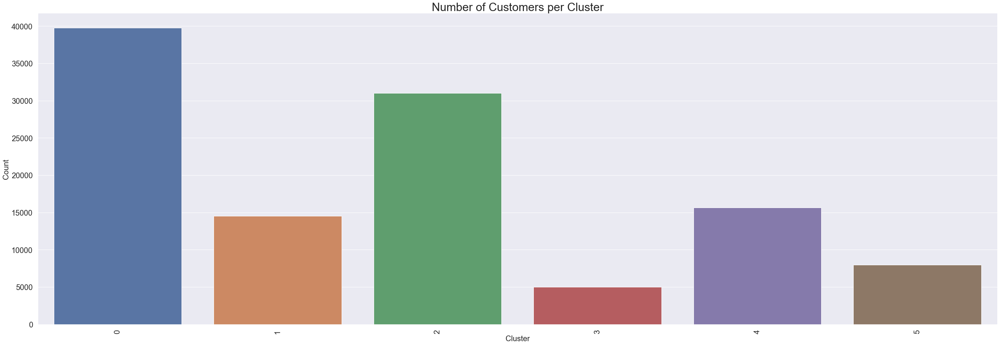

In [69]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df2_prepared['Cluster_2'].value_counts().index,
            y=df2_prepared['Cluster_2'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- Cluster 0 :
    - product_category_name_electronic +
    - product_category_name_health_care_fashion +
- Cluster 1 :
    - product_category_name_leisure +
- Cluster 2 :
    - product_description_lenght -
    - product_photos_qty -
    - product_category_name_home_supply +
    - product_category_name_other +
- Cluster 3 :
    - total_price +
    - product_weight_g +
    - product_category_name_electronic +
    - product_category_name_health_care_fashion +
- Cluster 4 :
    - product_weight_g +
    - product_category_name_home_supply +
    - product_category_name_other +
- Cluster 5 :
    - product_weight_g +
    - product_category_name_construction +
    - product_category_name_office +

## 5.3. Third Clustering<a class="anchor" id="section_5_3"></a>

In [70]:
df3 = df[['total_price',
          'payment_type',
          'payment_installments',
          'review_score',
          'review_comment_title',
          'review_comment_message',
          'purchase_year',
          'purchase_month',
          'purchase_day',
          'purchase_weekday',
          'purchase_hour',
          'nb_orders_customers']]

In [71]:
df3_prepared = data_transform(df3)

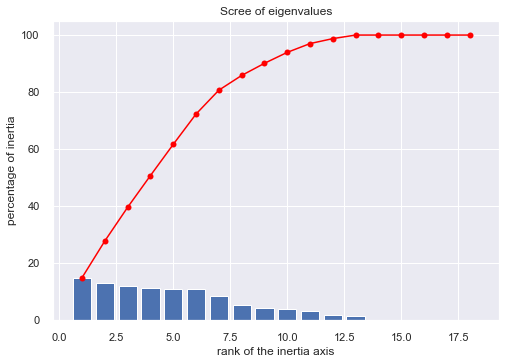

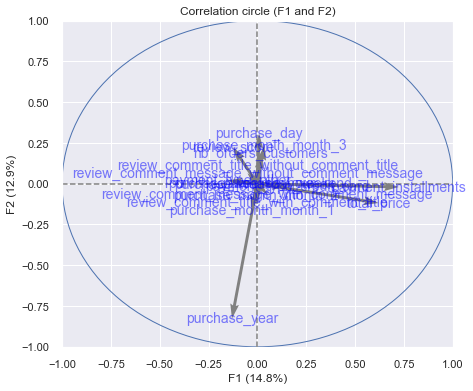

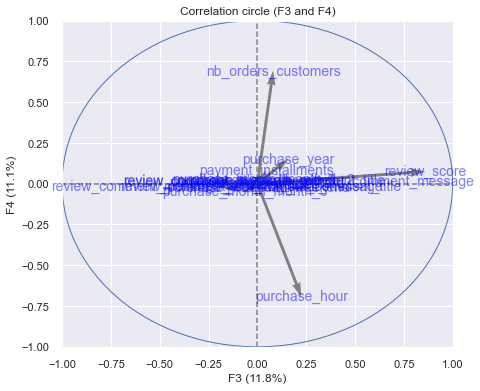

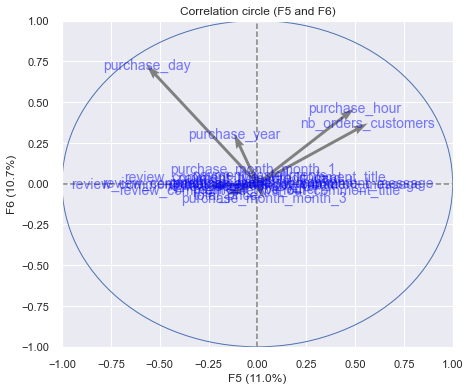

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


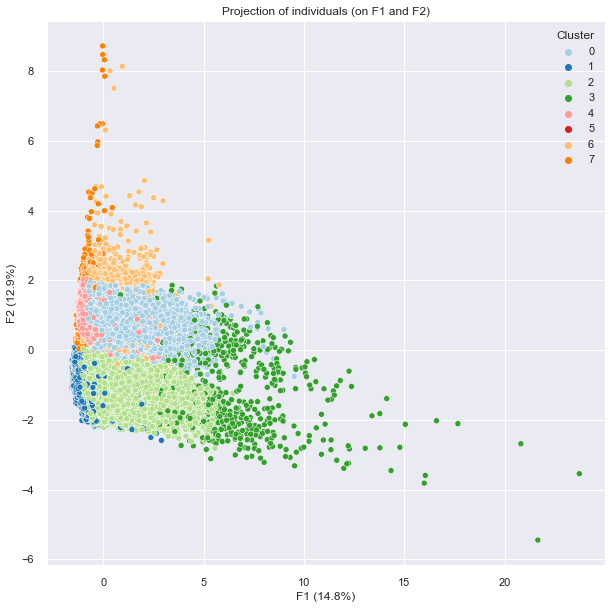

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


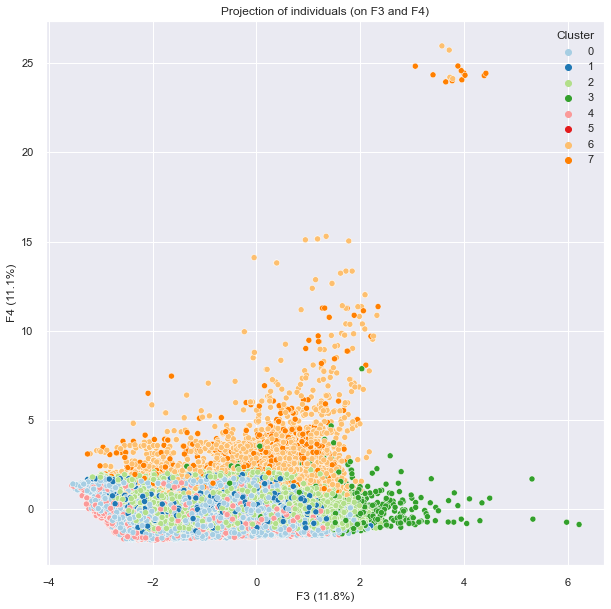

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


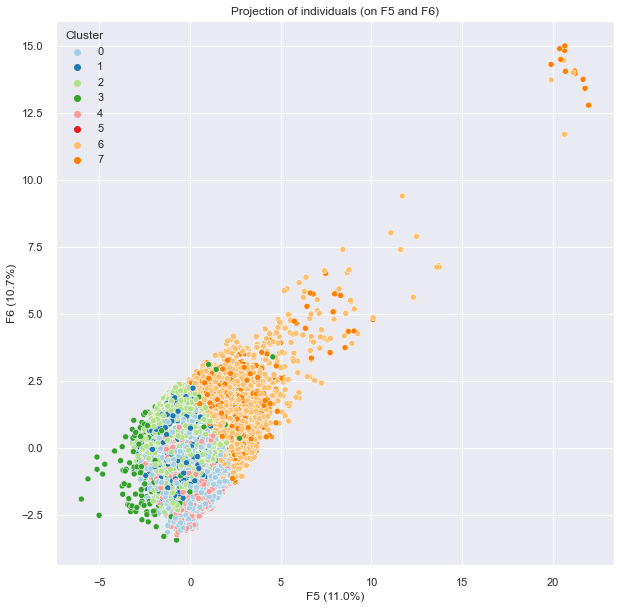

In [72]:
clustering_pca_GM(df3_prepared.copy(), df3_prepared.columns.tolist(), 8)

In [73]:
model3 = GaussianMixture(n_components=8, random_state=42)

In [74]:
cluster_labels = model3.fit_predict(df3_prepared.copy())

silhouette_avg = silhouette_score(df3_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.08149806119719992


In [75]:
df3_prepared['Cluster_3'] = model3.fit_predict(df3_prepared)

In [76]:
cluster_gp_3 = df3_prepared.groupby('Cluster_3').mean()

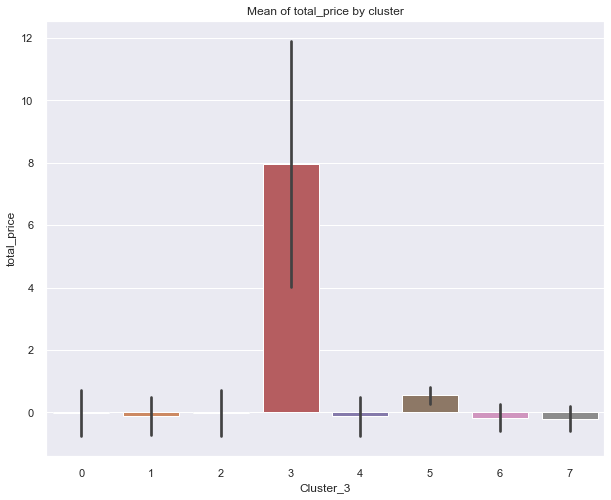

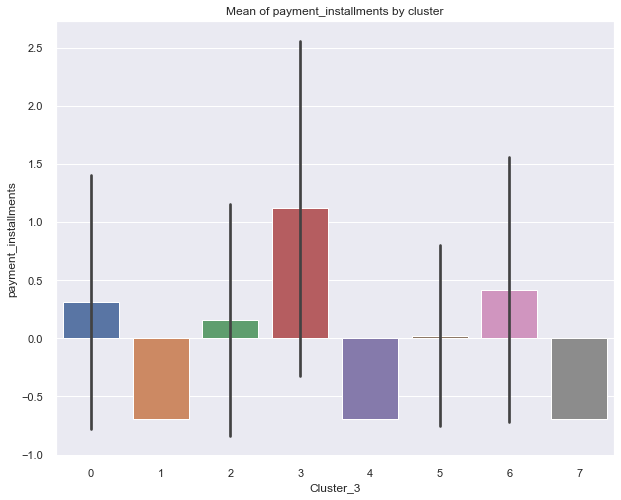

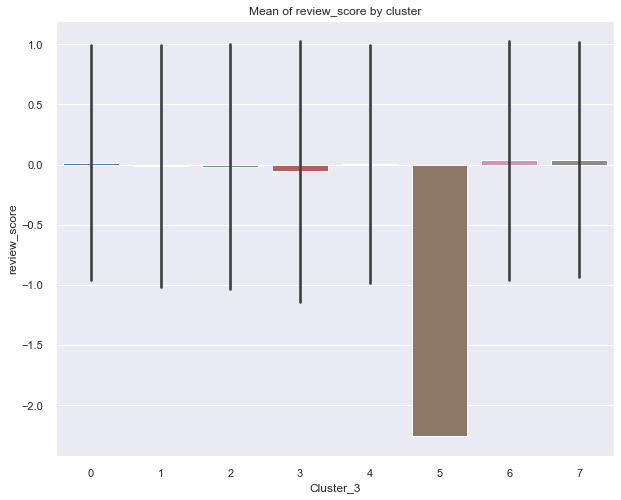

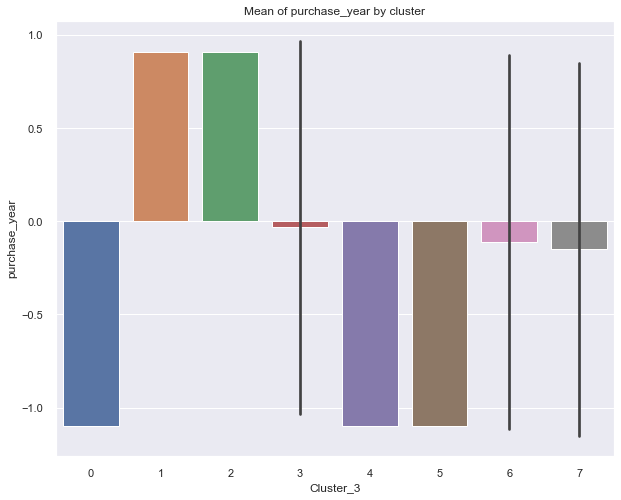

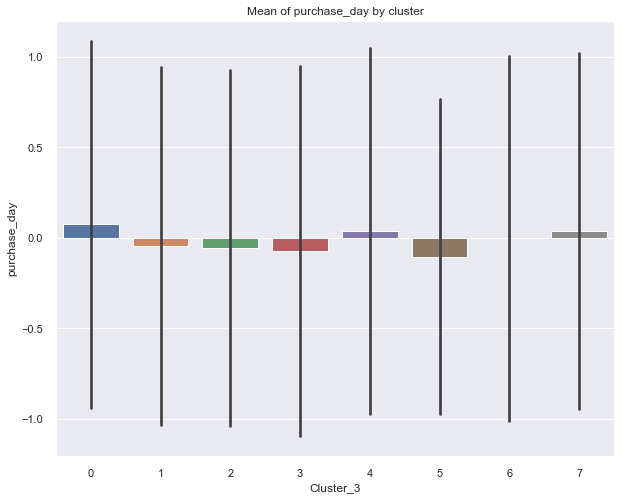

...

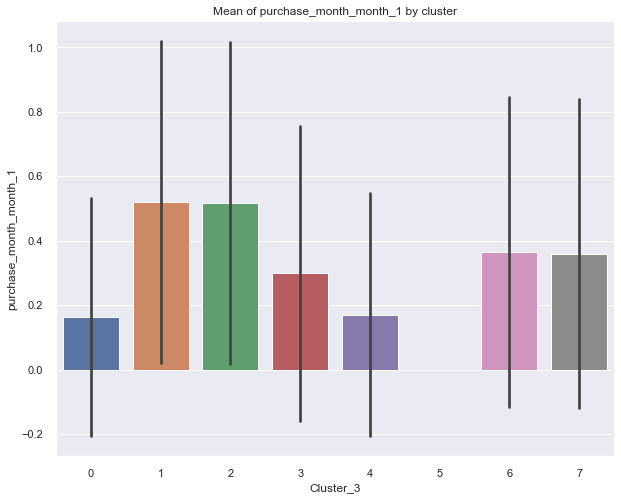

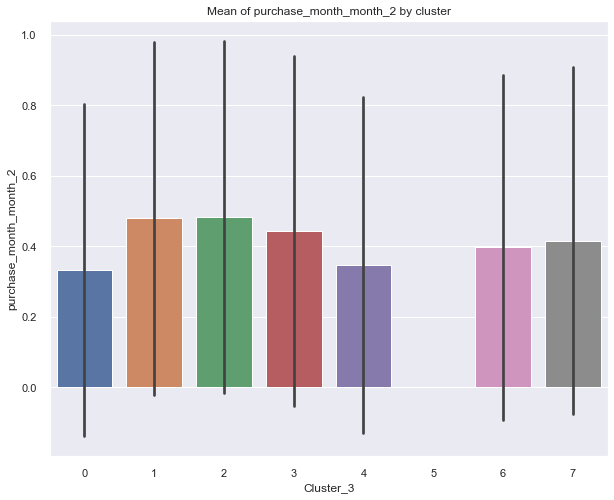

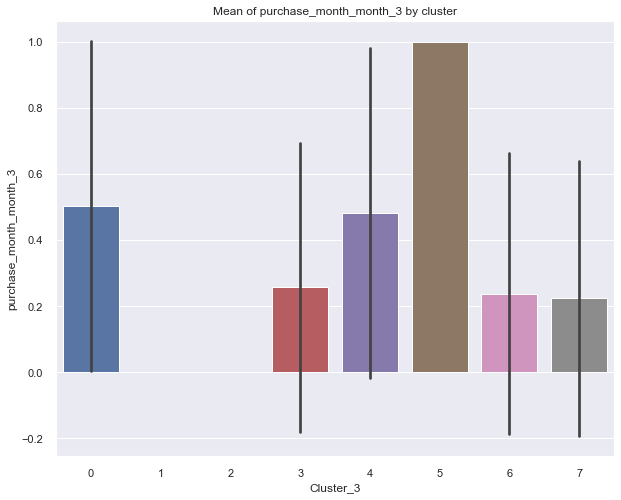

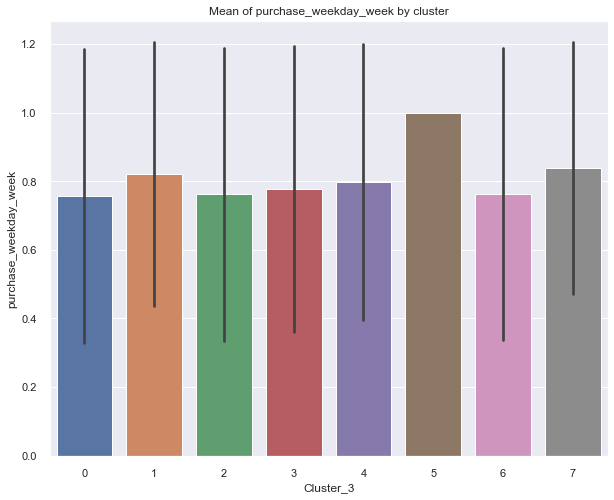

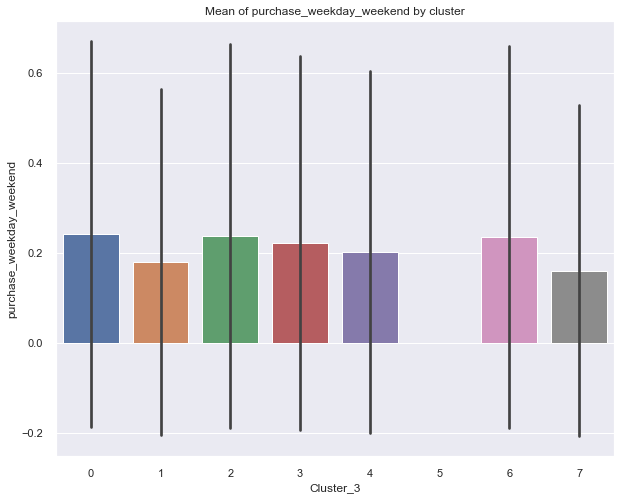

In [77]:
for i in cluster_gp_3.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_3',
                y=i,
                data=df3_prepared,
                ci="sd")
    plt.show()

In [78]:
cluster_gp_3.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,payment_installments,review_score,purchase_year,purchase_day,purchase_hour,nb_orders_customers,payment_type_credit_card,payment_type_other,review_comment_title_with_comment_title,review_comment_title_without_comment_title,review_comment_message_with_comment_message,review_comment_message_without_comment_message,purchase_month_month_1,purchase_month_month_2,purchase_month_month_3,purchase_weekday_week,purchase_weekday_weekend
Cluster_3,,,,,,,,,,,,,,,,,,
0,-0.016309,0.310998,0.017250,-1.097736,0.074193,0.032914,-0.213414,1.000000,0.000000,0.000000,1.000000,0.427815,0.572185,0.163043,0.333382,0.503575,0.756941,0.243059
1,-0.117121,-0.697929,-0.010553,0.910966,-0.046078,-0.081554,-0.213414,0.000000,1.000000,0.217593,0.782407,0.415441,0.584559,0.520697,0.479303,0.000000,0.819921,0.180079
2,-0.016061,0.158504,-0.015845,0.910966,-0.054278,0.026055,-0.213414,1.000000,0.000000,0.219357,0.780643,0.419026,0.580974,0.516085,0.483915,0.000000,0.761484,0.238516
3,7.964058,1.119282,-0.055041,-0.032719,-0.072702,-0.005360,0.254161,0.783893,0.216107,0.190604,0.809396,0.511409,0.488591,0.297987,0.444295,0.257718,0.777181,0.222819
4,-0.127577,-0.697929,0.002409,-1.097736,0.036737,-0.049410,-0.213414,0.000000,1.000000,0.000000,1.000000,0.427579,0.572421,0.170615,0.347635,0.481750,0.797438,0.202562
5,0.549838,0.024110,-2.255661,-1.097736,-0.105429,-1.643791,-0.213414,0.666667,0.333333,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
6,-0.165890,0.420320,0.034458,-0.111953,-0.003825,-0.051419,2.993605,1.000000,0.000000,0.101214,0.898786,0.418861,0.581139,0.364519,0.397572,0.237908,0.763585,0.236415
7,-0.198569,-0.697929,0.039618,-0.150345,0.037997,-0.072716,3.079851,0.005332,0.994668,0.105671,0.894329,0.398934,0.601066,0.359670,0.416384,0.223946,0.839069,0.160931


Text(0, 0.5, 'Count')

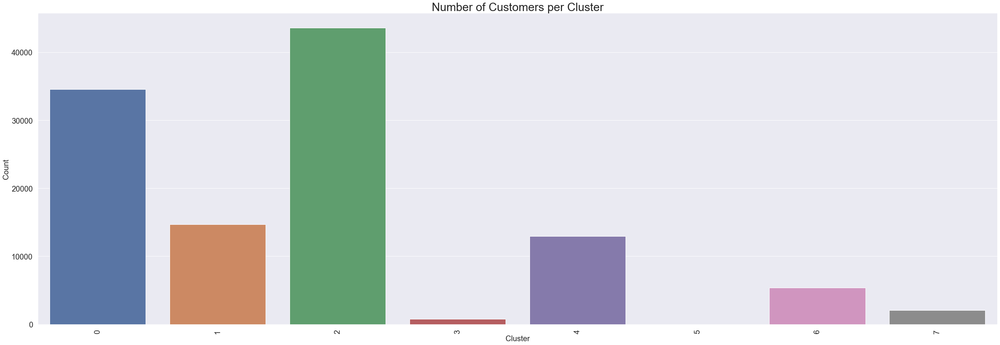

In [79]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df3_prepared['Cluster_3'].value_counts().index,
            y=df3_prepared['Cluster_3'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

- Cluster 0 :
    - purchase_year -
    - payment_type_credit_card +
- Cluster 1 :
    - payment_installments -
    - purchase_year +
    - payment_type_other +
    - purchase_month_month1 +
    - purchase_month_month2 +
    - purchase_month_month3 -
- Cluster 2 :
    - purchase_year +
    - payment_type_credit_card +
    - purchase_month_month1 +
    - purchase_month_month2 +
    - purchase_month_month3 -
- Cluster 3 :
    - total_price +
    - payment_installments +
- Cluster 4 :
    - payment_installments -
    - purchase_year -
    - payment_type_other +
- Cluster 5 :
    - review_score -
    - purchase_year -
    - purchase_hour -
    - review_comment_title_with_comment_title +
    - review_comment_message_with_comment_message +
    - purchase_month_month1 -
    - purchase_month_month2 -
    - purchase_month_month3 +
    - purchase_weekday_week +
- Cluster 6 :
    - nb_orders_customers +
    - payment_type_credit_card +
- Cluster 7 :
    - payment_installments -
    - nb_orders_customers +
    - payment_type_other +

# 6. Clusters Evolution<a class="anchor" id="chapter6"></a>

- In this part, we will see how clusters evolve for the last 3, 6 and 12 months.

## 6.1. 3 Months<a class="anchor" id="section_6_1"></a>

In [80]:
df2_2 = df[df['order_purchase_timestamp'] > '2018-06-01 00:00:00']

In [81]:
df2_2 = df2_2[['total_price',
               'product_category_name',
               'product_name_lenght',
               'product_description_lenght',
               'product_photos_qty',
               'product_weight_g']]

In [82]:
df2_2.reset_index(inplace=True, drop=True)

In [83]:
df2_2_prepared = data_transform(df2_2)

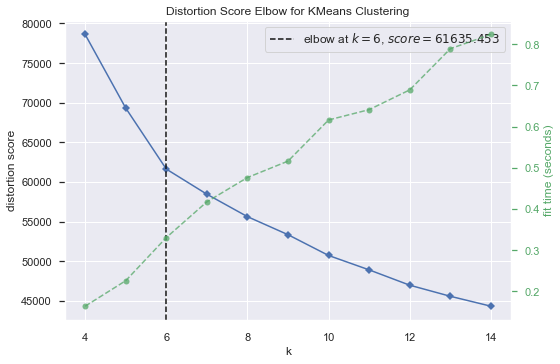

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [84]:
model2 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model2, k=(4, 15), random_state=42)

visualizer.fit(df2_2_prepared.copy())
visualizer.poof()

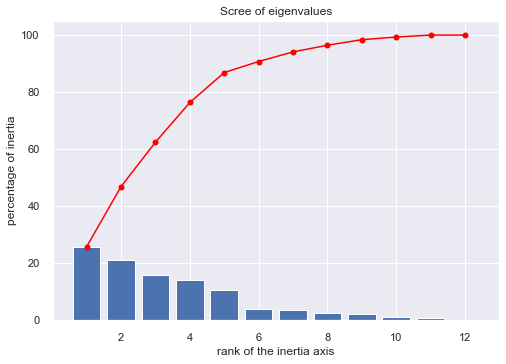

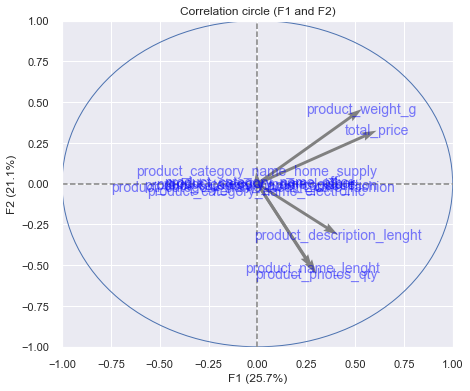

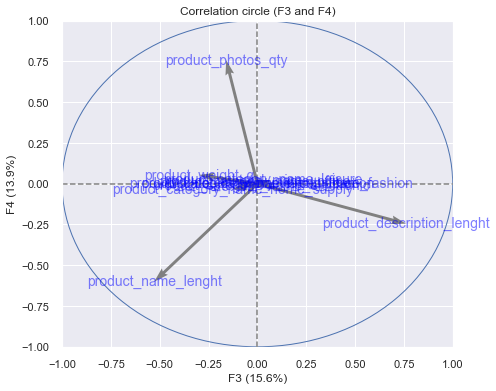

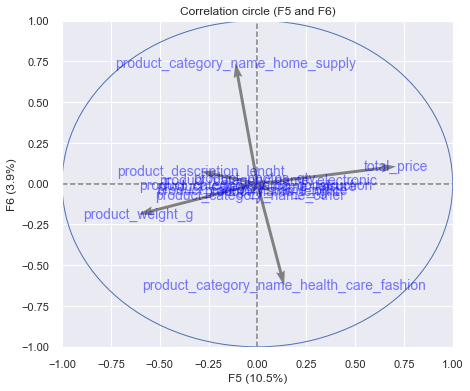

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


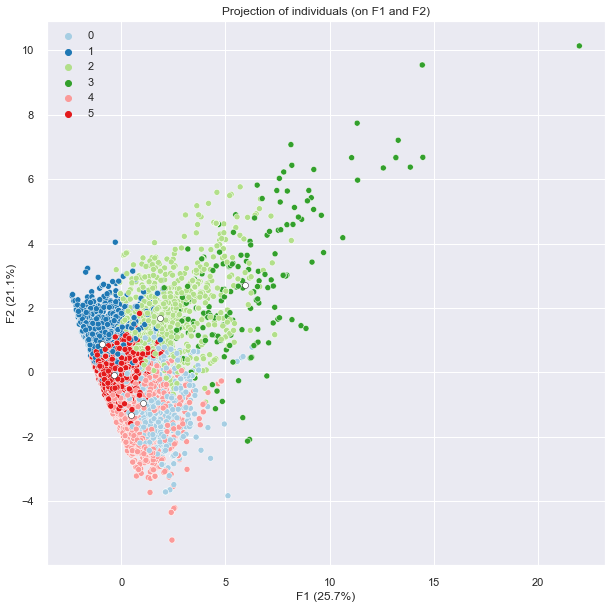

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


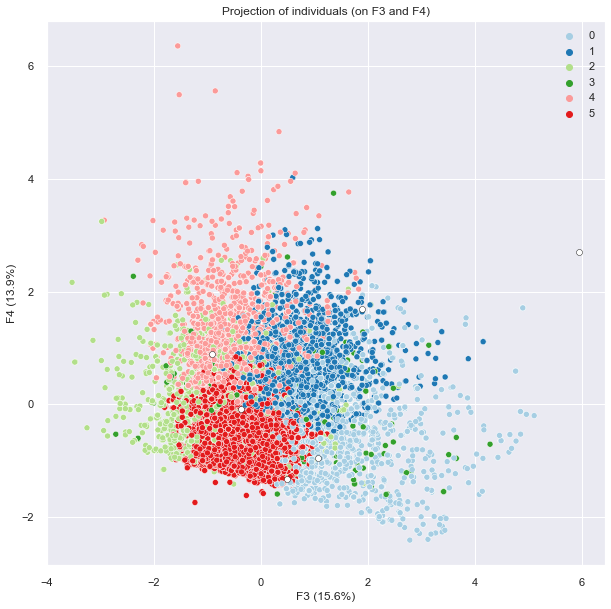

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


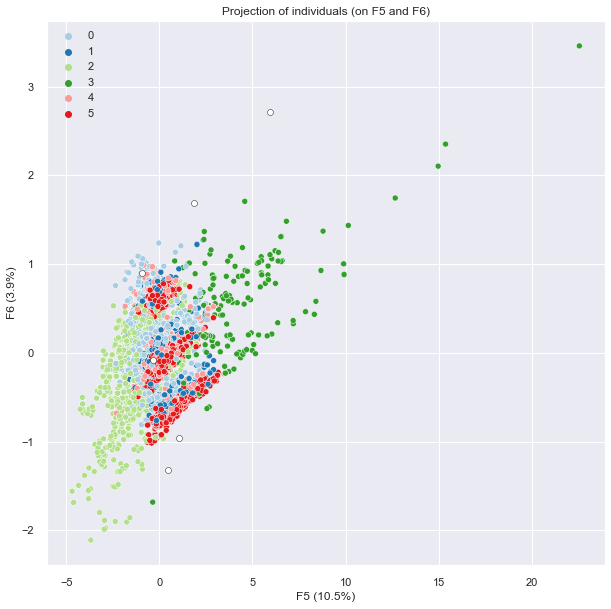

1:80: E501 line too long (80 > 79 characters)


In [85]:
clustering_pca_kmeans(df2_2_prepared.copy(), df2_2_prepared.columns.tolist(), 6)

In [86]:
model2 = KMeans(6, random_state=42)

In [87]:
cluster_labels = model2.fit_predict(df2_2_prepared.copy())

silhouette_avg = silhouette_score(df2_2_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.22977564913735574


In [88]:
model2.fit(df2_2_prepared)
df2_2_prepared['Cluster_2'] = model2.predict(df2_2_prepared)

In [89]:
cluster_gp_2 = df2_2_prepared.groupby('Cluster_2').mean()

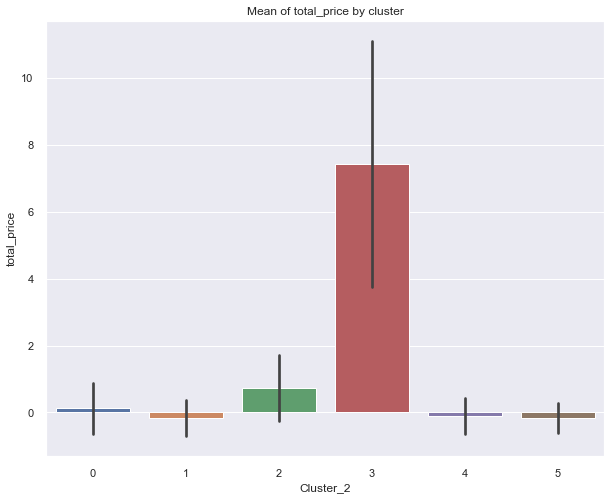

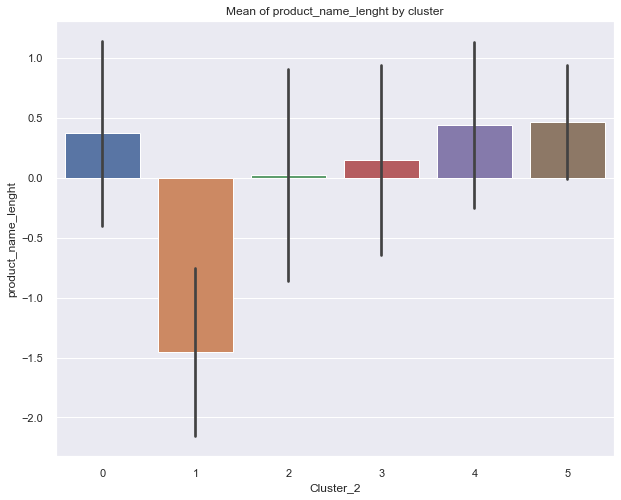

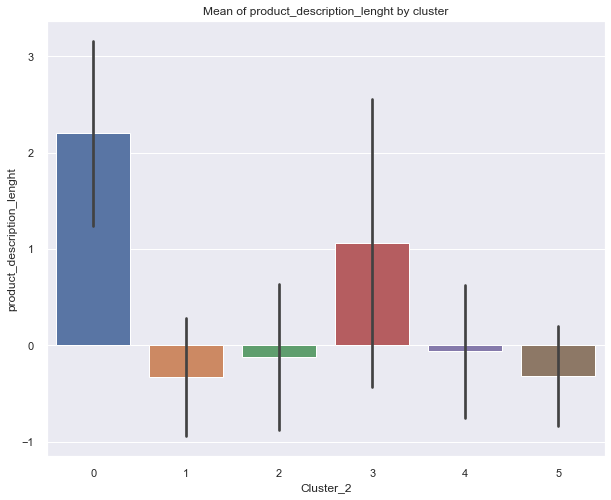

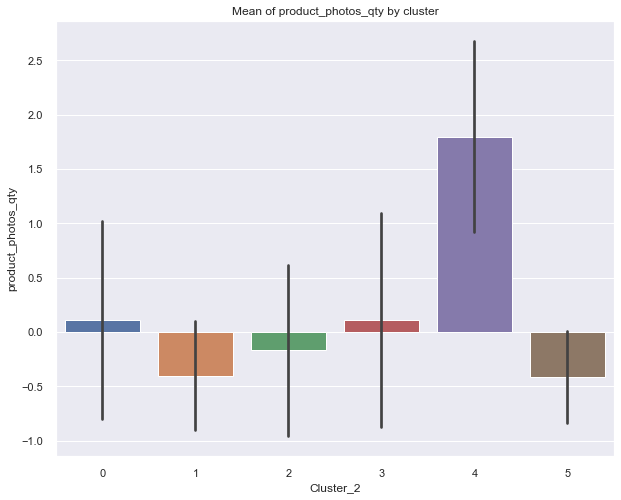

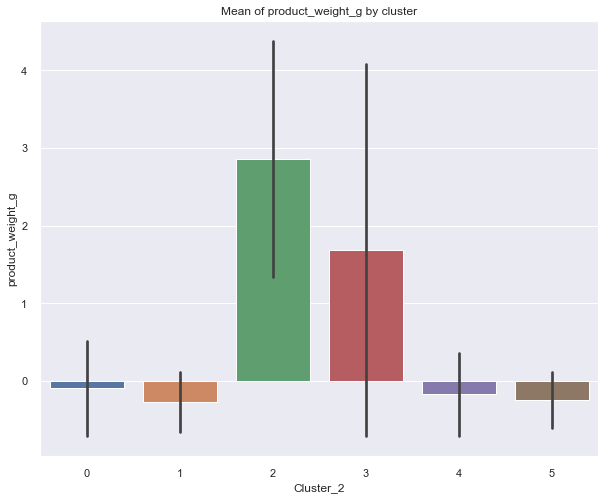

...

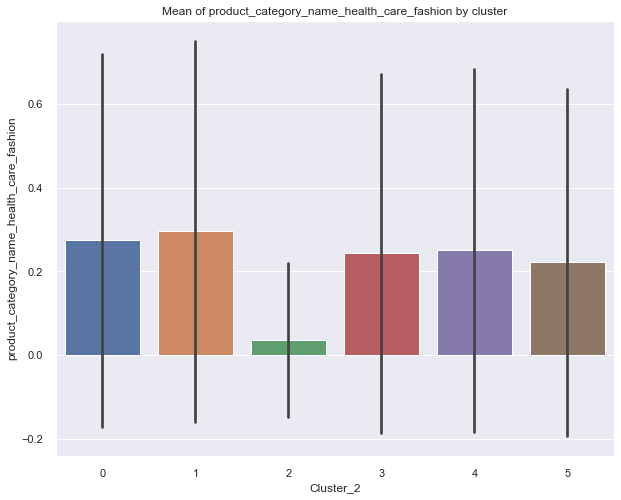

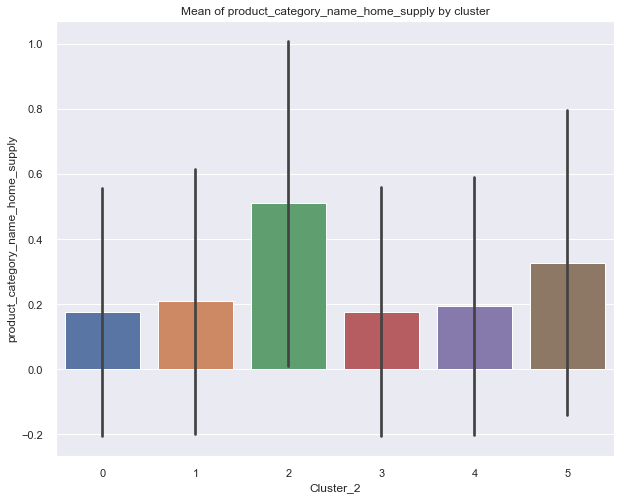

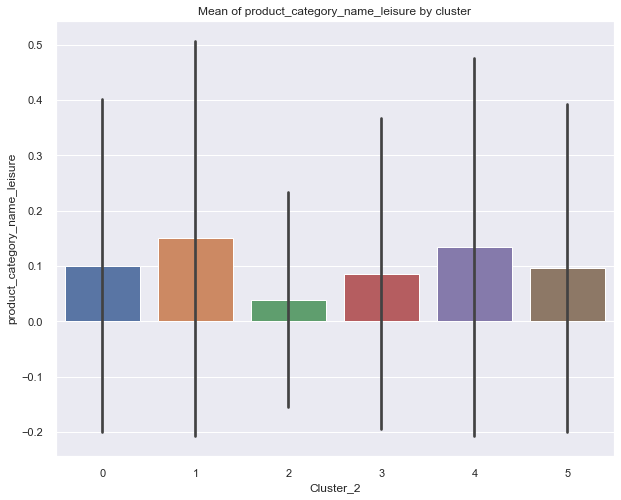

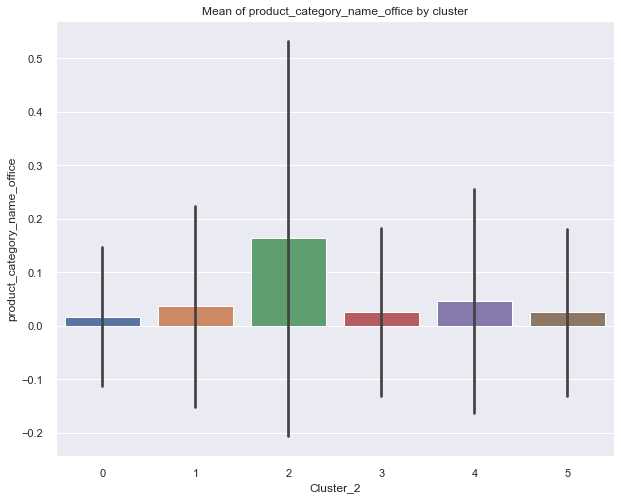

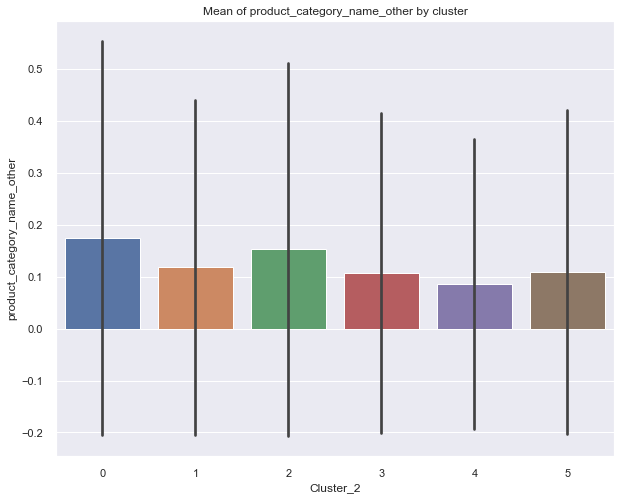

In [90]:
for i in cluster_gp_2.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_2',
                y=i,
                data=df2_2_prepared,
                ci="sd")
    plt.show()

In [91]:
cluster_gp_2.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other
Cluster_2,,,,,,,,,,,,
0,0.121710,0.369053,2.200385,0.113056,-0.094065,0.058318,0.198463,0.274412,0.175859,0.100814,0.017179,0.174955
1,-0.166547,-1.453138,-0.328952,-0.400137,-0.274514,0.032918,0.157417,0.295421,0.209327,0.150032,0.036717,0.118168
2,0.732777,0.022279,-0.118817,-0.169620,2.857506,0.063187,0.036401,0.035027,0.510302,0.039148,0.163462,0.152473
3,7.437780,0.146503,1.061096,0.109816,1.692842,0.076142,0.284264,0.243655,0.177665,0.086294,0.025381,0.106599
4,-0.099506,0.436585,-0.059318,1.799655,-0.172668,0.082229,0.206024,0.250000,0.195783,0.134337,0.046084,0.085542
5,-0.170616,0.462545,-0.319311,-0.416288,-0.244676,0.036218,0.183119,0.221670,0.327787,0.096987,0.024957,0.109262


<img src='Clusters_1.PNG' width="800" height="800">

## 6.2. 6 Months <a class="anchor" id="section_6_2"></a>

In [92]:
df2_2 = df[df['order_purchase_timestamp'] > '2018-03-01 00:00:00']

In [93]:
df2_2 = df2_2[['total_price',
               'product_category_name',
               'product_name_lenght',
               'product_description_lenght',
               'product_photos_qty',
               'product_weight_g']]

In [94]:
df2_2.reset_index(inplace=True, drop=True)

In [95]:
df2_2_prepared = data_transform(df2_2)

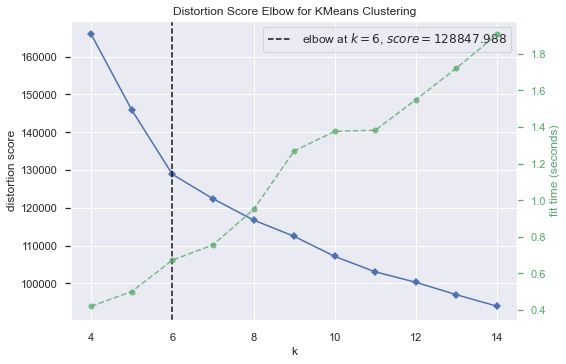

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [96]:
model2 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model2, k=(4, 15), random_state=42)

visualizer.fit(df2_2_prepared.copy())
visualizer.poof()

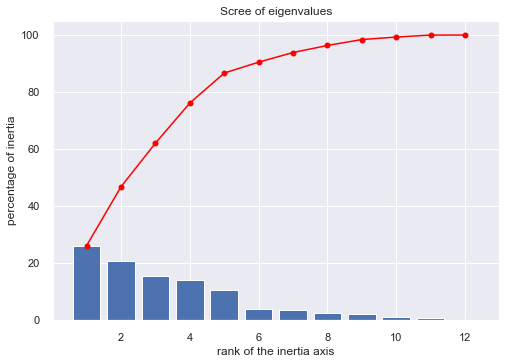

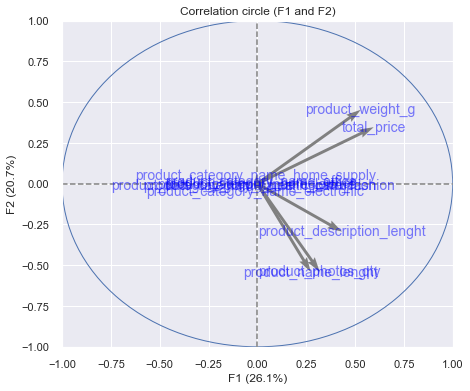

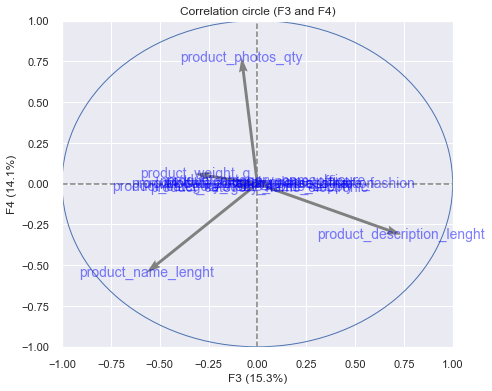

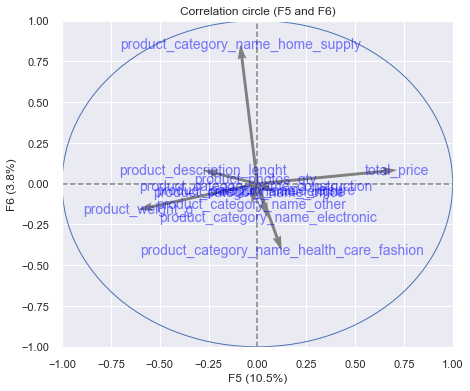

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


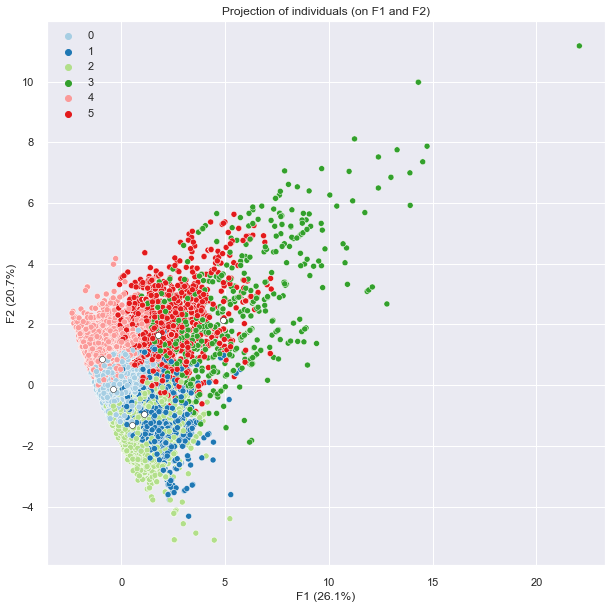

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


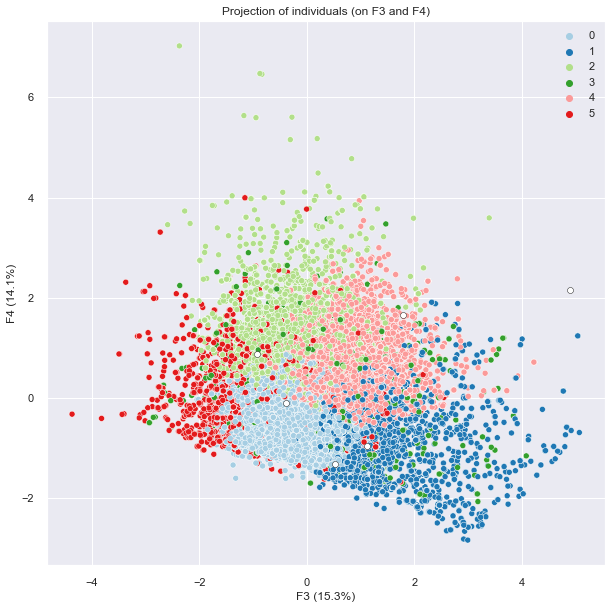

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


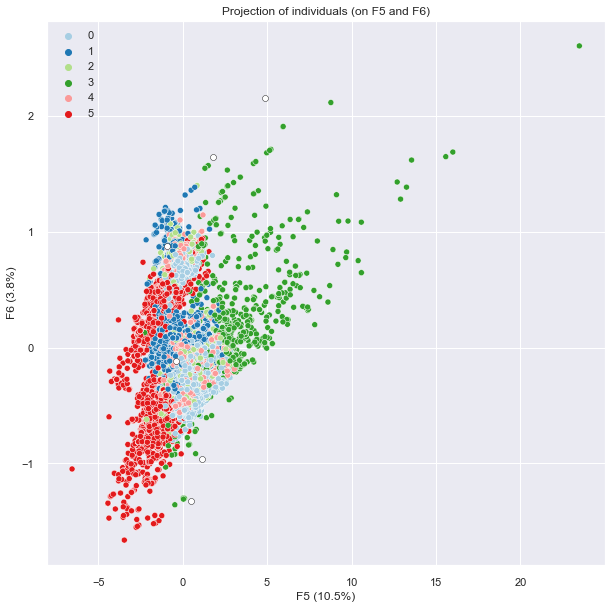

1:80: E501 line too long (80 > 79 characters)


In [97]:
clustering_pca_kmeans(df2_2_prepared.copy(), df2_2_prepared.columns.tolist(), 6)

In [98]:
model2 = KMeans(6, random_state=42)

In [99]:
cluster_labels = model2.fit_predict(df2_2_prepared.copy())

silhouette_avg = silhouette_score(df2_2_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.23530758028473392


In [100]:
model2.fit(df2_2_prepared)
df2_2_prepared['Cluster_2'] = model2.predict(df2_2_prepared)

In [101]:
cluster_gp_2 = df2_2_prepared.groupby('Cluster_2').mean()

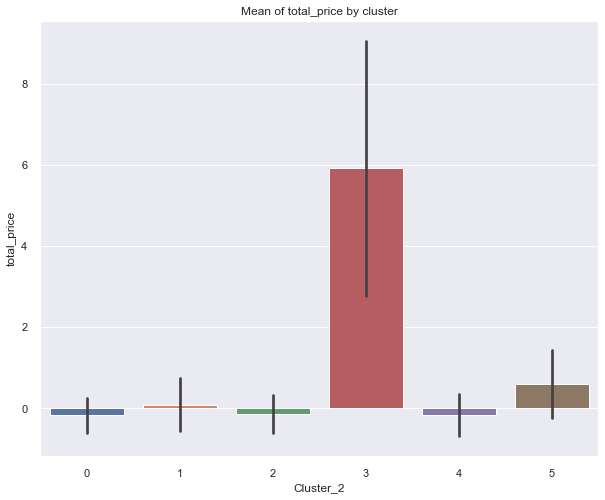

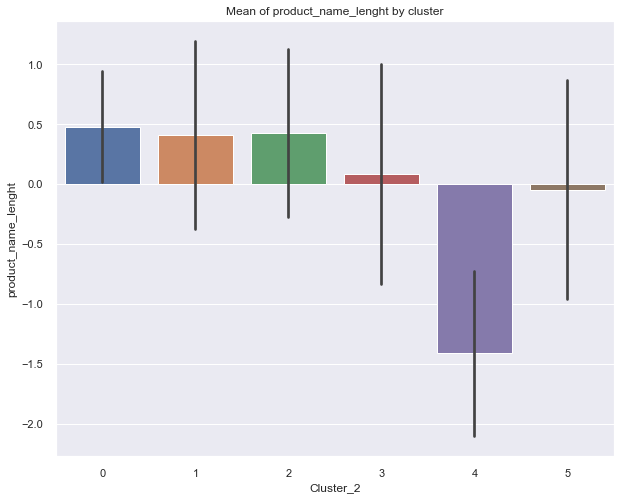

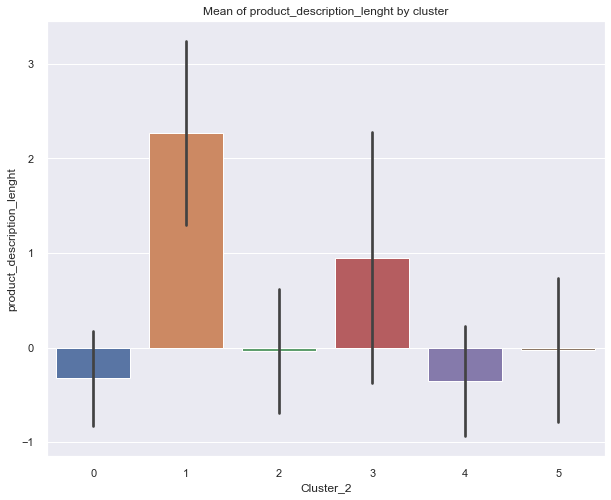

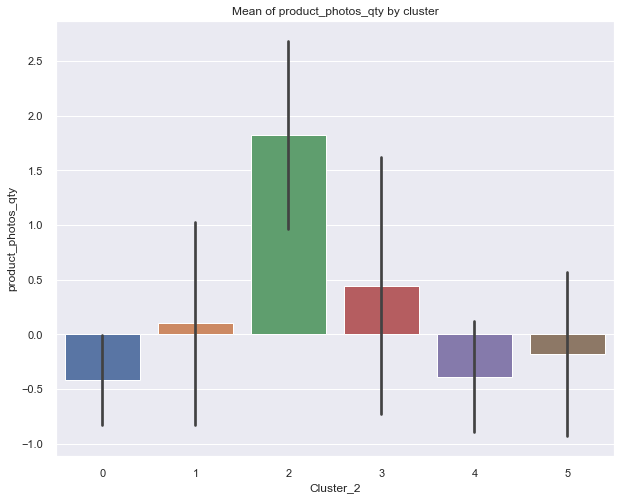

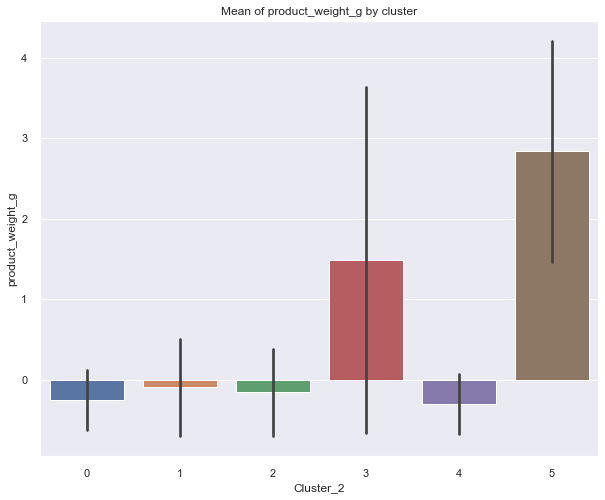

...

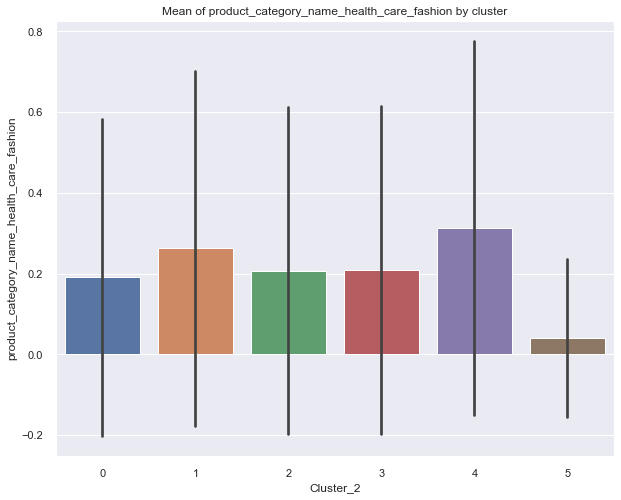

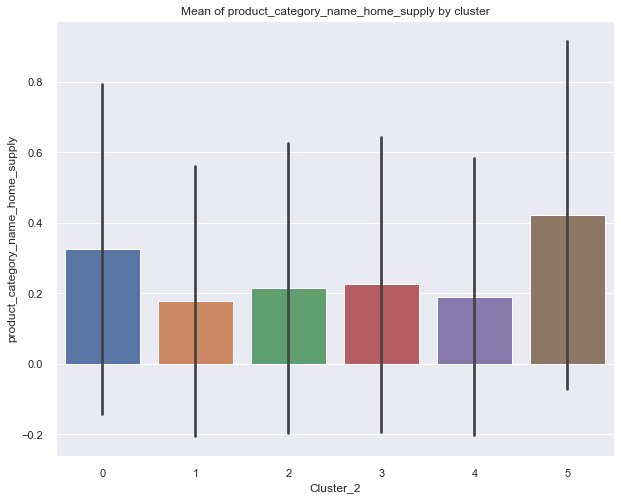

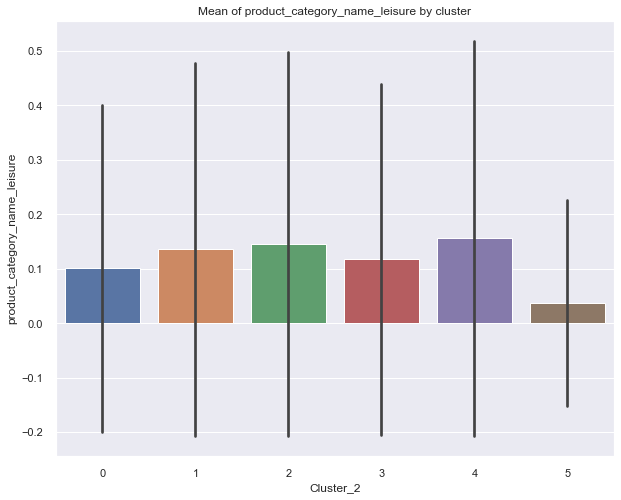

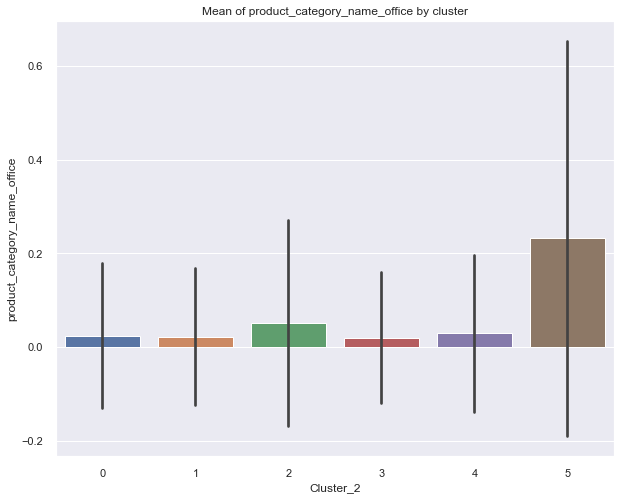

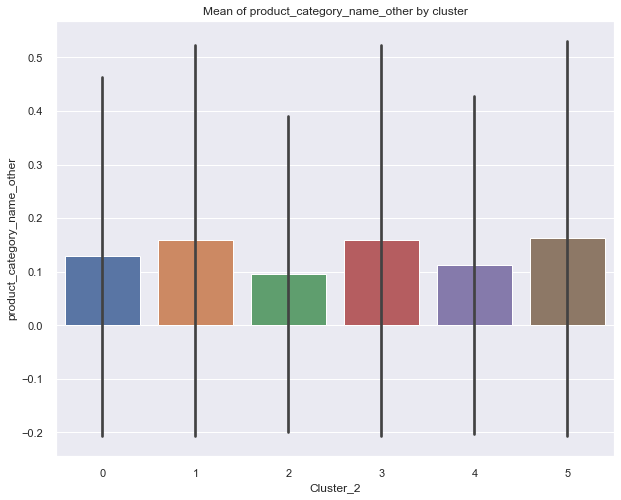

In [102]:
for i in cluster_gp_2.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_2',
                y=i,
                data=df2_2_prepared,
                ci="sd")
    plt.show()

In [103]:
cluster_gp_2.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other
Cluster_2,,,,,,,,,,,,
0,-0.179404,0.480187,-0.326670,-0.419077,-0.252613,0.031170,0.198552,0.190736,0.325935,0.100651,0.024463,0.128492
1,0.083525,0.410172,2.272785,0.099357,-0.097905,0.049865,0.192498,0.262579,0.178796,0.135894,0.022013,0.158356
2,-0.138512,0.428964,-0.037739,1.824833,-0.155818,0.068805,0.215452,0.206560,0.215743,0.145773,0.051312,0.096356
3,5.910504,0.083790,0.951170,0.445720,1.489493,0.049505,0.219236,0.209335,0.226308,0.117397,0.019802,0.158416
4,-0.170510,-1.412865,-0.355512,-0.388691,-0.303839,0.031576,0.167439,0.313055,0.190518,0.155948,0.028969,0.112495
5,0.604282,-0.047565,-0.025702,-0.181310,2.834031,0.061919,0.044594,0.039782,0.422522,0.036894,0.231954,0.162336


<img src='Clusters_2.PNG' width="800" height="800">

## 6.3. 12 Months<a class="anchor" id="section_6_3"></a>

In [104]:
df2_2 = df[df['order_purchase_timestamp'] > '2017-09-01 00:00:00']

In [105]:
df2_2 = df2_2[['total_price',
               'product_category_name',
               'product_name_lenght',
               'product_description_lenght',
               'product_photos_qty',
               'product_weight_g']]

In [106]:
df2_2.reset_index(inplace=True, drop=True)

In [107]:
df2_2_prepared = data_transform(df2_2)

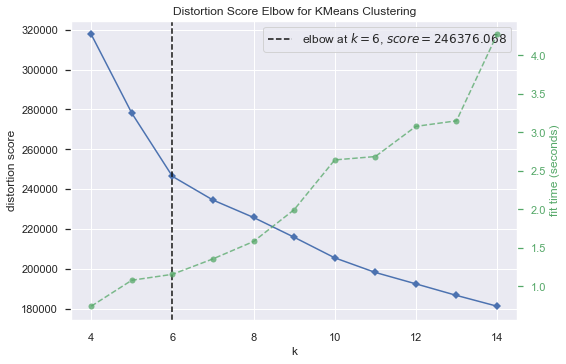

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [108]:
model2 = KMeans(random_state=42)
visualizer = KElbowVisualizer(model2, k=(4, 15), random_state=42)

visualizer.fit(df2_2_prepared.copy())
visualizer.poof()

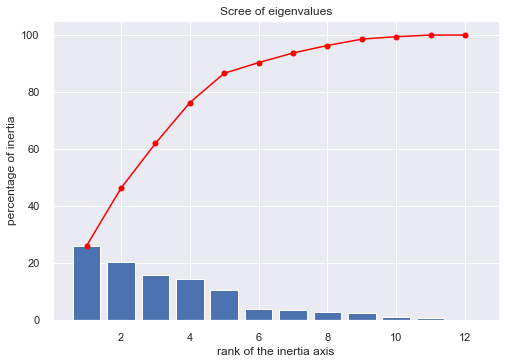

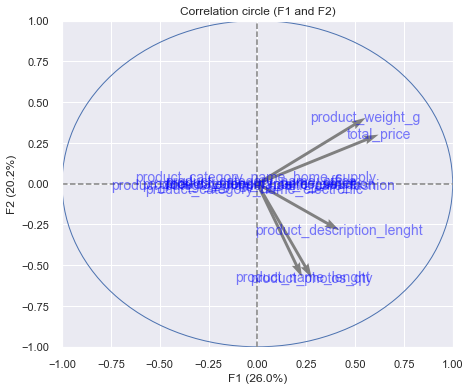

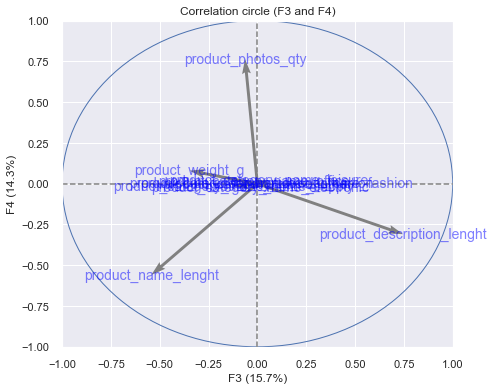

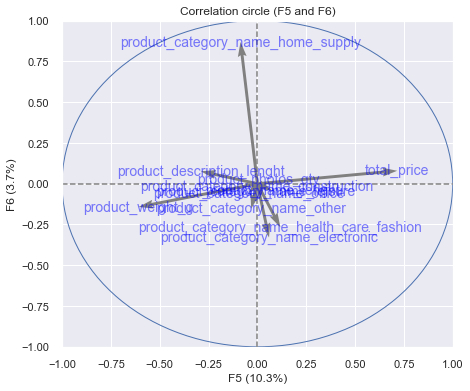

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


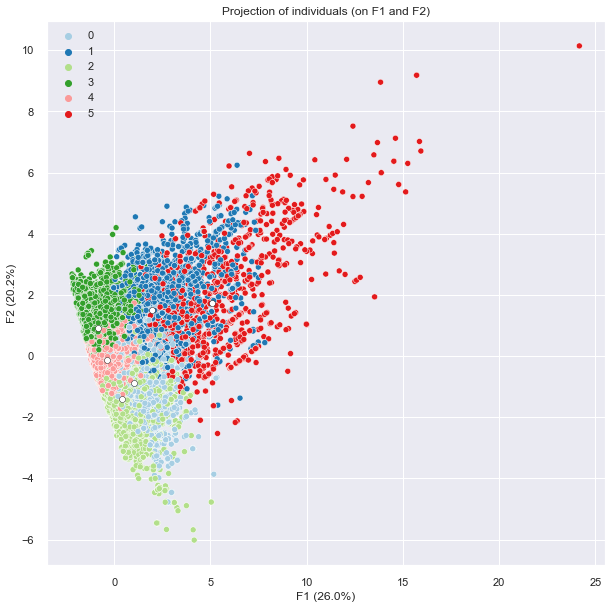

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


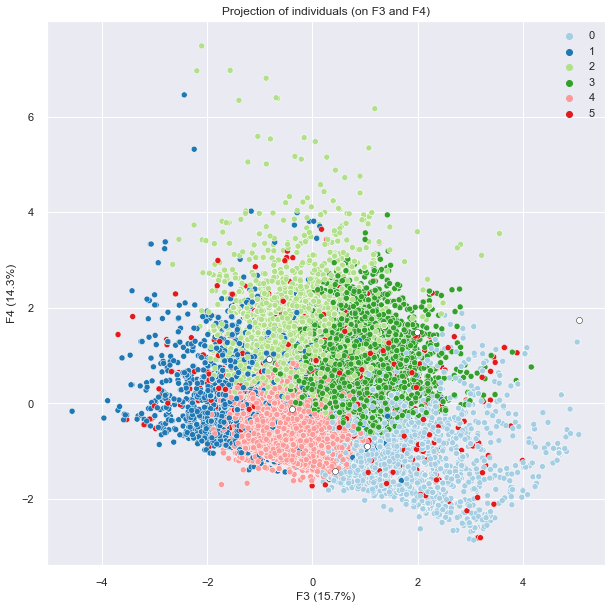

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


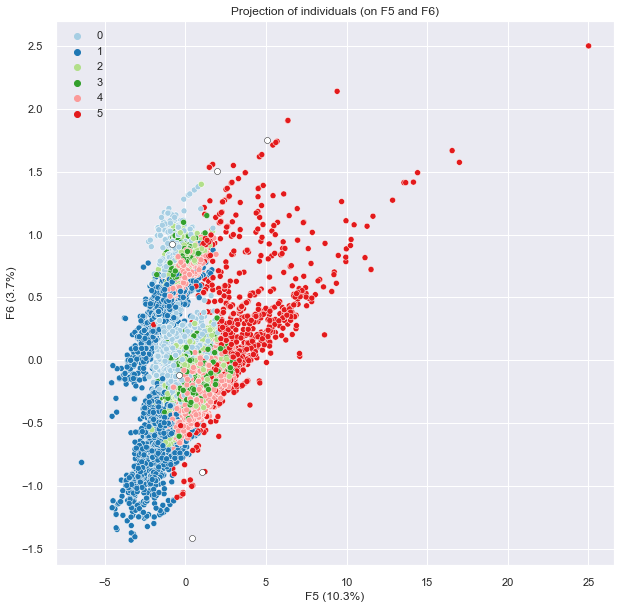

1:80: E501 line too long (80 > 79 characters)


In [109]:
clustering_pca_kmeans(df2_2_prepared.copy(), df2_2_prepared.columns.tolist(), 6)

In [110]:
model2 = KMeans(6, random_state=42)

In [111]:
cluster_labels = model2.fit_predict(df2_2_prepared.copy())

silhouette_avg = silhouette_score(df2_2_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.23251822412332043


In [112]:
model2.fit(df2_2_prepared)
df2_2_prepared['Cluster_2'] = model2.predict(df2_2_prepared)

In [113]:
cluster_gp_2 = df2_2_prepared.groupby('Cluster_2').mean()

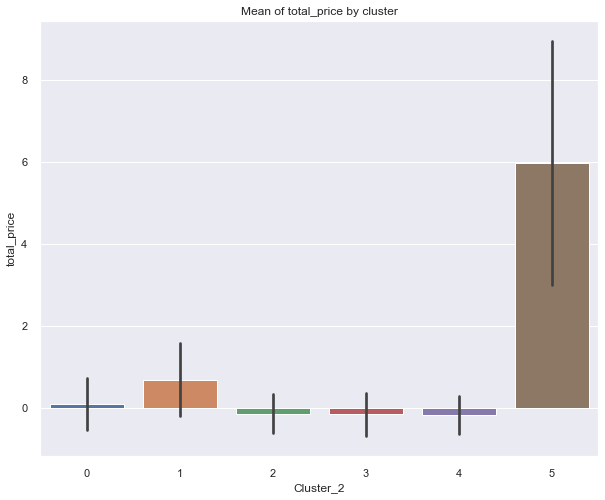

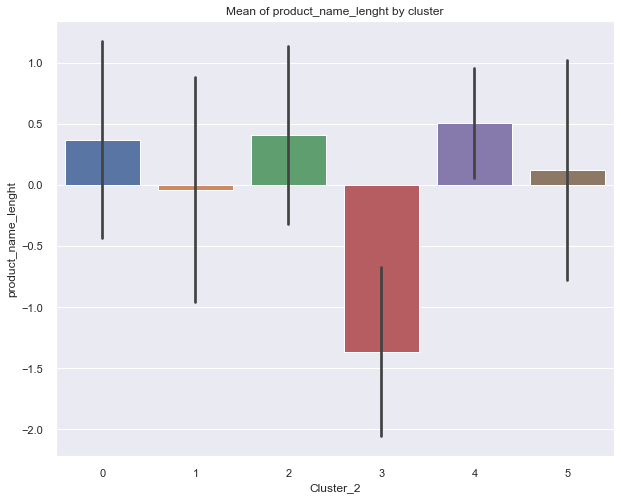

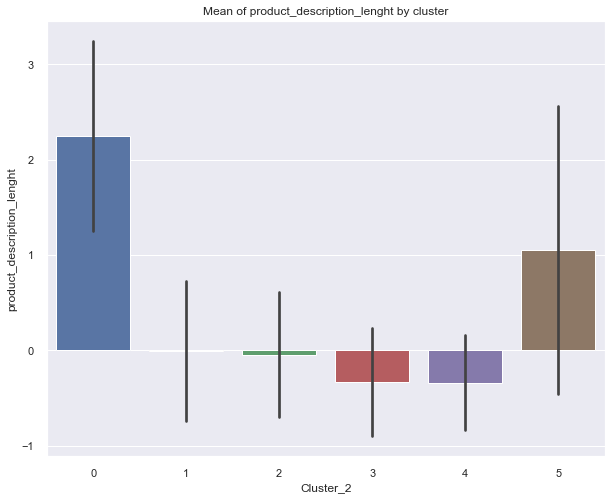

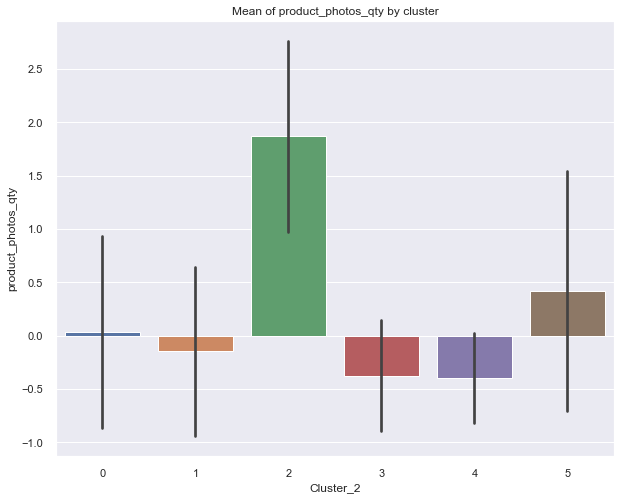

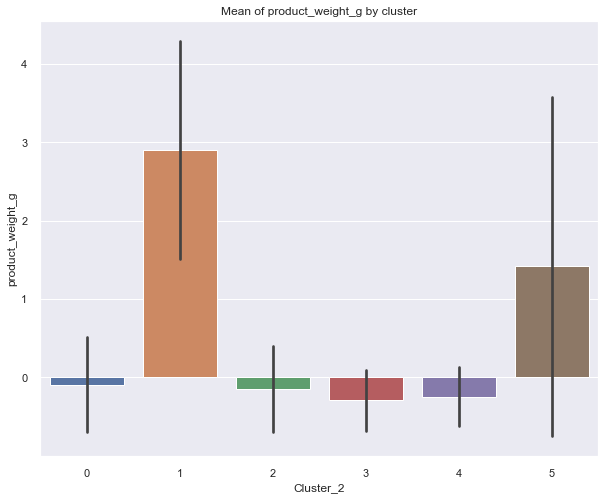

...

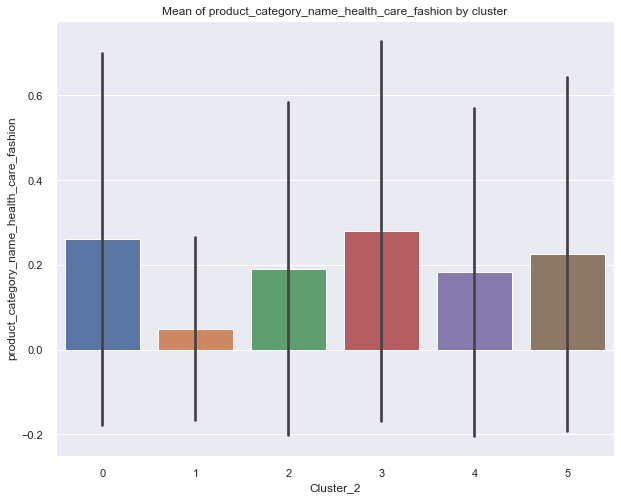

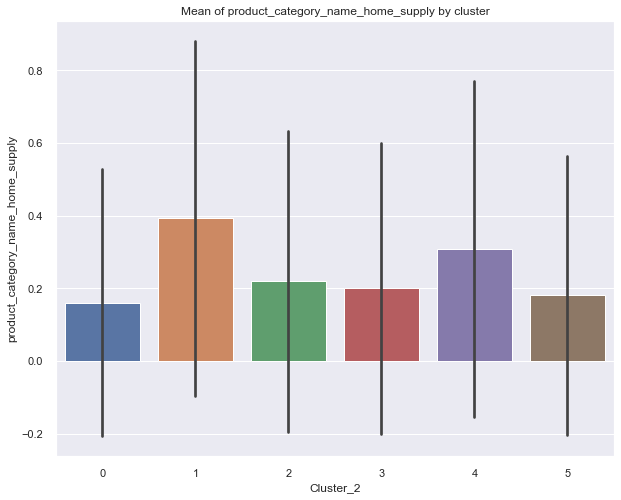

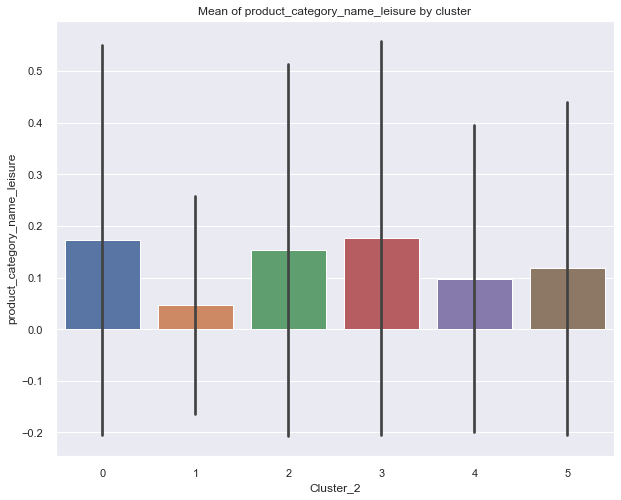

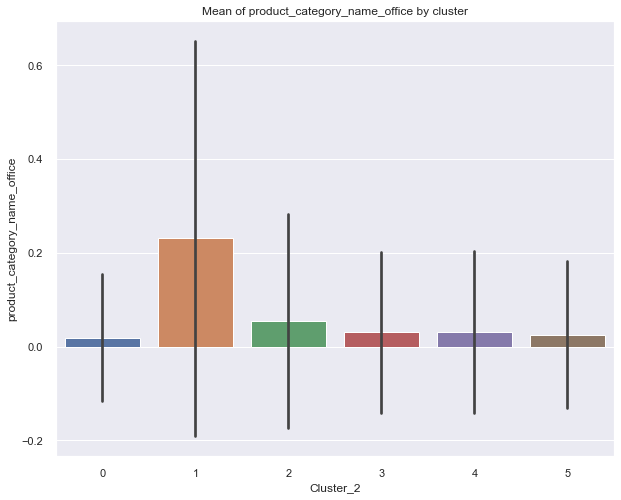

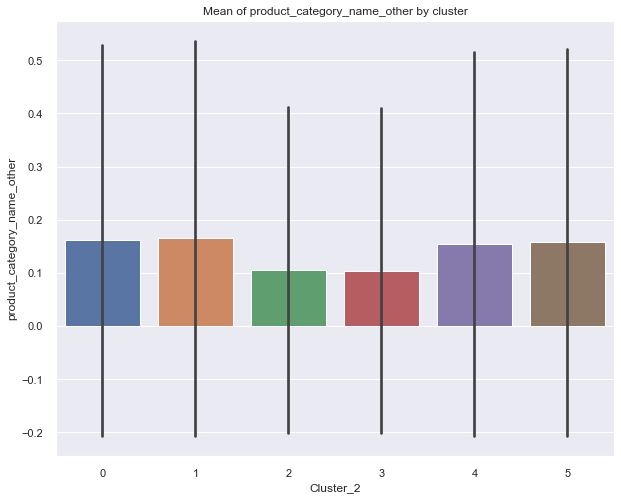

In [114]:
for i in cluster_gp_2.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_2',
                y=i,
                data=df2_2_prepared,
                ci="sd")
    plt.show()

In [115]:
cluster_gp_2.style.background_gradient(cmap=c, low=0, high=1, axis=0)

,total_price,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_category_name_construction,product_category_name_electronic,product_category_name_health_care_fashion,product_category_name_home_supply,product_category_name_leisure,product_category_name_office,product_category_name_other
Cluster_2,,,,,,,,,,,,
0,0.088080,0.372268,2.247863,0.032928,-0.094807,0.032483,0.192921,0.260799,0.160903,0.172779,0.018745,0.161369
1,0.676286,-0.037030,-0.006406,-0.148547,2.909146,0.053272,0.061563,0.049039,0.393367,0.046569,0.230905,0.165285
2,-0.145644,0.411796,-0.043906,1.869327,-0.149633,0.049343,0.226610,0.191365,0.219000,0.153717,0.055111,0.104854
3,-0.167608,-1.363187,-0.333036,-0.374177,-0.291103,0.020532,0.186964,0.280132,0.200475,0.177183,0.030313,0.104402
4,-0.182326,0.507520,-0.338044,-0.398580,-0.246808,0.025121,0.199790,0.182847,0.308630,0.098132,0.030998,0.154481
5,5.967751,0.124377,1.054980,0.416937,1.418593,0.041953,0.250953,0.225782,0.180778,0.118230,0.025172,0.157132


<img src='Clusters_3.PNG' width="800" height="800">

- We get the same clusters over the time.

# 7. RFM<a class="anchor" id="chapter7"></a>

- In this part, we will create RFM segmentation (manually and with KMeans).

## 7.1. Manual<a class="anchor" id="section_7_1"></a>

In [116]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

In [117]:
latest_date = df['order_purchase_timestamp'].max() + timedelta(days=1)

In [118]:
RFMScores = df.groupby('customer_unique_id')\
    .agg({'order_purchase_timestamp': lambda x: (latest_date - x.max()).days,
          'order_id': lambda x: x.nunique(),
          'price': lambda x: x.sum()})

RFMScores['order_purchase_timestamp'] =\
    RFMScores['order_purchase_timestamp'].astype(int)

RFMScores.rename(columns={'order_purchase_timestamp': 'Recency',
                          'order_id': 'Frequency',
                          'price': 'Monetary'}, inplace=True)

In [119]:
RFMScores.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,18.90
0000f46a3911fa3c0805444483337064,537,1,69.00
0000f6ccb0745a6a4b88665a16c9f078,321,1,25.99
0004aac84e0df4da2b147fca70cf8255,288,1,180.00


In [120]:
quantiles = RFMScores.quantile(q=[0.2, 0.4, 0.6, 0.8])
quantiles = quantiles.to_dict()


def RScoring(x, p, d):
    if x <= d[p][0.2]:
        return 5
    elif x <= d[p][0.4]:
        return 4
    elif x <= d[p][0.6]:
        return 3
    elif x <= d[p][0.8]:
        return 2
    else:
        return 1


def FMScoring(x, p, d):
    if x <= d[p][0.2]:
        return 1
    elif x <= d[p][0.4]:
        return 2
    elif x <= d[p][0.6]:
        return 3
    elif x <= d[p][0.8]:
        return 4
    else:
        return 5

In [121]:
RFMScores['R'] =\
    RFMScores['Recency'].apply(RScoring, args=('Recency', quantiles,))
RFMScores['F'] =\
    RFMScores['Frequency'].apply(FMScoring, args=('Frequency', quantiles,))
RFMScores['M'] =\
    RFMScores['Monetary'].apply(FMScoring, args=('Monetary', quantiles,))

In [122]:
RFMScores['RFMGroup'] =\
    RFMScores.R.map(str) + RFMScores.F.map(str) + RFMScores.M.map(str)

In [123]:
RFMScores.head()

,Recency,Frequency,Monetary,R,F,M,RFMGroup
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,129.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,18.90,4,1,1,411
0000f46a3911fa3c0805444483337064,537,1,69.00,1,1,2,112
0000f6ccb0745a6a4b88665a16c9f078,321,1,25.99,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,288,1,180.00,2,1,4,214


In [124]:
RFMScores['RFMGroup'].sort_values().unique()

array(['111', '112', '113', '114', '115', '151', '152', '153', '154',
       '155', '211', '212', '213', '214', '215', '251', '252', '253',
       '254', '255', '311', '312', '313', '314', '315', '351', '352',
       '353', '354', '355', '411', '412', '413', '414', '415', '451',
       '452', '453', '454', '455', '511', '512', '513', '514', '515',
       '551', '552', '553', '554', '555'], dtype=object)

In [125]:
hibernation = ['111', '112', '113', '114', '115',
               '211', '212', '213', '214', '215']
Can_not_lose_them = ['151', '152', '153', '154', '155',
                     '251', '252', '253', '254', '255']
About_to_sleep = ['311', '312', '313', '314', '315']
Promising = ['411', '412', '413', '414', '415']
New_customers = ['511', '512', '513', '514', '515']
Loyal_customers = ['351', '352', '353', '354', '355',
                   '451', '452', '453', '454', '455']
Champions = ['551', '552', '553', '554', '555']

In [126]:
RFMScores['Seg_Score'] = 'hibernation'
RFMScores.loc[RFMScores['RFMGroup'].isin(Can_not_lose_them),
              'Seg_Score'] = 'Can_not_lose_them'
RFMScores.loc[RFMScores['RFMGroup'].isin(About_to_sleep),
              'Seg_Score'] = 'About_to_sleep'
RFMScores.loc[RFMScores['RFMGroup'].isin(Promising),
              'Seg_Score'] = 'Promising'
RFMScores.loc[RFMScores['RFMGroup'].isin(New_customers),
              'Seg_Score'] = 'New_customers'
RFMScores.loc[RFMScores['RFMGroup'].isin(Loyal_customers),
              'Seg_Score'] = 'Loyal_customers'
RFMScores.loc[RFMScores['RFMGroup'].isin(Champions),
              'Seg_Score'] = 'Champions'

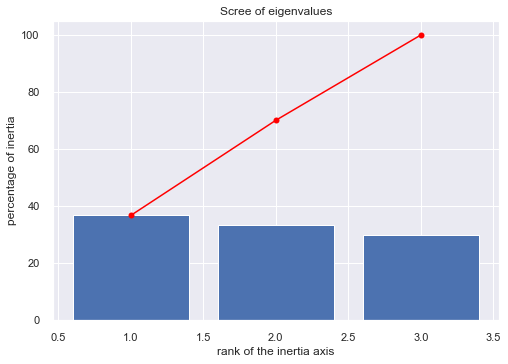

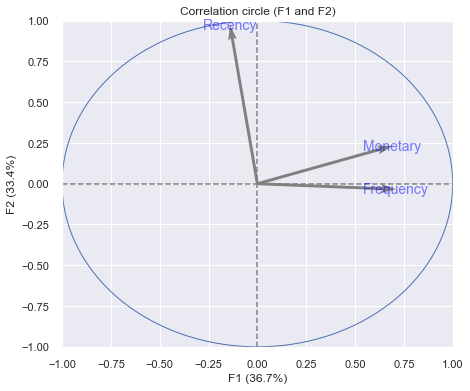

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


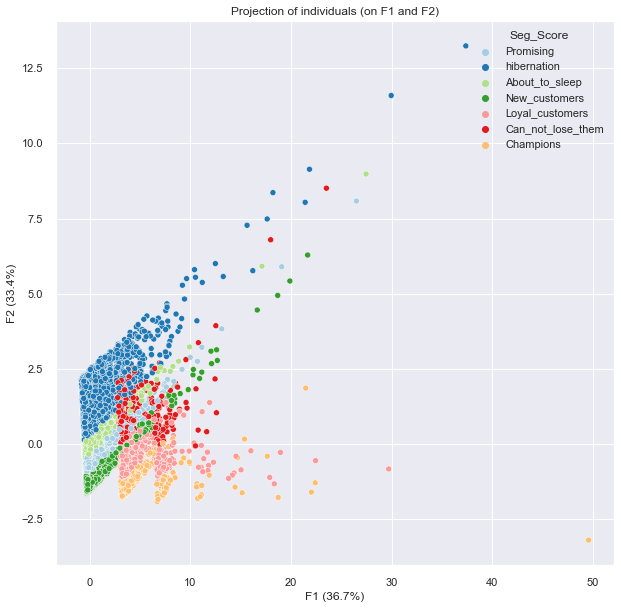

In [127]:
pca(RFMScores.copy(), ['Recency', 'Frequency', 'Monetary'], 'Seg_Score')

Text(0, 0.5, 'Count')

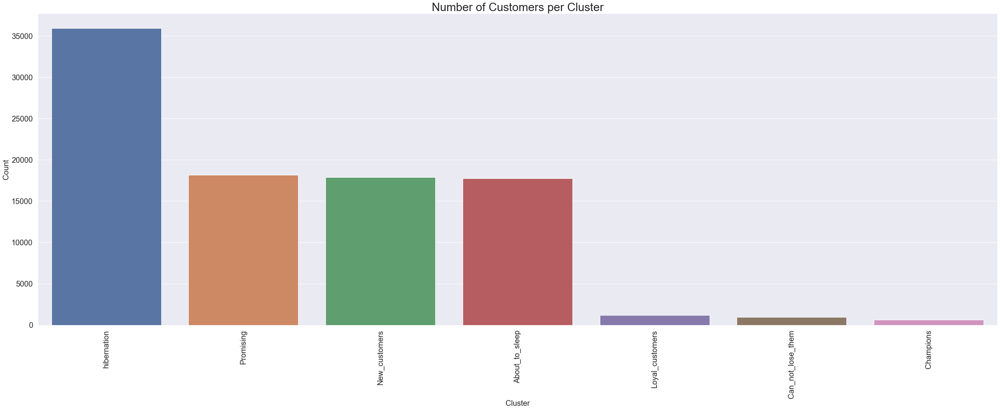

In [128]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=RFMScores['Seg_Score'].value_counts().index,
            y=RFMScores['Seg_Score'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

## 7.2. KMeans<a class="anchor" id="section_7_2"></a>

In [129]:
RFMScores_scaled = StandardScaler().fit_transform(
    RFMScores[['Recency', 'Frequency', 'Monetary']])

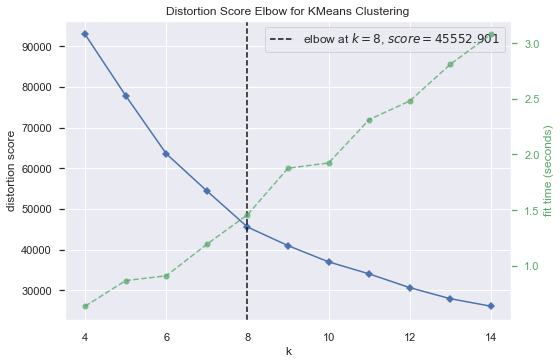

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [130]:
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(4, 15), random_state=42)

visualizer.fit(RFMScores_scaled.copy())
visualizer.poof()

In [131]:
model = KMeans(8, random_state=42)

In [132]:
cluster_labels = model.fit_predict(RFMScores_scaled.copy())

silhouette_avg = silhouette_score(RFMScores_scaled.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.45614889153146637


In [133]:
model.fit(RFMScores_scaled)
RFMScores['Cluster'] = model.predict(RFMScores_scaled)

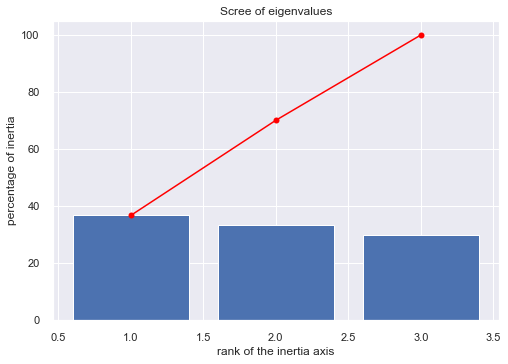

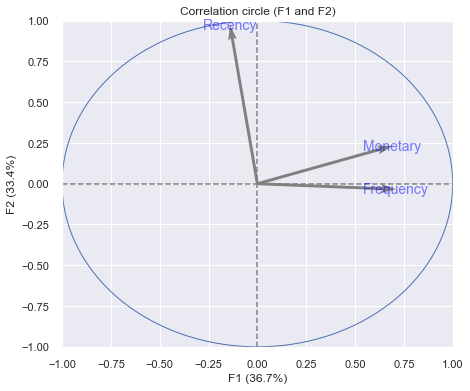

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


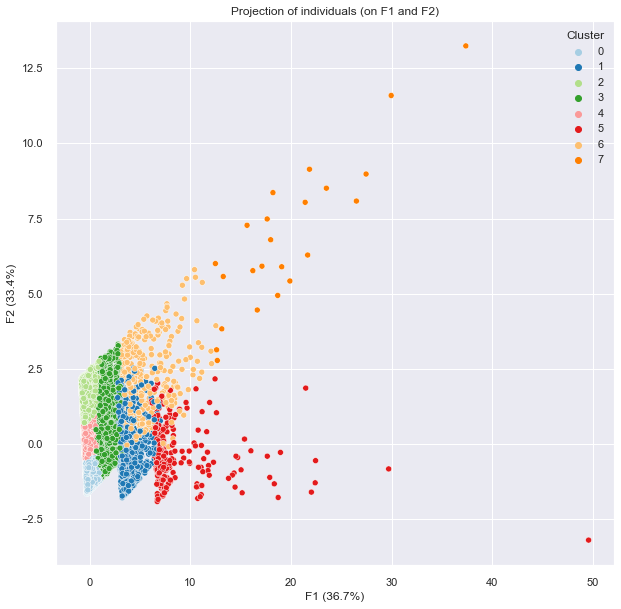

In [134]:
pca(RFMScores.copy(), ['Recency', 'Frequency', 'Monetary'], 'Cluster')

Text(0, 0.5, 'Count')

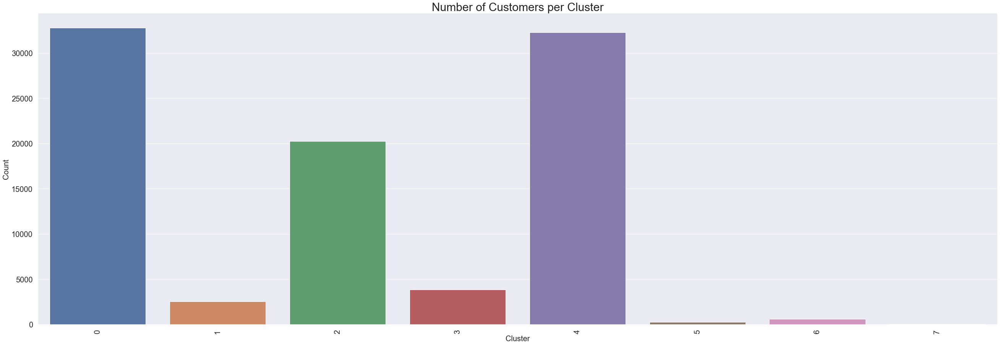

In [135]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=RFMScores['Cluster'].value_counts().index,
            y=RFMScores['Cluster'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

## 7.3. Comparison<a class="anchor" id="section_7_3"></a>

In [136]:
def clusters_c(df, clusters):
    plt.figure(figsize=(10, 7))
    plt.title('Major segmentation for clusters', size=20)
    plt.xlabel('Clusters', size=18)
    plt.ylabel('count', size=18)
    sns.countplot(x=clusters, hue='Seg_Score', data=df,
                  hue_order=['hibernation',
                             'About_to_sleep',
                             'Can_not_lose_them',
                             'New_customers',
                             'Promising',
                             'Loyal_customers',
                             'Champions'])
    plt.legend(bbox_to_anchor=(1.01, 1), borderaxespad=0)

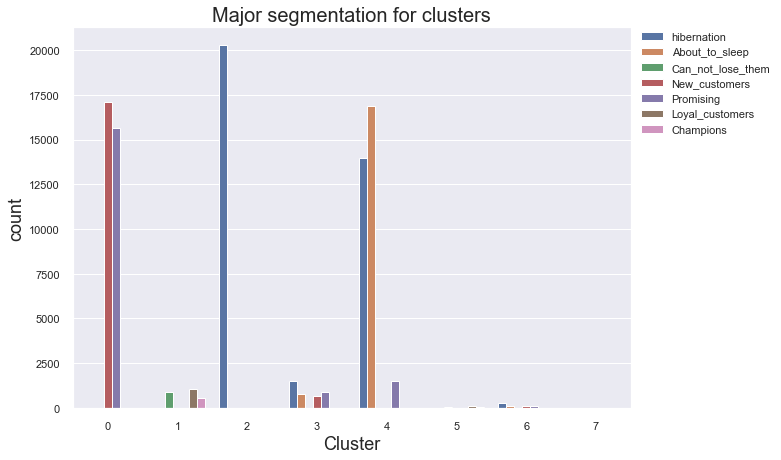

In [137]:
clusters_c(RFMScores, 'Cluster')

## 7.4. Evolution by Time<a class="anchor" id="section_7_4"></a>

### 7.4.1. 3 Months

In [138]:
df_1 = df[df['order_purchase_timestamp'] > '2018-06-01 00:00:00']

In [139]:
latest_date_1 = df_1['order_purchase_timestamp'].max() + timedelta(days=1)

In [140]:
RFMScores_1 = df_1.groupby('customer_unique_id')\
    .agg({'order_purchase_timestamp': lambda x: (latest_date - x.max()).days,
          'order_id': lambda x: x.nunique(),
          'price': lambda x: x.sum()})

RFMScores_1['order_purchase_timestamp'] =\
    RFMScores_1['order_purchase_timestamp'].astype(int)

RFMScores_1.rename(columns={'order_purchase_timestamp': 'Recency',
                            'order_id': 'Frequency',
                            'price': 'Monetary'}, inplace=True)

In [141]:
RFMScores_1.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
000e309254ab1fc5ba99dd469d36bdb4,66,1,119.80
000ec5bff359e1c0ad76a81a45cb598f,9,1,14.96
000fbf0473c10fc1ab6f8d2d286ce20c,35,1,285.80
0015752e079902b12cd00b9b7596276b,27,1,59.80
00172711b30d52eea8b313a7f2cced02,33,1,74.50


In [142]:
quantiles = RFMScores_1.quantile(q=[0.2, 0.4, 0.6, 0.8])
quantiles = quantiles.to_dict()

In [143]:
RFMScores_1['R'] =\
    RFMScores_1['Recency'].apply(RScoring, args=('Recency', quantiles,))
RFMScores_1['F'] =\
    RFMScores_1['Frequency'].apply(FMScoring, args=('Frequency', quantiles,))
RFMScores_1['M'] =\
    RFMScores_1['Monetary'].apply(FMScoring, args=('Monetary', quantiles,))

In [144]:
RFMScores_1['RFMGroup'] =\
    RFMScores_1.R.map(str) + RFMScores_1.F.map(str) + RFMScores_1.M.map(str)

In [145]:
RFMScores_1.head()

,Recency,Frequency,Monetary,R,F,M,RFMGroup
customer_unique_id,,,,,,,
000e309254ab1fc5ba99dd469d36bdb4,66,1,119.80,2,1,4,214
000ec5bff359e1c0ad76a81a45cb598f,9,1,14.96,5,1,1,511
000fbf0473c10fc1ab6f8d2d286ce20c,35,1,285.80,3,1,5,315
0015752e079902b12cd00b9b7596276b,27,1,59.80,4,1,2,412
00172711b30d52eea8b313a7f2cced02,33,1,74.50,4,1,3,413


In [146]:
RFMScores_1['RFMGroup'].sort_values().unique()

array(['111', '112', '113', '114', '115', '151', '152', '153', '154',
       '155', '211', '212', '213', '214', '215', '251', '252', '253',
       '254', '255', '311', '312', '313', '314', '315', '351', '352',
       '353', '354', '355', '411', '412', '413', '414', '415', '452',
       '453', '454', '455', '511', '512', '513', '514', '515', '551',
       '552', '553', '554', '555'], dtype=object)

In [147]:
hibernation = ['111', '112', '113', '114', '115',
               '211', '212', '213', '214', '215']
Can_not_lose_them = ['151', '152', '153', '154', '155',
                     '251', '252', '253', '254', '255']
About_to_sleep = ['311', '312', '313', '314', '315']
Promising = ['411', '412', '413', '414', '415']
New_customers = ['511', '512', '513', '514', '515']
Loyal_customers = ['351', '352', '353', '354', '355',
                   '452', '453', '454', '455']
Champions = ['551', '552', '553', '554', '555']

In [148]:
RFMScores_1['Seg_Score'] = 'hibernation'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(Can_not_lose_them),
                'Seg_Score'] = 'Can_not_lose_them'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(About_to_sleep),
                'Seg_Score'] = 'About_to_sleep'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(Promising),
                'Seg_Score'] = 'Promising'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(New_customers),
                'Seg_Score'] = 'New_customers'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(Loyal_customers),
                'Seg_Score'] = 'Loyal_customers'
RFMScores_1.loc[RFMScores_1['RFMGroup'].isin(Champions),
                'Seg_Score'] = 'Champions'

In [149]:
RFMScores_1['Seg_Score'].value_counts()

hibernation          7185
Promising            3737
New_customers        3664
About_to_sleep       3512
Loyal_customers       109
Champions              56
Can_not_lose_them      43
Name: Seg_Score, dtype: int64

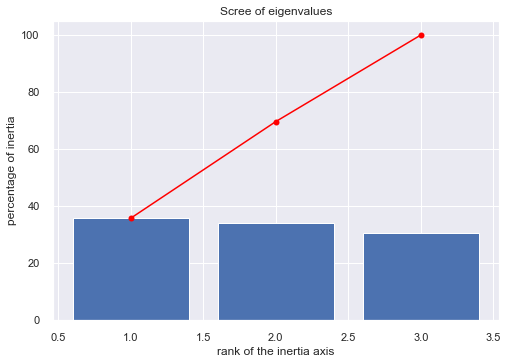

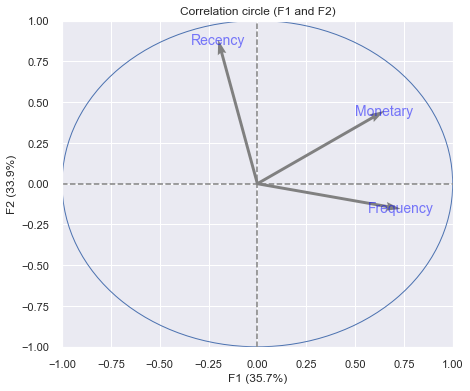

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


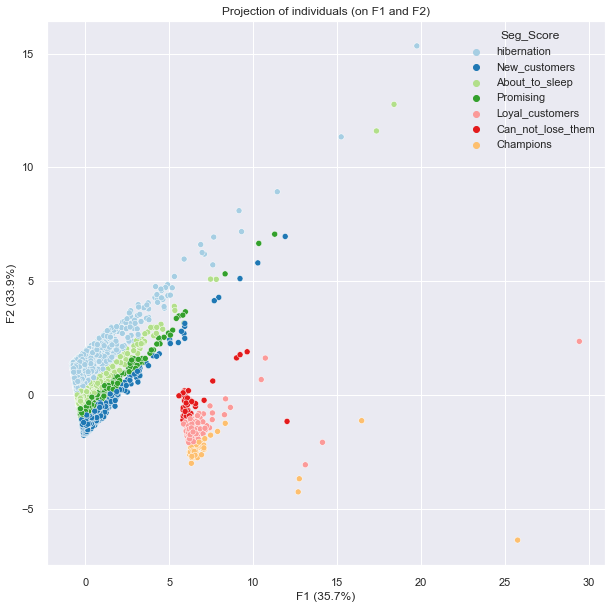

In [150]:
pca(RFMScores_1.copy(), ['Recency', 'Frequency', 'Monetary'], 'Seg_Score')

In [151]:
RFMScores_1_scaled = StandardScaler().fit_transform(
    RFMScores_1[['Recency', 'Frequency', 'Monetary']])

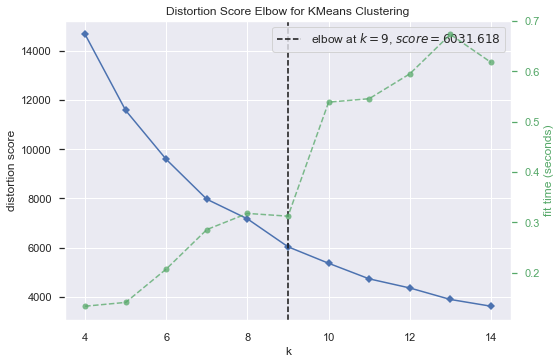

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [152]:
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(4, 15), random_state=42)

visualizer.fit(RFMScores_1_scaled.copy())
visualizer.poof()

In [153]:
model = KMeans(9, random_state=42)

In [154]:
cluster_labels = model.fit_predict(RFMScores_1_scaled.copy())

silhouette_avg = silhouette_score(RFMScores_1_scaled.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.400773856064619


In [155]:
model.fit(RFMScores_1_scaled)
RFMScores_1['Cluster'] = model.predict(RFMScores_1_scaled)

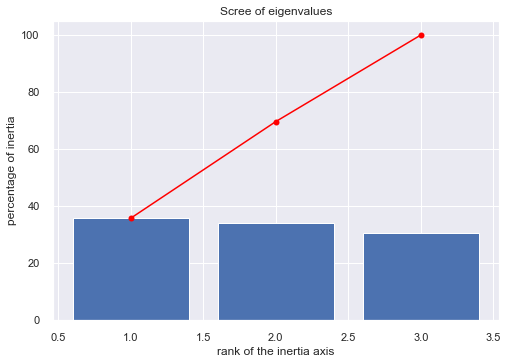

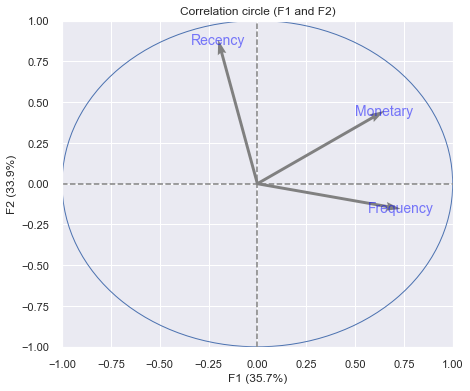

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


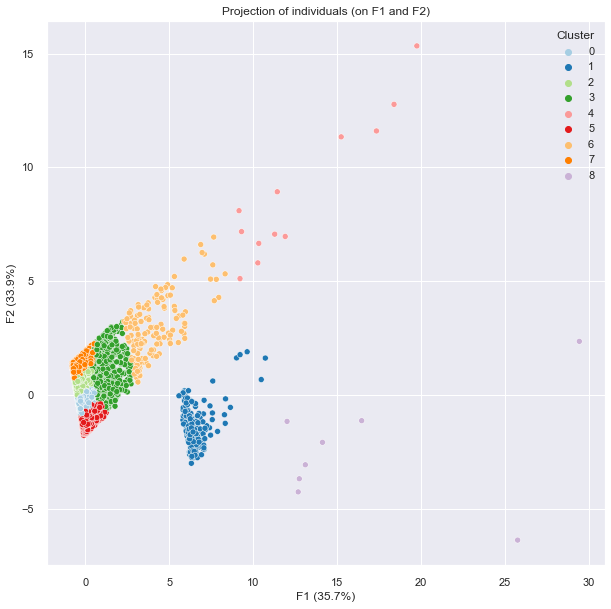

In [156]:
pca(RFMScores_1.copy(), ['Recency', 'Frequency', 'Monetary'], 'Cluster')

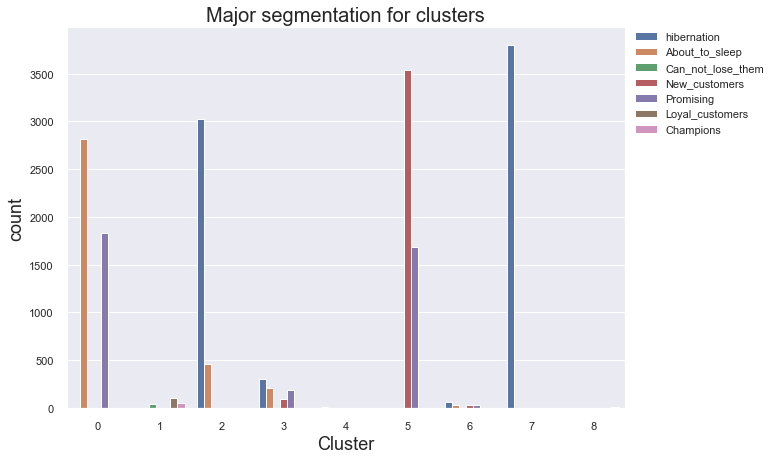

In [157]:
clusters_c(RFMScores_1, 'Cluster')

### 7.4.2. 6 Months

In [158]:
df_2 = df[df['order_purchase_timestamp'] > '2018-03-01 00:00:00']

In [159]:
latest_date_2 = df_2['order_purchase_timestamp'].max() + timedelta(days=1)

In [160]:
RFMScores_2 = df_2.groupby('customer_unique_id')\
    .agg({'order_purchase_timestamp': lambda x: (latest_date - x.max()).days,
          'order_id': lambda x: x.nunique(),
          'price': lambda x: x.sum()})

RFMScores_2['order_purchase_timestamp'] =\
    RFMScores_2['order_purchase_timestamp'].astype(int)

RFMScores_2.rename(columns={'order_purchase_timestamp': 'Recency',
                            'order_id': 'Frequency',
                            'price': 'Monetary'}, inplace=True)

In [161]:
RFMScores_2.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,18.90
0004bd2a26a76fe21f786e4fbd80607f,146,1,154.00
00050ab1314c0e55a6ca13cf7181fecf,132,1,27.99
0005ef4cd20d2893f0d9fbd94d3c0d97,170,1,104.90


In [162]:
quantiles = RFMScores_2.quantile(q=[0.2, 0.4, 0.6, 0.8])
quantiles = quantiles.to_dict()

In [163]:
RFMScores_2['R'] =\
    RFMScores_2['Recency'].apply(RScoring, args=('Recency', quantiles,))
RFMScores_2['F'] =\
    RFMScores_2['Frequency'].apply(FMScoring, args=('Frequency', quantiles,))
RFMScores_2['M'] =\
    RFMScores_2['Monetary'].apply(FMScoring, args=('Monetary', quantiles,))

In [164]:
RFMScores_2['RFMGroup'] =\
    RFMScores_2.R.map(str) + RFMScores_2.F.map(str) + RFMScores_2.M.map(str)

In [165]:
RFMScores_2['RFMGroup'].sort_values().unique()

array(['111', '112', '113', '114', '115', '151', '152', '153', '154',
       '155', '211', '212', '213', '214', '215', '251', '252', '253',
       '254', '255', '311', '312', '313', '314', '315', '351', '352',
       '353', '354', '355', '411', '412', '413', '414', '415', '451',
       '452', '453', '454', '455', '511', '512', '513', '514', '515',
       '551', '552', '553', '554', '555'], dtype=object)

In [166]:
hibernation = ['111', '112', '113', '114', '115',
               '211', '212', '213', '214', '215']
Can_not_lose_them = ['151', '152', '153', '154', '155',
                     '251', '252', '253', '254', '255']
About_to_sleep = ['311', '312', '313', '314', '315']
Promising = ['411', '412', '413', '414', '415']
New_customers = ['511', '512', '513', '514', '515']
Loyal_customers = ['351', '352', '353', '354', '355',
                   '451', '452', '453', '454', '455']
Champions = ['551', '552', '553', '554', '555']

In [167]:
RFMScores_2['Seg_Score'] = 'hibernation'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(Can_not_lose_them),
                'Seg_Score'] = 'Can_not_lose_them'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(About_to_sleep),
                'Seg_Score'] = 'About_to_sleep'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(Promising),
                'Seg_Score'] = 'Promising'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(New_customers),
                'Seg_Score'] = 'New_customers'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(Loyal_customers),
                'Seg_Score'] = 'Loyal_customers'
RFMScores_2.loc[RFMScores_2['RFMGroup'].isin(Champions),
                'Seg_Score'] = 'Champions'

In [168]:
RFMScores_2['Seg_Score'].value_counts()

hibernation          14833
About_to_sleep        7798
New_customers         7615
Promising             7431
Loyal_customers        299
Can_not_lose_them      183
Champions              145
Name: Seg_Score, dtype: int64

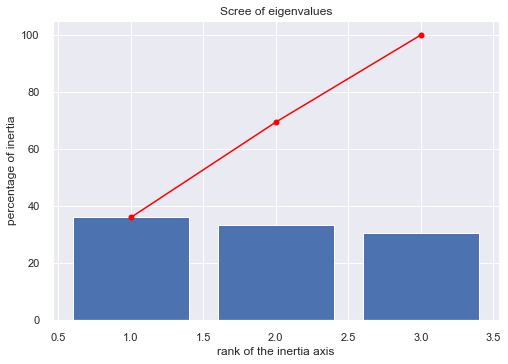

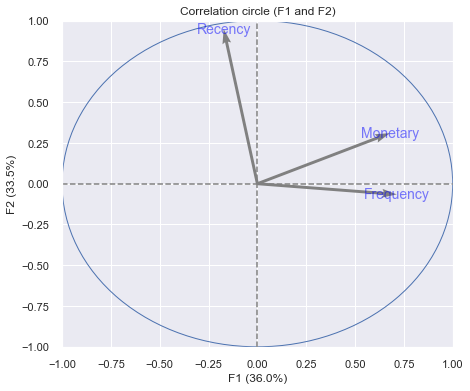

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


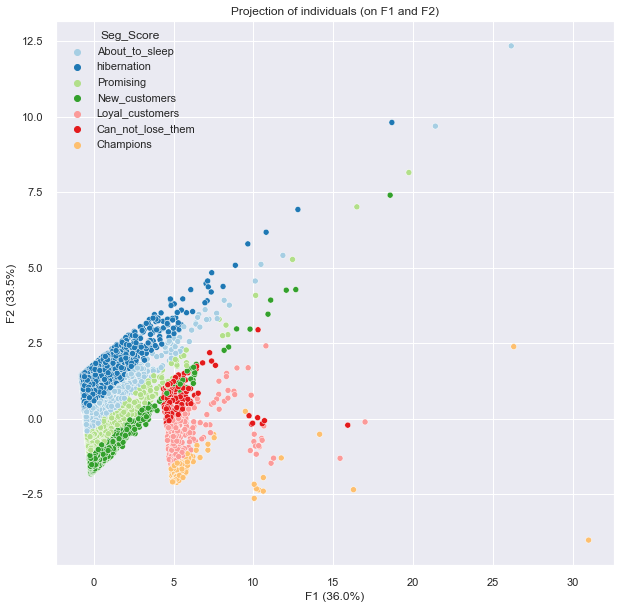

In [169]:
pca(RFMScores_2.copy(), ['Recency', 'Frequency', 'Monetary'], 'Seg_Score')

In [170]:
RFMScores_2_scaled = StandardScaler().fit_transform(
    RFMScores_2[['Recency', 'Frequency', 'Monetary']])

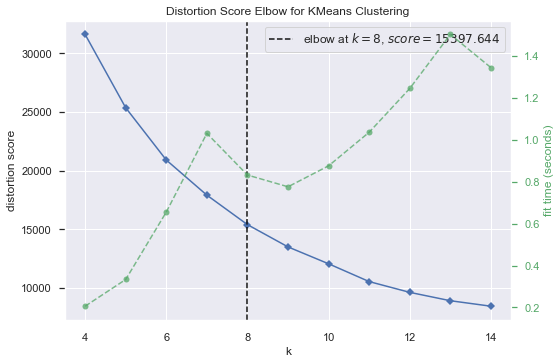

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [171]:
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(4, 15), random_state=42)

visualizer.fit(RFMScores_2_scaled.copy())
visualizer.poof()

In [172]:
model = KMeans(8, random_state=42)

In [173]:
cluster_labels = model.fit_predict(RFMScores_2_scaled.copy())

silhouette_avg = silhouette_score(RFMScores_2_scaled.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.46172850638562163


In [174]:
model.fit(RFMScores_2_scaled)
RFMScores_2['Cluster'] = model.predict(RFMScores_2_scaled)

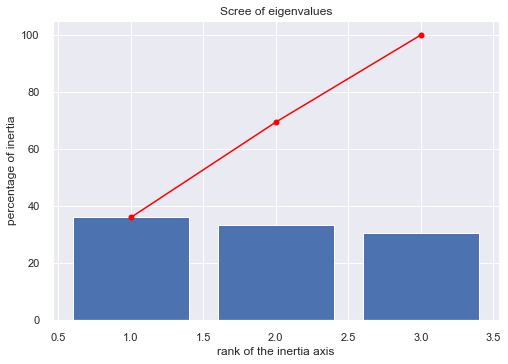

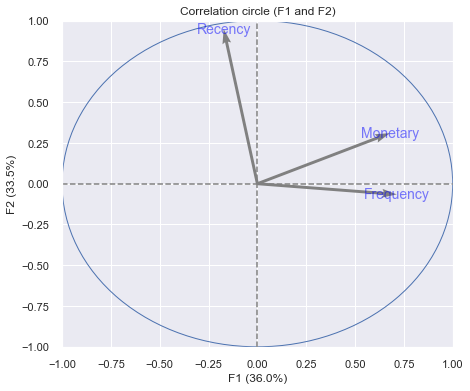

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


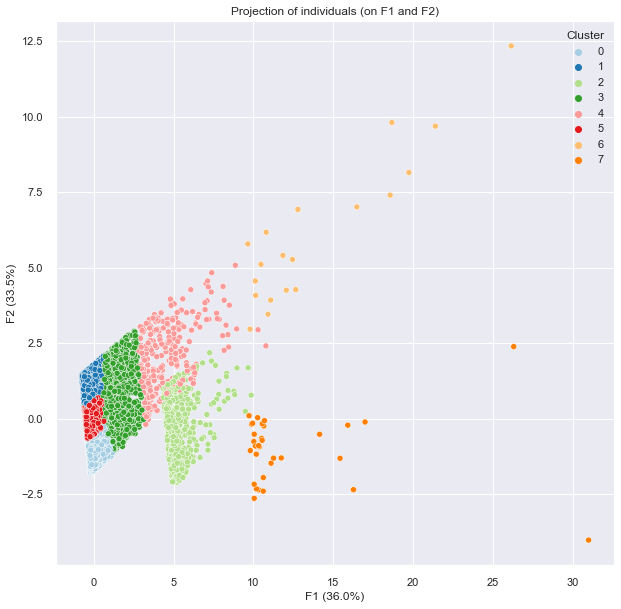

In [175]:
pca(RFMScores_2.copy(), ['Recency', 'Frequency', 'Monetary'], 'Cluster')

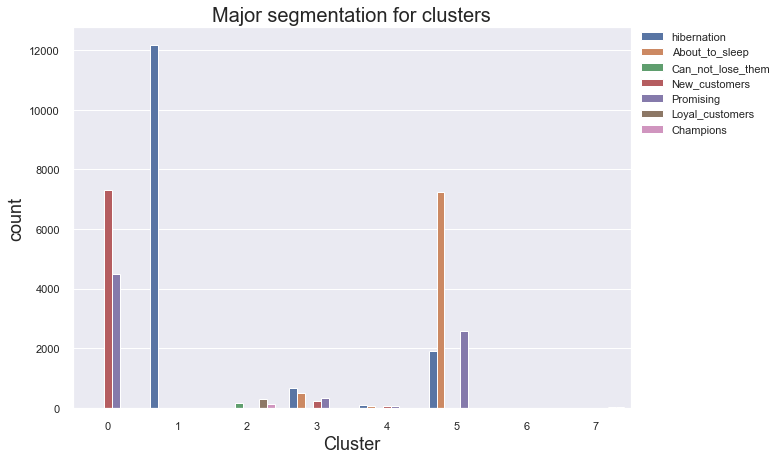

In [176]:
clusters_c(RFMScores_2, 'Cluster')

- The number of clusters is different for the dataset of last 3 months.

## 7.5. Mix Clusters<a class="anchor" id="section_7_5"></a>

- In this part, we will try to create clusters with KMeans from recency, frequency and monetary + others features.

In [177]:
df_3 = df[['customer_unique_id',
           'product_category_name',
           'product_name_lenght',
           'product_description_lenght',
           'product_photos_qty',
           'product_weight_g',
           'review_score']]

In [178]:
RFMScores_3 = RFMScores.drop(columns=['R',
                                      'F',
                                      'M',
                                      'RFMGroup',
                                      'Seg_Score',
                                      'Cluster'])

In [179]:
df_3 = pd.merge(df_3, RFMScores_3, on='customer_unique_id', how='left')

In [180]:
df_3.drop(columns='customer_unique_id', inplace=True)

In [181]:
df_3_prepared = data_transform(df_3[['product_category_name',
                                     'product_name_lenght',
                                     'product_description_lenght',
                                     'product_photos_qty',
                                     'product_weight_g',
                                     'review_score',
                                     'Recency',
                                     'Frequency',
                                     'Monetary']])

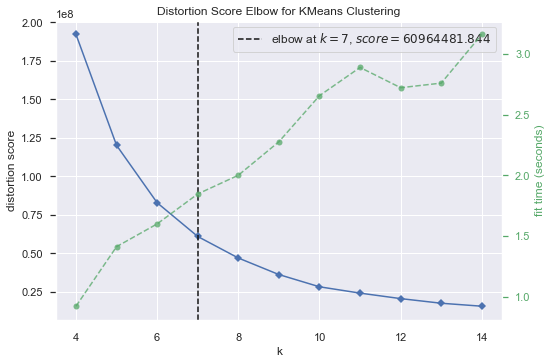

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [182]:
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(4, 15), random_state=42)

visualizer.fit(df_3_prepared.copy())
visualizer.poof()

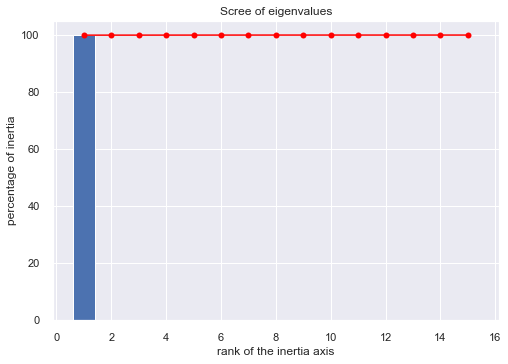

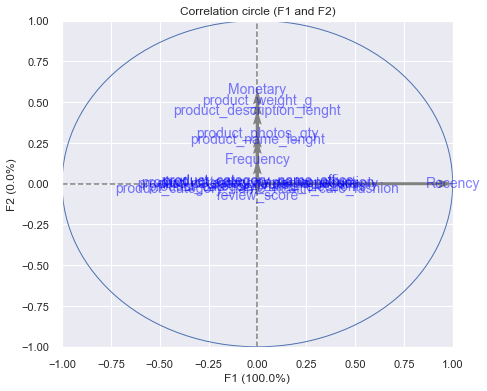

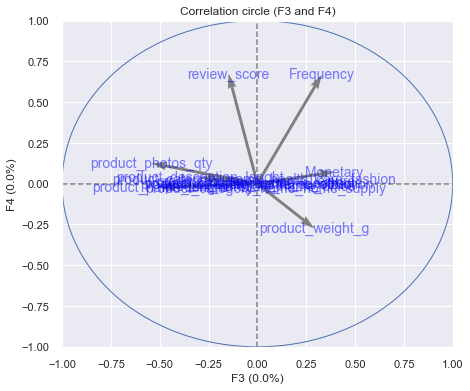

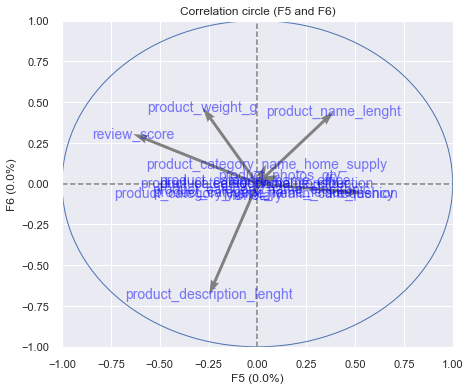

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


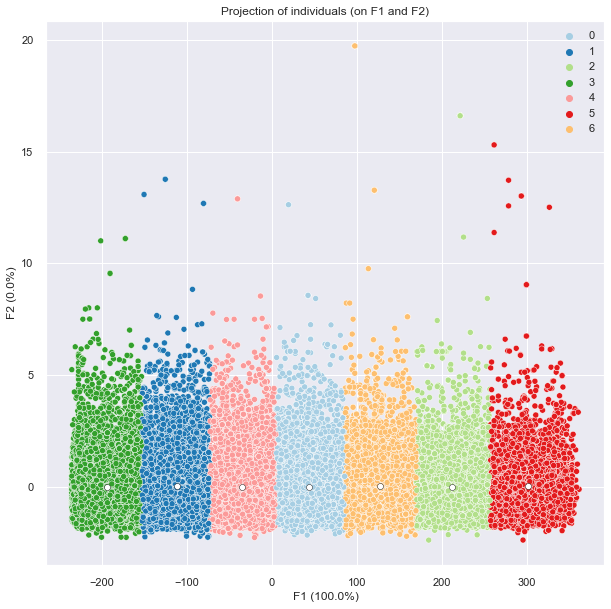

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


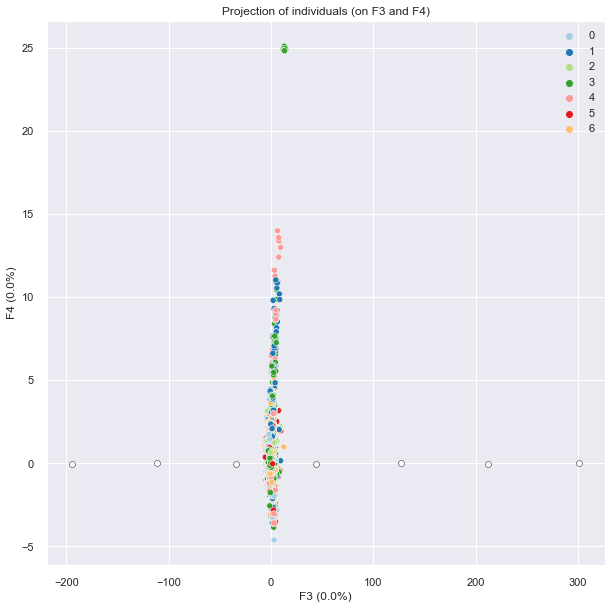

C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\melme\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


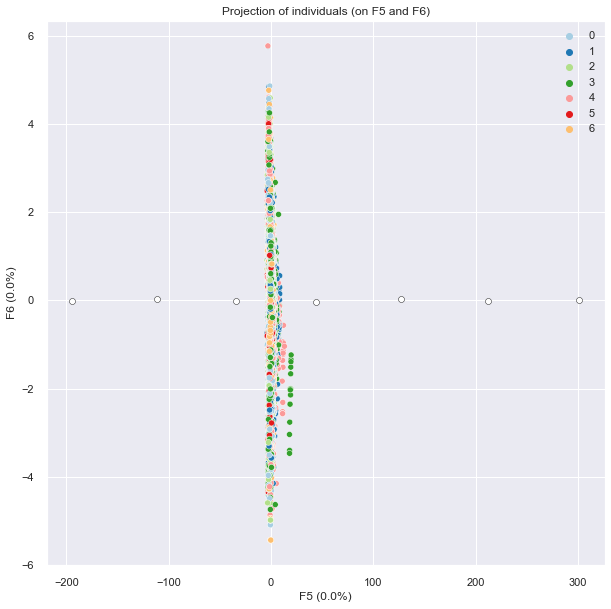

In [183]:
clustering_pca_kmeans(df_3_prepared.copy(), df_3_prepared.columns.tolist(), 7)

In [184]:
model = KMeans(7, random_state=42)

In [185]:
cluster_labels = model.fit_predict(df_3_prepared.copy())

silhouette_avg = silhouette_score(df_3_prepared.copy(), cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.5567714957241209


In [186]:
model.fit(df_3_prepared)
df_3['Cluster_3'] = model.predict(df_3_prepared)

Text(0, 0.5, 'Count')

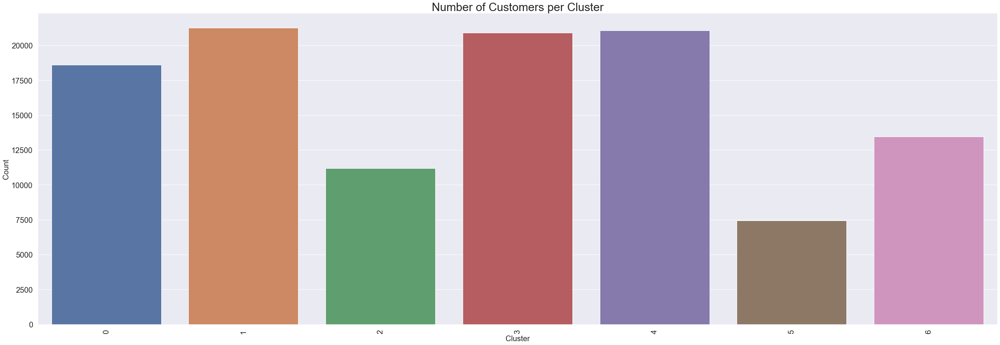

In [187]:
plt.figure(figsize=(45, 15))
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
sns.barplot(x=df_3['Cluster_3'].value_counts().index,
            y=df_3['Cluster_3'].value_counts())
plt.title('Number of Customers per Cluster', fontsize=30)
plt.xlabel('Cluster', size=20)
plt.ylabel('Count', size=20)

In [188]:
cluster_gp = df_3.groupby('Cluster_3').mean()

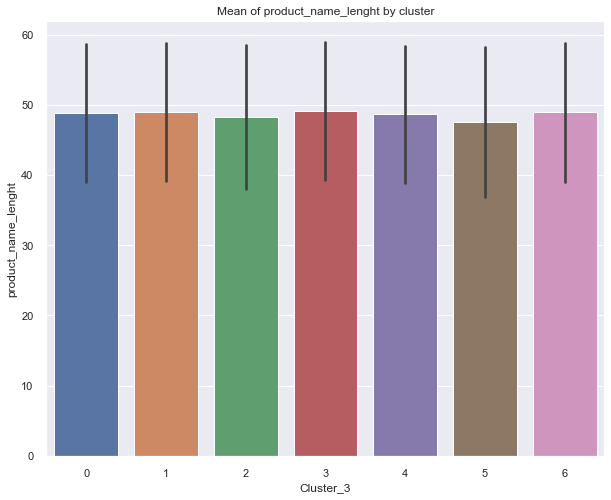

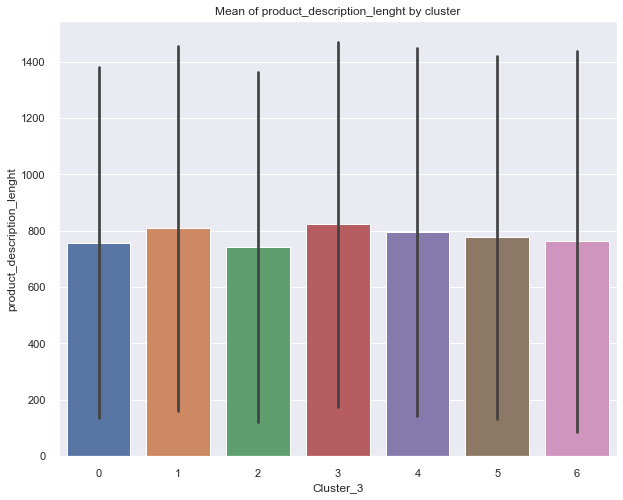

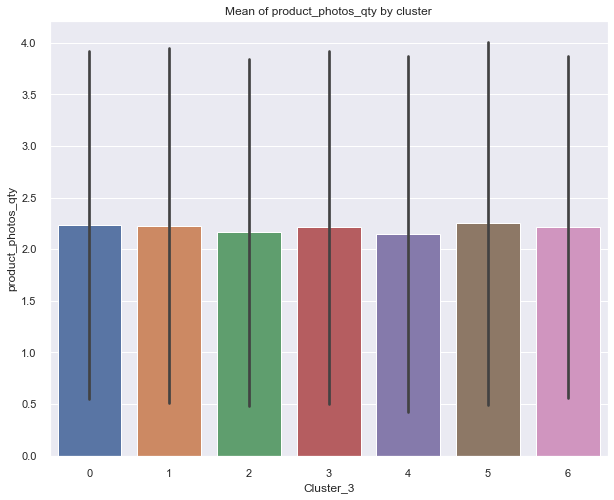

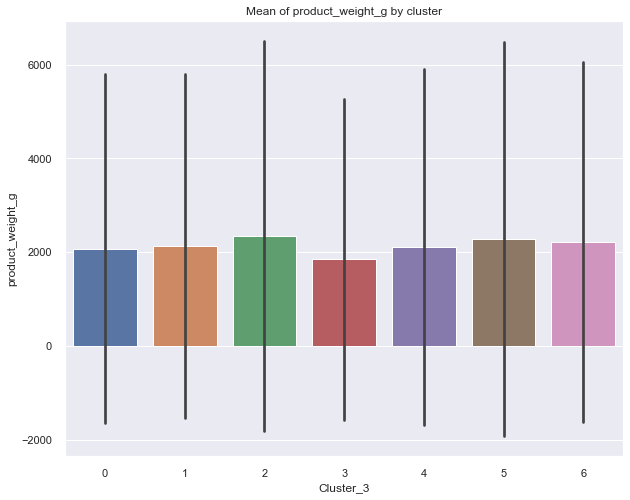

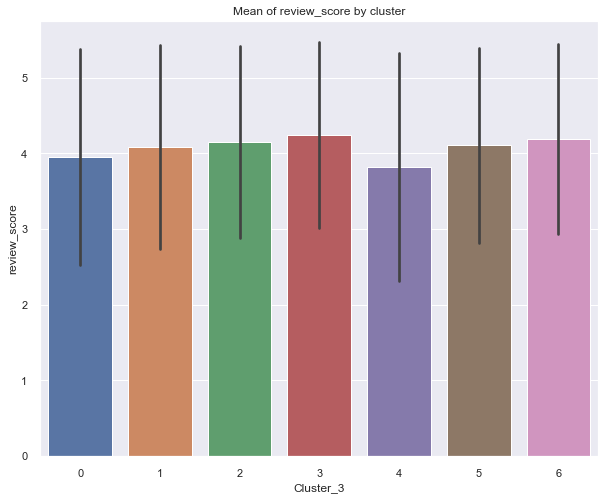

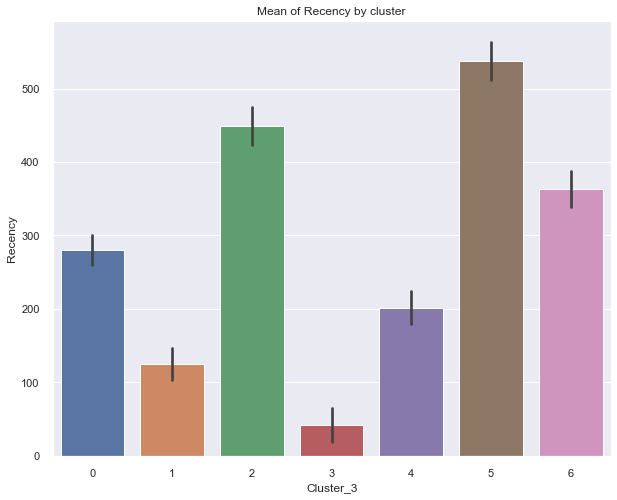

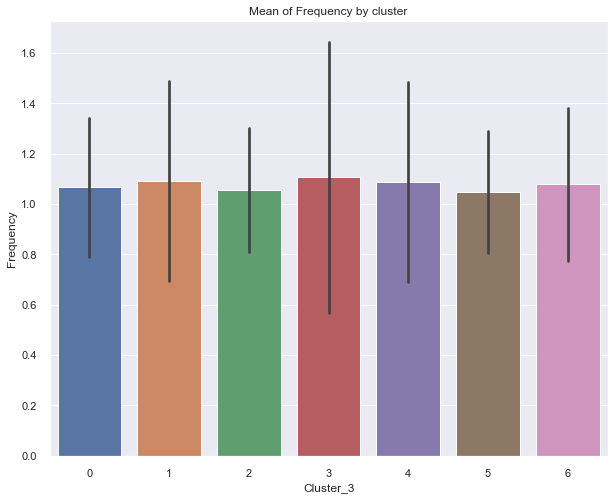

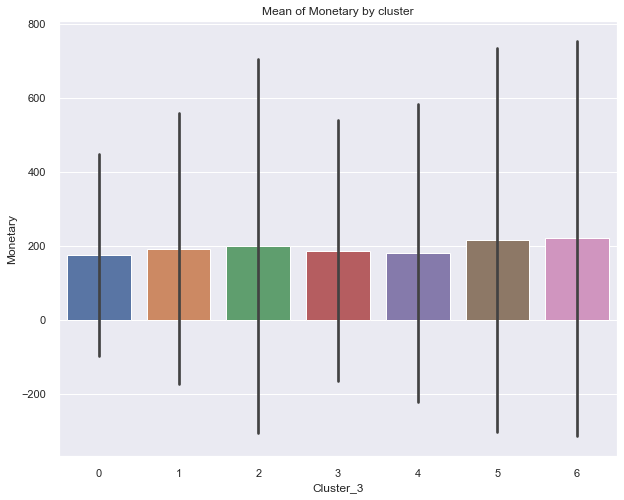

In [189]:
for i in cluster_gp.columns:
    plt.figure(figsize=(10, 8))
    plt.title('Mean of ' + str(i) + ' by cluster')
    sns.barplot(x='Cluster_3',
                y=i,
                data=df_3,
                ci="sd")
    plt.show()

- It seems that only the feature Recency was taken into account for the creation of the clusters.